> ### **OPTIMAL DATA RANGE**
---
*   ClipLimit: 2-3
*   Learning rate: 0.0001 < lr < 0.1
*   Batch size: 32, 64, 128
*   Dropout rate: 0,5 - 0,8
*   Weight: otomatis

> ### **STRUKTUR**
---

*   Optimizer: Adam
*   Activation function: ReLu (training), Softmax (final)
*   Pooling: _Max Pooling_
*   Kernel size: 130x242
*   Training/testing/validation: 70/10/20
*   Epoch: 30-65
*   Class: 7
*   Weight: ImageNet
*   Loss: Cross-Entropy

 ## **DATA PREPARATION**
---
menyiapkan data (termasuk penerapan image enhancement)

In [5]:
pip install -r "C:\Users\ardin\Downloads\requirements.txt"

     ---------------------------------------- 38.2/38.2 MB 1.9 MB/s eta 0:00:00
     -------------------------------------- 47.0/47.0 kB 593.5 kB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     -------------------------------------- 278.7/278.7 kB 2.1 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Created wheel for pydot: filename=pydot-1.2.3-py3-none-any.whl size=18942 sha256=73a25a2f835e5f687a131c5747f6344359d67736e9909adde93e82b8579cbd1a
  Stored in directory: c:\users\ardin\appdata\local\pip\cache\wheels\a8\0a\63\6ea0aa7a137559306d1c8886ac43d1f752c9fa90d45e1cbc7b
  Created wheel for pydotplus: filename=pydotplus-2.0.2-py3-none-any.whl size=24578 sha256=f9e62f8f50f932068fbb0b7aad4bccd9dd7dc6c36b9aa0715d32573d19e68527
  Stored in directory: c:\users\ardin\appdata\local\pip\cache\wheels\5c\94\1f\953aa60af58ef512e5256e538ff0772c340229e5996ac

In [1]:
import os
import cv2
import PIL
from PIL import Image
import matplotlib.pyplot as plt
from sklearn import preprocessing, neighbors
from sklearn.model_selection import train_test_split

In [2]:
path = r"D:\UNAIR\Semester_8\Skripsi\deteksi_nominal_vending_machine\datasetUang"

kelas = os.listdir(path)
print("Daftar kelas = ",kelas,"\n\nBanyak kelas = ", len(kelas))

Daftar kelas =  ['1000', '10000', '100000', '2000', '20000', '5000', '50000'] 

Banyak kelas =  7


In [3]:
import numpy as np
import matplotlib.pyplot as plt
def imageEnhancement(image):
  #eqhist biasa
  gray_img_eqhist=cv2.equalizeHist(image)

  #contrast Limited Adaptive Histogram Equalization
  clahe=cv2.createCLAHE(clipLimit=2)
  gray_img_clahe=clahe.apply(gray_img_eqhist)
  ####img = cv2_imshow(gray_img_clahe)
  return(gray_img_clahe)
  #return(gray_img_eqhist)

def imageSegmentation(image):
  from skimage import filters
  ret, otsu = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + 
                                            cv2.THRESH_OTSU)  
  return(otsu)

<PIL.Image.Image image mode=L size=552x246 at 0x19C735CECE0>
(246, 552)


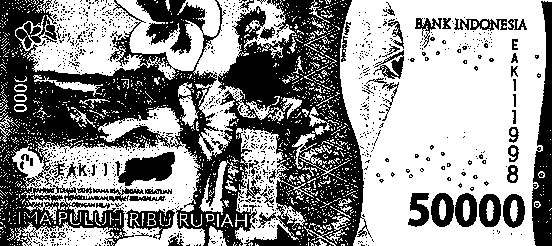

In [4]:
img = cv2.imread(r"D:\UNAIR\Semester_8\Skripsi\deteksi_nominal_vending_machine\datasetUang\50000\50k_b_2022_14.png")
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
x = imageEnhancement(img)
x = imageSegmentation(x)

z = PIL.Image.fromarray(x)
print(z)

print(img.shape)

PIL.Image.fromarray(x)

In [5]:
arrayNomer = os.listdir(path)
dataset = "datasetPreprocessing"
from os import listdir,makedirs
from os.path import isfile,join

def preprocessing(path,dspath,nilaike):
  path = path #path
  dstpath = dataset #folder tujuan
  arrayNomer = os.listdir(path)
  n=nilaike

  try:
      makedirs(dstpath+'/'+arrayNomer[n])
  except:
      print ("Direktori sudah ada, citra akan di-replace dalam direktori yang sama")

  for dirs in path:
    #print(os.listdir(path))
    files = [f for f in listdir(path+'/'+arrayNomer[n]+'/') if isfile(join(path+'/'+arrayNomer[n]+'/',f))]
    for image in files:
      try:
            img = cv2.imread(os.path.join(path+'/'+arrayNomer[n]+'/',image))
            gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
            file = join(dstpath+'/'+arrayNomer[n]+'/',image)
            enhance = imageEnhancement(gray)
            otsu = imageSegmentation(enhance)
            y = PIL.Image.fromarray(otsu)
            y.save(file) #menyimpan file
      except:
            print ("{} is not converted".format(image))

In [6]:
for i in range (len(arrayNomer)):
  print("Berhasil me-load kelas",arrayNomer[i])
  preprocessing(path,dataset,i)

Berhasil me-load kelas 1000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 10000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 100000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 2000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 20000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 5000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama
Berhasil me-load kelas 50000
Direktori sudah ada, citra akan di-replace dalam direktori yang sama


In [6]:
import os

dataset="datasetPreprocessing"
def daftar_file(startpath):
    for root, dirs, files in os.walk(startpath):
        level = root.replace(startpath, '').count(os.sep)
        indent = ' ' * 4 * (level)
        print('{}{}/'.format(indent, os.path.basename(root)))
        subindent = ' ' * 4 * (level + 1)
        for f in files:
            print('{}{}'.format(subindent, f))

daftar_file(dataset)

datasetPreprocessing/
    1000/
        1k_b_2016_1.png
        1k_b_2016_10.png
        1k_b_2016_11.png
        1k_b_2016_12.png
        1k_b_2016_13.png
        1k_b_2016_14.png
        1k_b_2016_15.png
        1k_b_2016_16.png
        1k_b_2016_17.png
        1k_b_2016_18.png
        1k_b_2016_19.png
        1k_b_2016_2.png
        1k_b_2016_20.png
        1k_b_2016_21.png
        1k_b_2016_22.png
        1k_b_2016_23.png
        1k_b_2016_24.png
        1k_b_2016_25.png
        1k_b_2016_3.png
        1k_b_2016_4.png
        1k_b_2016_5.png
        1k_b_2016_6.png
        1k_b_2016_7.png
        1k_b_2016_8.png
        1k_b_2016_9.png
        1k_b_2022_1.png
        1k_b_2022_10.png
        1k_b_2022_11.png
        1k_b_2022_12.png
        1k_b_2022_13.png
        1k_b_2022_14.png
        1k_b_2022_15.png
        1k_b_2022_16.png
        1k_b_2022_17.png
        1k_b_2022_18.png
        1k_b_2022_19.png
        1k_b_2022_2.png
        1k_b_2022_20.png
        1k_b_2022_21.png
    

In [36]:
!pip install split-folders

In [8]:
import splitfolders
splitfolders.ratio(dataset, output="datasetSplit", seed=1307, ratio=(0.7, 0.2, 0.1)) #70% : 10% : 20%

Copying files: 700 files [00:04, 142.82 files/s]


In [7]:
dataset = "datasetSplit"
daftar_file(dataset)

datasetSplit/
    test/
        1000/
            1k_b_2016_24.png
            1k_b_2022_23.png
            1k_b_2022_6.png
            1k_b_2022_8.png
            1k_d_2016_13.png
            1k_d_2016_15.png
            1k_d_2016_23.png
            1k_d_2016_8.png
            1k_d_2022_21.png
            1k_d_2022_22.png
        10000/
            10k_b_2016_24.png
            10k_b_2022_23.png
            10k_b_2022_6.png
            10k_b_2022_8.png
            10k_d_2016_13.png
            10k_d_2016_15.png
            10k_d_2016_23.png
            10k_d_2016_8.png
            10k_d_2022_21.png
            10k_d_2022_22.png
        100000/
            100k_b_2016_24.png
            100k_b_2022_23.png
            100k_b_2022_6.png
            100k_b_2022_8.png
            100k_d_2016_13.png
            100k_d_2016_15.png
            100k_d_2016_23.png
            100k_d_2016_8.png
            100k_d_2022_21.png
            100k_d_2022_22.png
        2000/
            2k_b_2016_24.p

In [8]:
import pandas as pd
import random
from IPython.display import Image
import matplotlib.pyplot as plt
import seaborn as sns

from keras.utils import plot_model
from sklearn.metrics import classification_report
from collections import Counter
import tensorflow as tf

import keras
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.callbacks import ReduceLROnPlateau
from tensorflow.keras.applications.vgg16 import VGG16

from keras import Model, layers
from keras.models import Sequential
from keras.optimizers import Adam, SGD
from keras.layers import GlobalMaxPooling2D, GlobalAveragePooling2D, Dropout, Dense, Input, Conv2D, MaxPooling2D, Flatten,MaxPooling3D

In [9]:
IMAGE_SIZE = (130, 242, 3)
dataset="datasetSplit"
train_pred_test_folders = os.listdir(dataset)
train_path = dataset+'/train'
test_path = dataset+'/test'
val_path = dataset+'/val'

Banyak citra di training set: 490
Banyak citra di testing set: 70
Banyak citra di prediction set: 140
Total citra: 700


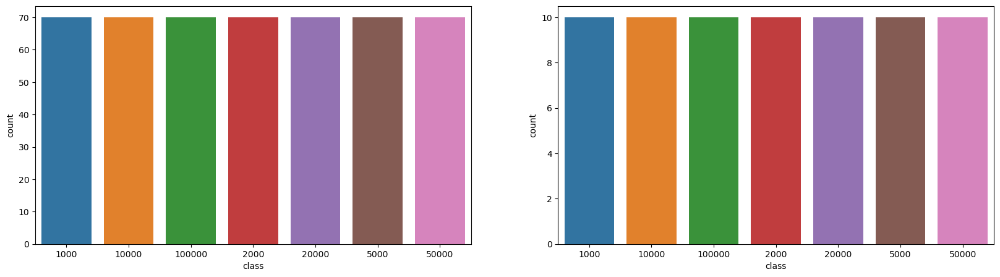

In [10]:
quantity_train = {} 
quantity_test = {}
quantity_val = {}
for folder in os.listdir(train_path):
    quantity_train[folder] = len(os.listdir(train_path+'/'+folder))

for folder in os.listdir(test_path):
    quantity_test[folder] = len(os.listdir(test_path+'/'+folder))

for folder in os.listdir(val_path):
    quantity_val[folder] = len(os.listdir(val_path+'/'+folder))

quantity_train = pd.DataFrame(list(quantity_train.items()), index=range(0,len(quantity_train)), columns=['class','count'])
quantity_test = pd.DataFrame(list(quantity_test.items()), index=range(0,len(quantity_test)), columns=['class','count'])
quantity_val = pd.DataFrame(list(quantity_val.items()), index=range(0,len(quantity_val)), columns=['class','count'])

figure, ax = plt.subplots(1,2,figsize=(20,5))
sns.barplot(x='class',y='count',data=quantity_train,ax=ax[0])
sns.barplot(x='class',y='count',data=quantity_test,ax=ax[1])

print("Banyak citra di training set:", sum(quantity_train['count'].values))
print("Banyak citra di testing set:",sum(quantity_test['count'].values))
print("Banyak citra di prediction set:",sum(quantity_val['count'].values))
print("Total citra:",sum(quantity_train['count'].values)+sum(quantity_test['count'].values)+sum(quantity_val['count'].values))

plt.show()

In [11]:
def save_history(i, history, model_name):
    #convert the history.history dict to a pandas DataFrame:     
    hist_df = pd.DataFrame(history.history) 

    # save ke json 
    hist_json_file = 'percobaan'+str(i)+'/'+model_name+'_history.json' 
    with open(hist_json_file, mode='w') as f:
        hist_df.to_json(f)

    # or save ke csv 
    hist_csv_file = 'percobaan'+str(i)+'/'+model_name+'_history.csv'
    with open(hist_csv_file, mode='w') as f:
        hist_df.to_csv(f)
        
def plot_accuracy_from_history(history, isinception=False):
  try:
    color = sns.color_palette()
    if(isinception == False):
        acc = history.history['acc']
        val_acc = history.history['val_acc']
    else:
        acc = history.history['accuracy']
        val_acc = history.history['val_accuracy']
    

    epochs = range(len(acc))

    sns.lineplot(epochs, acc, label='Training Accuracy')
    sns.lineplot(epochs, val_acc,label='Validation Accuracy')
    plt.title('Training and Validation Accuracy')
    plt.legend()
    plt.figure()
    plt.show()
  except TypeError:
    pass
    
def plot_loss_from_history(history):
  try:
    color = sns.color_palette()
    loss = history.history['loss']
    val_loss = history.history['val_loss']
    
    epochs = range(len(loss))
    
    sns.lineplot(epochs, loss,label='Training Loss')
    sns.lineplot(epochs, val_loss, label='Validation Loss')
    plt.title('Training and Validation Loss')
    plt.legend()
    plt.figure()
    plt.show()
  except TypeError:
    pass
    
def do_history_stuff(i, history, history_file_name, isinception=False):
    save_history(i, history, history_file_name)
    plot_accuracy_from_history(history, isinception)
    plot_loss_from_history(history)

In [12]:
def show_few_images(number_of_examples=2, predict_using_model=None):
    figure1, ax1 = plt.subplots(number_of_examples,len(os.listdir(train_path)), figsize=(20,4*number_of_examples))
    ax1 = ax1.reshape(-1)
    axoff_fun = np.vectorize(lambda ax:ax.axis('off'))
    axoff_fun(ax1)
    axs = 0
    for i, folder in enumerate(os.listdir(train_path)):
        image_ids = os.listdir(os.path.join(train_path,folder))
        for j in [random.randrange(0, len(image_ids)) for i in range(0,number_of_examples)]:
            display = plt.imread(os.path.join(train_path,folder,image_ids[j]))
            plt.axis('off')
            ax1[axs].imshow(display)
            title = 'True:'+folder
            if(predict_using_model):
                predicted_classname = inv_map_classes[np.argmax(vgg16_final_model.predict(np.array([display])))]
                title = title+'\nPredict :'+predicted_classname
            ax1[axs].set_title(title)
            axs=axs+1

In [13]:
tf.keras.backend.clear_session()

In [14]:
import os
def savePercobaan(i):
  try: 
    os.mkdir("percobaan"+str(i)) 
  except OSError as error: 
    print(error)
  saveModel(i)

In [15]:
def saveModel(i):
  try: 
    os.mkdir("percobaan"+str(i)+"/model") 
  except OSError as error: 
    print(error)

 ## **VGG-16**
---
Visual Geometry Group (16 layers)

#### **<font color='Pink'>Data Generator</font>**

In [16]:
#normalisasi
train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
train_generator16 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
test_generator16 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
    batch_size=1,
    shuffle=True,
    class_mode='categorical')

validation_generator16 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.


In [17]:
inv_map_classes = {v: k for k, v in validation_generator16.class_indices.items()}
#print(validation_generator16.class_indices)
print(inv_map_classes)

{0: '1000', 1: '10000', 2: '100000', 3: '2000', 4: '20000', 5: '5000', 6: '50000'}


#### **<font color='Pink'>Hyperparameter</font>**

In [18]:
import itertools
import random

array = [['ep1','ep2','ep3','ep4'], ['lr1', 'lr2', 'lr3', 'lr4'], [32, 64, 128], ['dr1', 'dr2', 'dr3', 'dr4']]

parameter = []
lr_values = array[1][1:]  

for _ in range(1):
    updated_array = [array[0], ['lr1'] + lr_values, array[2], array[3]]
    parameter.extend(list(itertools.product(*updated_array)))

parameter = [
    [
        random.randint(30, 38) if val == 'ep1' else
        random.randint(39, 47) if val == 'ep2' else
        random.randint(48, 56) if val == 'ep3' else
        random.randint(57, 65) if val == 'ep4' else

        random.uniform(0.0001, 0.0250249) if val == 'lr1' else
        random.uniform(0.025025, 0.050049) if val == 'lr2' else
        random.uniform(0.05005, 0.0750749) if val == 'lr3' else
        random.uniform(0.075075, 0.1) if val == 'lr4' else

        random.uniform(0.5,0.5749) if val == 'dr1' else
        random.uniform(0.575,0.649) if val == 'dr2' else
        random.uniform(0.65,0.7249) if val == 'dr3' else
        random.uniform(0.725,0.8) if val == 'dr4' else

        val
        for val in kombinasi
    ]
    for kombinasi in parameter
]

In [19]:
for kombinasi in parameter:
    print(kombinasi)

[38, 0.019442808076887756, 32, 0.5146504294550862]
[38, 0.017129605804503536, 32, 0.5927253384246391]
[35, 0.00992454124897083, 32, 0.6580551957225446]
[33, 0.010147295277505566, 32, 0.7332976562489832]
[30, 0.0023722848949886484, 64, 0.5517682888991614]
[30, 0.0034351561508585778, 64, 0.6151850658273471]
[32, 0.02300385830061037, 64, 0.7006874526301345]
[34, 0.009045860607425299, 64, 0.7862547017953195]
[32, 0.009628736520615667, 128, 0.5391566585356424]
[35, 0.01690803383296524, 128, 0.6235469353443731]
[37, 0.006432978072379696, 128, 0.7127546288443984]
[34, 0.006217196558717128, 128, 0.7664044985337977]
[36, 0.04344489935703379, 32, 0.5615353650072809]
[33, 0.03475439628356376, 32, 0.583542700596046]
[36, 0.04748518782721335, 32, 0.721745314661354]
[36, 0.03030766260254901, 32, 0.7819563041495408]
[32, 0.02572343510765236, 64, 0.5178149759704372]
[35, 0.032109735976772545, 64, 0.5914579013665149]
[31, 0.04943862253539433, 64, 0.6617153869723998]
[37, 0.02516862395450296, 64, 0.7777

#### **<font color='Pink'>Model Training</font>**

In [19]:
from keras.layers import BatchNormalization
def vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate):
  vgg16_model = VGG16(pooling='max', weights='imagenet', include_top=False, input_shape=(130,242,3), classes=7) #defaultnya AVERAGE POOLING
  for layers in vgg16_model.layers:
              layers.trainable=False

  last_output_vgg16 = vgg16_model.layers[-1].output
  vgg_16 = Flatten()(last_output_vgg16) #awalnya di bawah last output
  vgg_16 = BatchNormalization()(vgg_16)
  vgg_16 = Dense(128, activation = 'relu')(vgg_16)
  vgg_16 = BatchNormalization()(vgg_16)
  vgg_16 = Dropout(dropout_rate)(vgg_16)

  #vgg_16 = Dense(64, activation = 'relu')(vgg_16)
  #vgg_16 = Dropout(dropout_rate)(vgg_16)
  vgg_16 = Dense(7, activation = 'softmax')(vgg_16)
  vgg16_final_model = Model(vgg16_model.input, vgg_16)
  
  opt = Adam(learning_rate=learning_rate)
  vgg16_final_model.compile(loss = 'categorical_crossentropy', optimizer= opt, metrics=['acc'])
  #vgg16_final_model.summary()

  plot_model(model=vgg16_final_model, show_shapes=True)

  train_generator16.batch_size = batch_size

  vgg16_filepath = 'percobaan'+str(i)+'/model/vgg_16_'+str(i)+'-saved-model-{epoch:02d}-acc-{val_acc:.2f}.hdf5'
  vgg16_checkpoint = tf.keras.callbacks.ModelCheckpoint(vgg16_filepath, monitor='val_acc', verbose=1, save_best_only=True, mode='max')
  early_stopping = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=5)
  vgg16_history = vgg16_final_model.fit(train_generator16, epochs = vgg_epoch, validation_data = validation_generator16,callbacks=[vgg16_checkpoint,early_stopping],verbose=1)

  do_history_stuff(i, vgg16_history, 'vgg16_model')
  save_vgg16(i, vgg16_final_model)

  predictionTest(i, vgg16_final_model)

  return(vgg16_final_model)

In [20]:
def save_vgg16(i, vgg16_final_model):
  vgg16_final_model.save(('percobaan'+str(i)+'/vgg16-model'+str(i)+'.h5'))

#### **<font color='Pink'>Evaluation</font>**

In [21]:
def acc_plot(vgg16_history):
  plt.figure(figsize=(10, 8))
  plt.plot(vgg16_history.history['acc'], label='train acc')
  plt.plot(vgg16_history.history['val_acc'], label='val acc')
  plt.legend()
  plt.title('Accuracy')
  plt.show()

In [22]:
def loss_plot(vgg16_history):
  plt.figure(figsize=(10, 8))
  plt.plot(vgg16_history.history['loss'], label='train loss')
  plt.plot(vgg16_history.history['val_loss'], label='val loss')
  plt.legend()
  plt.title('Loss')
  plt.show()

In [23]:
def predictionTest(i, vgg16_final_model):
  true_value = []
  vgg_pred = []
  for folder in os.listdir(test_path):
      test_image_ids = os.listdir(os.path.join(test_path,folder))
      
      for image_id in test_image_ids[:int(len(test_image_ids))]:
          path = os.path.join(test_path,folder,image_id)
          #print(path)
          true_value.append(test_generator16.class_indices[folder])
          img = cv2.resize(cv2.imread(path),(242,130))
          img_normalized = img/255
          #vgg
          vgg16_image_prediction = np.argmax(vgg16_final_model.predict(np.array([img_normalized]), verbose = 0)) #verbose biar gak ngeprint
          vgg_pred.append(vgg16_image_prediction)

  print("\n")
  clf_report(i, true_value, vgg_pred)

In [24]:
arr_accuracy16 = []
from sklearn.metrics import confusion_matrix
import itertools
#from mlxtend.plotting import plot_confusion_matrix
def clf_report(k, true_value, model_pred):
    classes = validation_generator16.class_indices.keys()
    TP_count = [true_value[i] == model_pred[i] for i in range(len(true_value))]
    model_accuracy = np.sum(TP_count)/len(TP_count)
    print('Model Accuracy', model_accuracy)
    arr_accuracy16.append(model_accuracy)
    plt.figure(figsize=(7,7))
    cm = confusion_matrix(true_value,model_pred)
    plt.imshow(cm,interpolation='nearest',cmap=plt.cm.viridis)
    plt.title('Confusion Matrix')
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)
    thresh = cm.max()*0.8
    for i,j in itertools.product(range(cm.shape[0]),range(cm.shape[1])):
        plt.text(j,i,cm[i,j],
                horizontalalignment="center",
                color="black" if cm[i,j] > thresh else "white")
        pass
    
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    pass
    
    plt.savefig("percobaan"+str(k)+"/conf_matrix"+str(k)+".png")
    print(classification_report(true_value, model_pred, target_names = list(classes)))

In [26]:
print(validation_generator16.class_indices.keys())

dict_keys(['1000', '10000', '100000', '2000', '20000', '5000', '50000'])


In [23]:
hasilTabel = pd.DataFrame(columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate','Accuracy'])
print(hasilTabel)

Empty DataFrame
Columns: [Epoch, Learning Rate, Batch Size, Dropout Rate, Accuracy]
Index: []


#### **<font color='Pink'>Code Running</font>**

Percobaan ke- 1 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.007484397644265163
batch size: 32
dropout rate: 0.5130139039940483
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/32
16/16 [==============================] - ETA: 0s - loss: 2.1509 - acc: 0.3571
Epoch 1: val_acc improved from -inf to 0.30000, saving model to percobaan1/model\vgg_16_1-saved-model-01-acc-0.30.hdf5
16/16 [==============================] - 35s 2s/step - loss: 2.1509 - acc: 0.3571 - val_loss: 2.2923 - val_acc: 0.3000
Epoch 2/32
16/16 [==============================] - ETA: 0s - loss: 1.1550 - acc: 0.5816
Epoch 2: val_acc improved from 0.30000 to 0.40000, saving model to percobaan1/model\vgg_16_1-saved-model-02-acc-0.40.hdf5
16/16 [==============================] - 33s 2s/step - loss: 1.1550 - acc: 0.5816 - val_loss: 1.8690 - val_acc: 0.4000
Epoch 3/32
16/16 [=======

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.88      0.70      0.78        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.20      0.33        10
        2000       1.00      0.20      0.33        10
       20000       1.00      0.60      0.75        10
        5000       0.31      1.00      0.48        10
       50000       0.45      0.90      0.60        10

    accuracy                           0.51        70
   macro avg       0.66      0.51      0.47        70
weighted avg       0.66      0.51      0.47        70

────────────────────────────────────────────────────────────────────────────────────────────────────


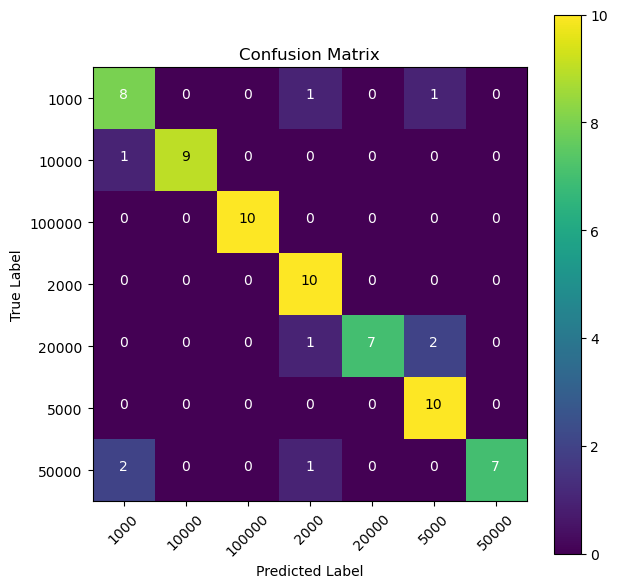

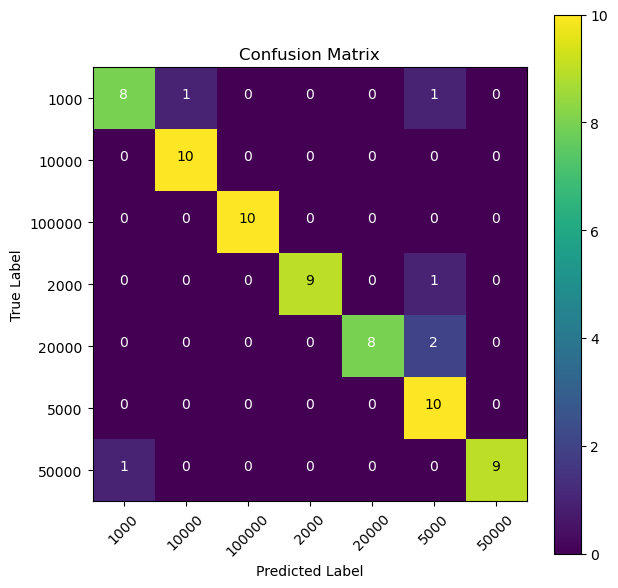

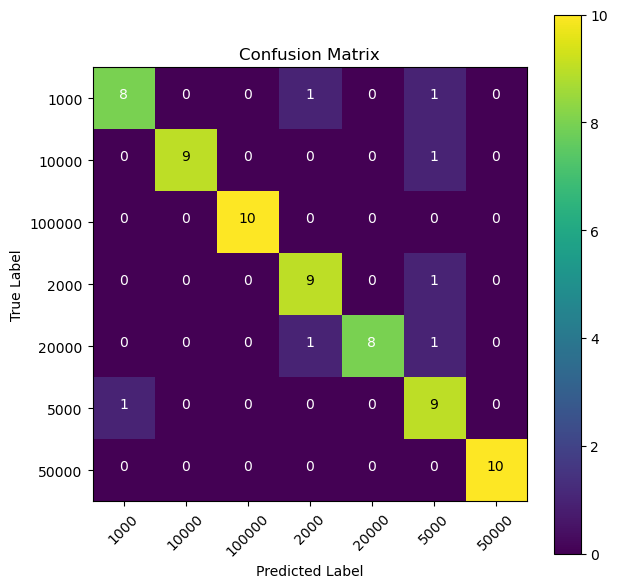

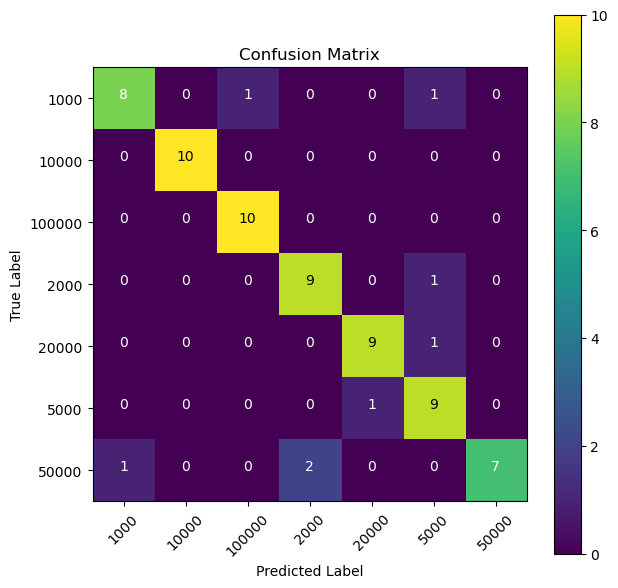

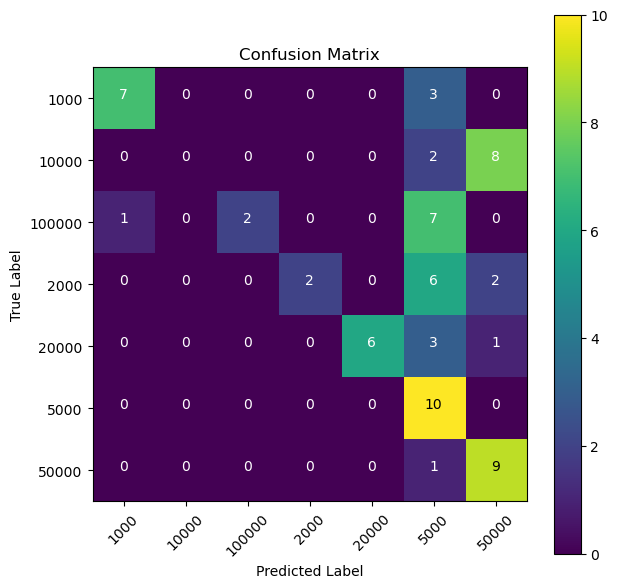

In [31]:
i = 0
#for i in len(parameter):
for i in range (0,5): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 6 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 33
learning rate: 0.020090839446230722
batch size: 64
dropout rate: 0.6002202126024293
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/33
8/8 [==============================] - ETA: 0s - loss: 2.5098 - acc: 0.3143
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan6/model\vgg_16_6-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 37s 5s/step - loss: 2.5098 - acc: 0.3143 - val_loss: 5.1304 - val_acc: 0.1929
Epoch 2/33
8/8 [==============================] - ETA: 0s - loss: 1.3579 - acc: 0.5531
Epoch 2: val_acc improved from 0.19286 to 0.36429, saving model to percobaan6/model\vgg_16_6-saved-model-02-acc-0.36.hdf5
8/8 [==============================] - 35s 5s/step - loss: 1.3579 - acc: 0.5531 - val_loss: 3.1213 - val_acc: 0.3643
Epoch 3/33
8/8 [=================

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.57      0.40      0.47        10
       10000       1.00      0.50      0.67        10
      100000       1.00      0.10      0.18        10
        2000       0.00      0.00      0.00        10
       20000       0.40      0.60      0.48        10
        5000       0.26      1.00      0.42        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.43        70
   macro avg       0.60      0.43      0.40        70
weighted avg       0.60      0.43      0.40        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 10 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.0015704734419347466
batch size: 128
dropout rate: 0.6330289287026473
──────────────────────────────────────────────────────────────────────────────────

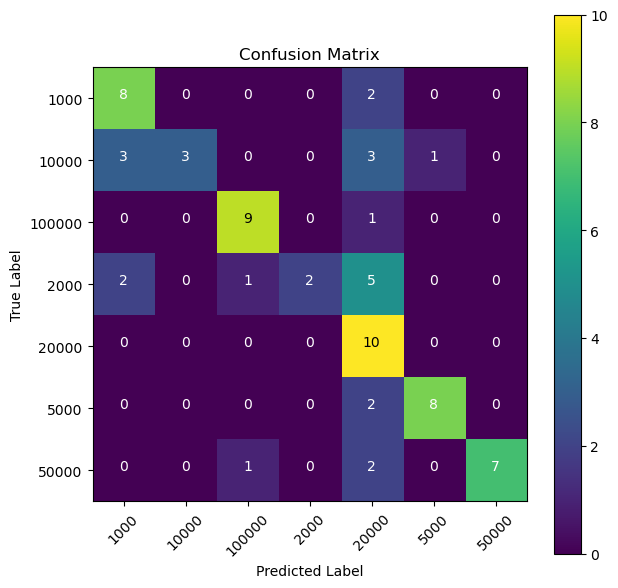

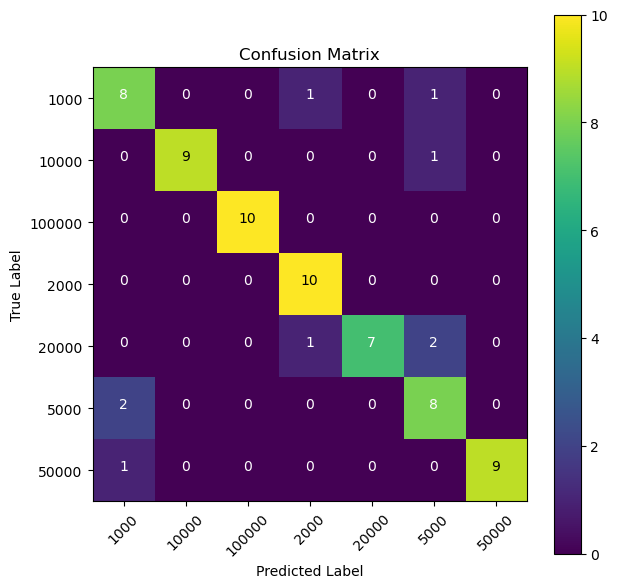

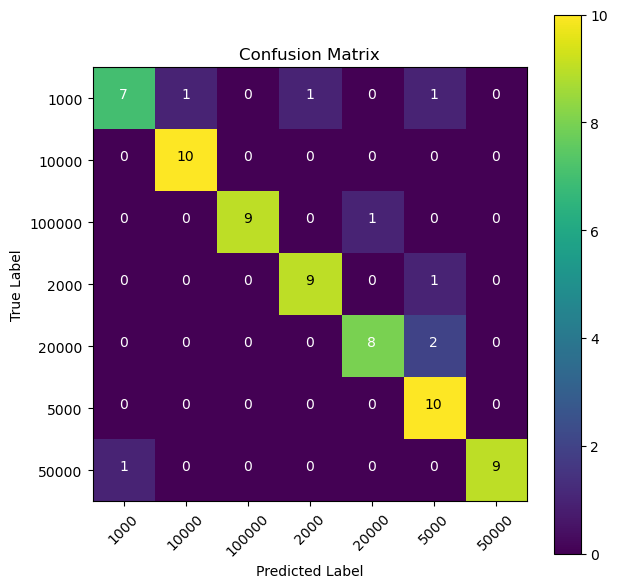

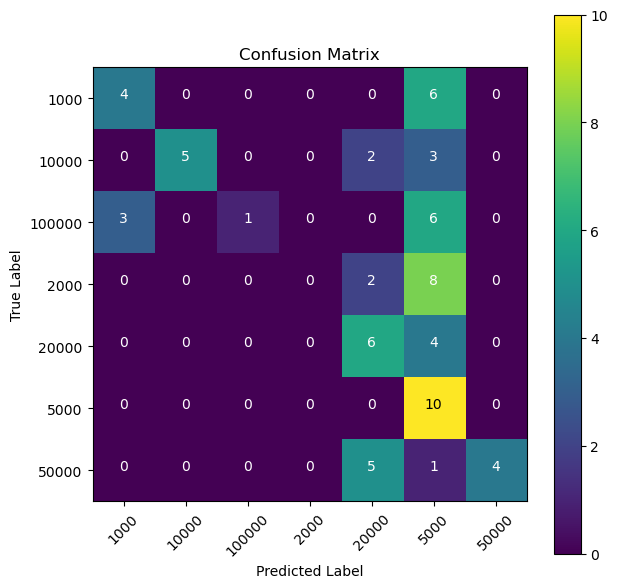

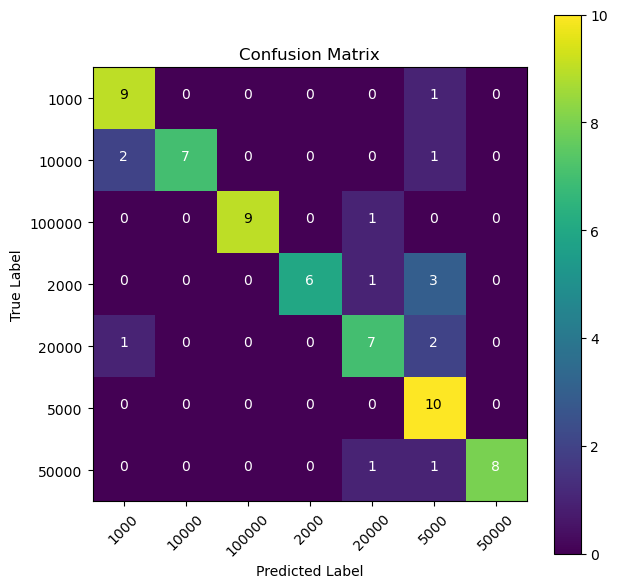

In [32]:
i = 0
#for i in len(parameter):
for i in range (5,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 11 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.005876316711208642
batch size: 128
dropout rate: 0.6561225525980904
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/36
4/4 [==============================] - ETA: 0s - loss: 3.2602 - acc: 0.2020
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan11/model\vgg_16_11-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 39s 9s/step - loss: 3.2602 - acc: 0.2020 - val_loss: 2.4244 - val_acc: 0.1500
Epoch 2/36
4/4 [==============================] - ETA: 0s - loss: 1.8716 - acc: 0.4184
Epoch 2: val_acc improved from 0.15000 to 0.20714, saving model to percobaan11/model\vgg_16_11-saved-model-02-acc-0.21.hdf5
4/4 [==============================] - 34s 9s/step - loss: 1.8716 - acc: 0.4184 - val_loss: 1.8754 - val_acc: 0.2071
Epoch 3/36
4/4 [===========

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.20      0.33        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.10      0.18        10
        2000       1.00      0.10      0.18        10
       20000       0.32      0.80      0.46        10
        5000       0.25      1.00      0.40        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.33        70
   macro avg       0.65      0.33      0.25        70
weighted avg       0.65      0.33      0.25        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 12 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.012448964391591814
batch size: 128
dropout rate: 0.7436478902919142
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.73      0.80      0.76        10
       10000       1.00      0.30      0.46        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.28      0.80      0.41        10
        5000       0.45      0.90      0.60        10
       50000       1.00      0.50      0.67        10

    accuracy                           0.50        70
   macro avg       0.64      0.50      0.46        70
weighted avg       0.64      0.50      0.46        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 13 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.026907174848988722
batch size: 32
dropout rate: 0.5286602958331379
────────────────────────────────────────────────────────────────────────────────────

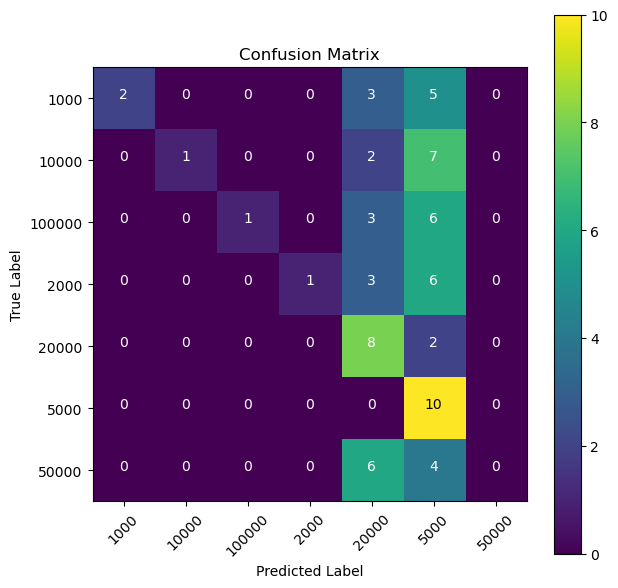

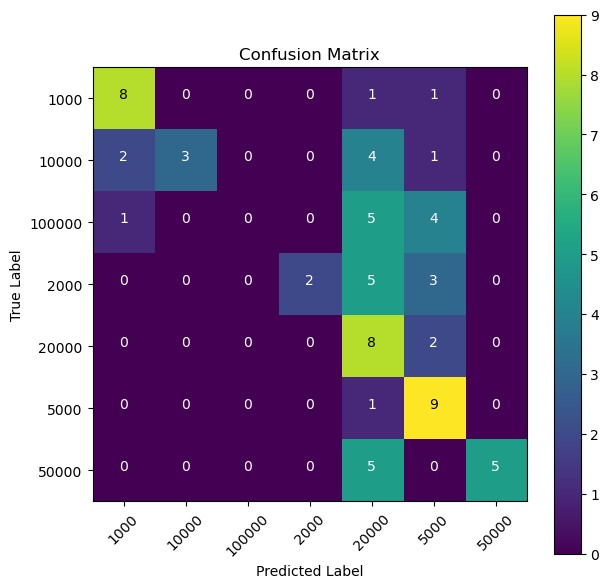

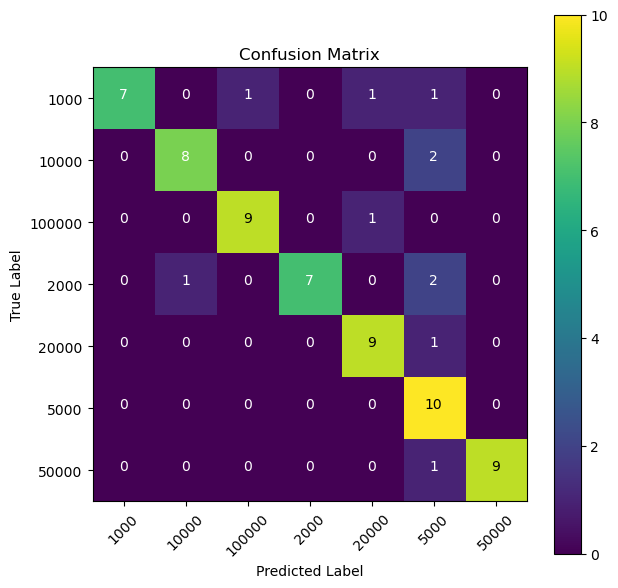

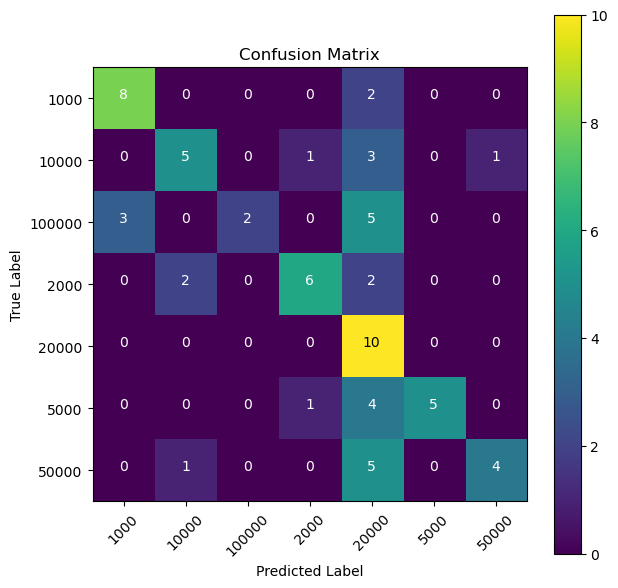

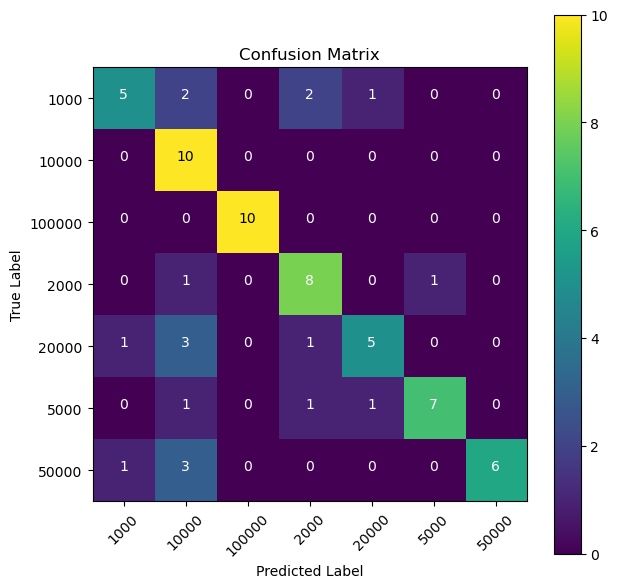

In [33]:
i = 0
#for i in len(parameter):
for i in range (10,15): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

[WinError 183] Cannot create a file when that file already exists: 'percobaan16'
[WinError 183] Cannot create a file when that file already exists: 'percobaan16/model'
Percobaan ke- 16 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 35
learning rate: 0.04544969366841195
batch size: 32
dropout rate: 0.7694886667838358
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/35
16/16 [==============================] - ETA: 0s - loss: 3.9942 - acc: 0.2102
Epoch 1: val_acc improved from -inf to 0.30000, saving model to percobaan16/model\vgg_16_16-saved-model-01-acc-0.30.hdf5
16/16 [==============================] - 37s 2s/step - loss: 3.9942 - acc: 0.2102 - val_loss: 3.4788 - val_acc: 0.3000
Epoch 2/35
16/16 [==============================] - ETA: 0s - loss: 2.8778 - acc: 0.2776
Epoch 2: val_acc did not improve from 0.30000
16/16 [==============================] - 36s 2s/st

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.75      0.30      0.43        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.30      0.46        10
       20000       0.20      0.80      0.32        10
        5000       0.47      0.90      0.62        10
       50000       0.67      0.20      0.31        10

    accuracy                           0.37        70
   macro avg       0.58      0.37      0.33        70
weighted avg       0.58      0.37      0.33        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 18 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 38
learning rate: 0.04171573967849611
batch size: 64
dropout rate: 0.6374947709460079
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


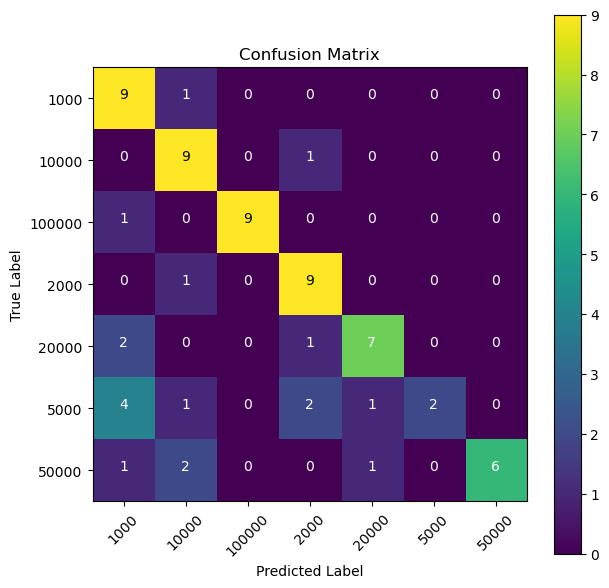

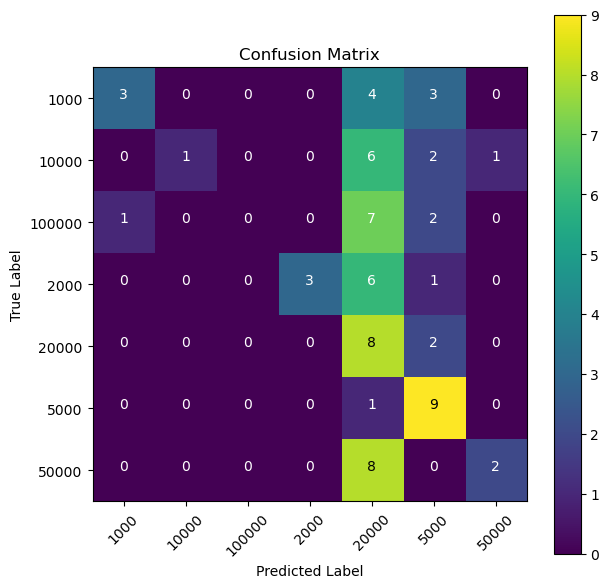

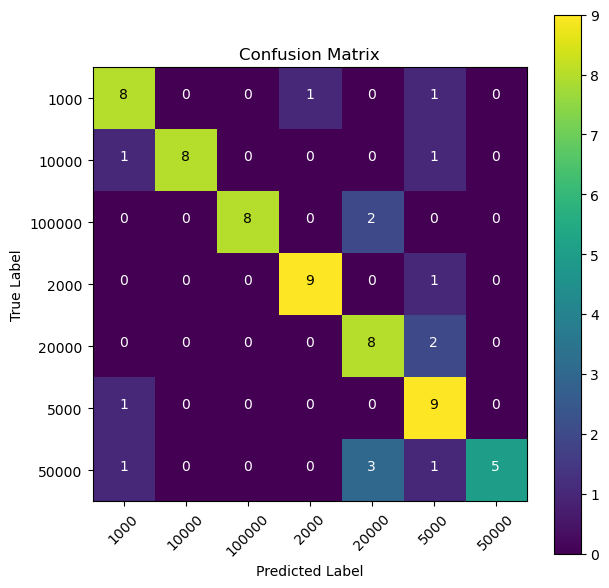

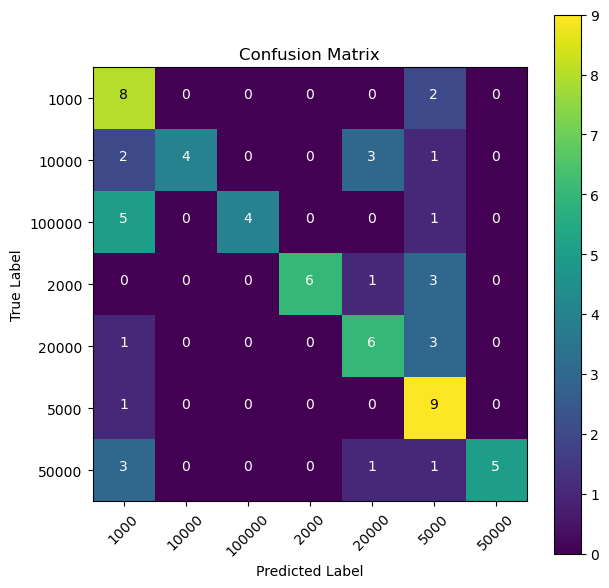

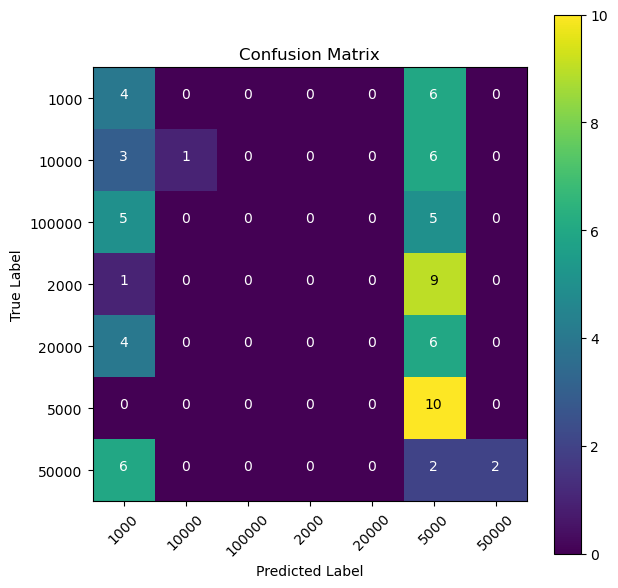

In [36]:
i = 0
#for i in len(parameter):
for i in range (15,20): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 21 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 38
learning rate: 0.047000757458819584
batch size: 128
dropout rate: 0.5367213734039654
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/38
4/4 [==============================] - ETA: 0s - loss: 2.6011 - acc: 0.2837
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan21/model\vgg_16_21-saved-model-01-acc-0.18.hdf5
4/4 [==============================] - 38s 10s/step - loss: 2.6011 - acc: 0.2837 - val_loss: 11.6759 - val_acc: 0.1786
Epoch 2/38
4/4 [==============================] - ETA: 0s - loss: 1.5454 - acc: 0.5388 
Epoch 2: val_acc improved from 0.17857 to 0.20000, saving model to percobaan21/model\vgg_16_21-saved-model-02-acc-0.20.hdf5
4/4 [==============================] - 52s 14s/step - loss: 1.5454 - acc: 0.5388 - val_loss: 8.8713 - val_acc: 0.2000
Epoch 3/38
4/4 [=======

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.67      0.20      0.31        10
        5000       0.16      1.00      0.28        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.26        70
   macro avg       0.55      0.26      0.22        70
weighted avg       0.55      0.26      0.22        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 23 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.025715214542872556
batch size: 128
dropout rate: 0.6766958028183262
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 25 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 37
learning rate: 0.06899656123551498
batch size: 32
dropout rate: 0.5087418074404569
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/37
16/16 [==============================] - ETA: 0s - loss: 3.0665 - acc: 0.2898
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan25/model\vgg_16_25-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 40s 2s/step - loss: 3.0665 - acc: 0.2898 - val_loss: 12.6185 - val_acc: 0.1429
Epoch 2/37
16/16 [==============================] - ETA: 0s - loss: 2.0144 - acc: 0.4286
Epoch 2: val_acc improved from 0.14286 to 0.20714, saving model to percobaan25/model\vgg_16_25-saved-model-02-acc-0.21.hdf5
16/16 [==============================]

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.50      0.40      0.44        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.10      0.18        10
        2000       0.28      1.00      0.43        10
       20000       0.50      0.30      0.37        10
        5000       0.35      0.60      0.44        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.37        70
   macro avg       0.52      0.37      0.32        70
weighted avg       0.52      0.37      0.32        70

────────────────────────────────────────────────────────────────────────────────────────────────────


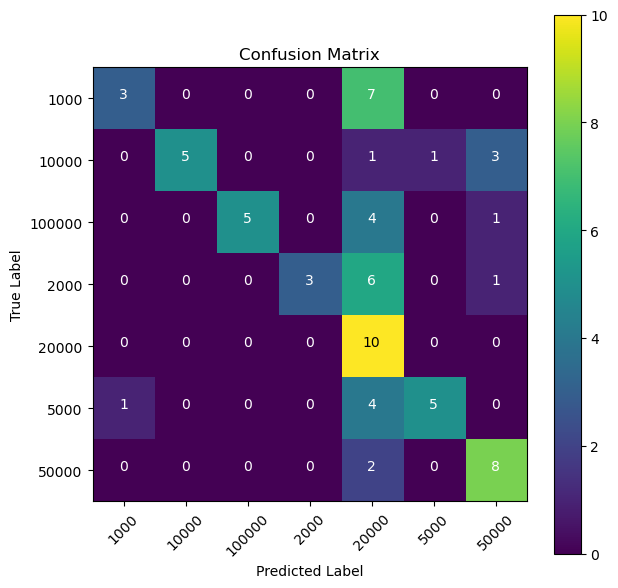

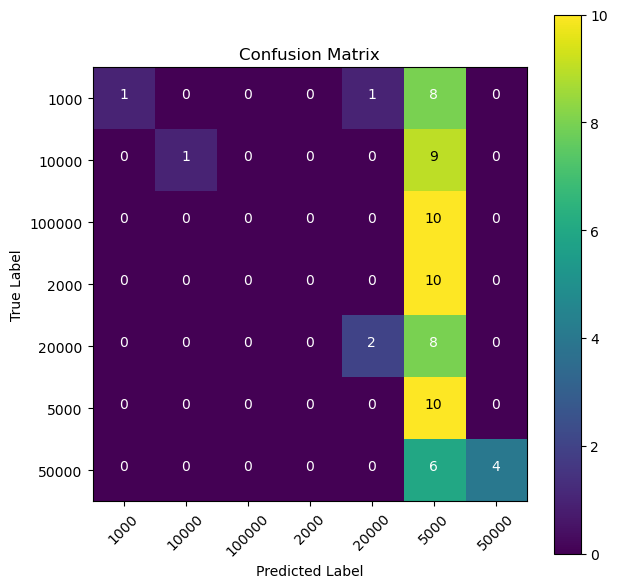

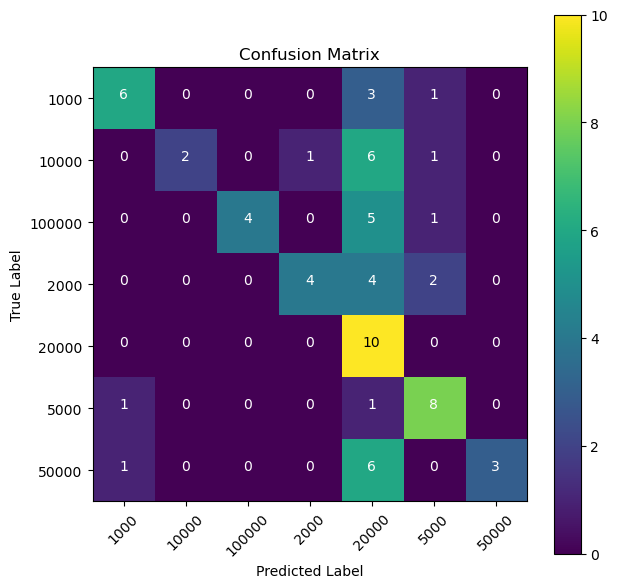

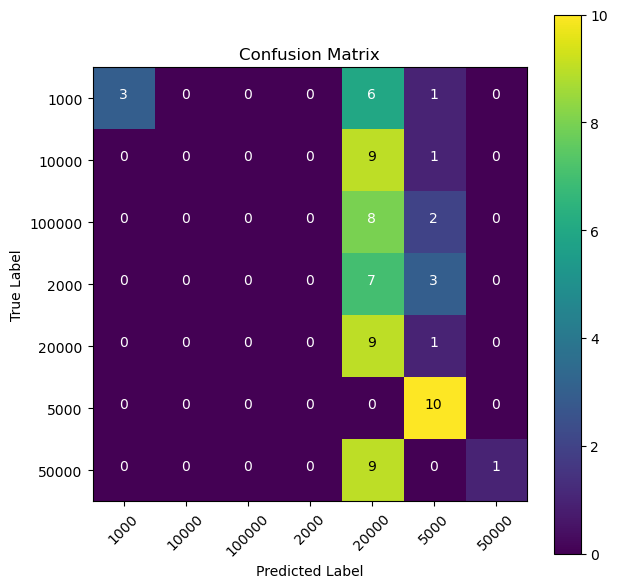

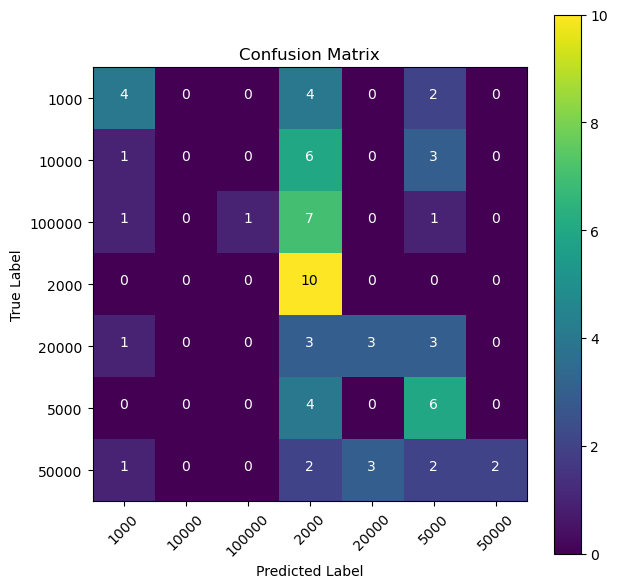

In [51]:
i = 0
#for i in len(parameter):
for i in range (20,25): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 26 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.05389869567677854
batch size: 32
dropout rate: 0.6218490173196274
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.9763 - acc: 0.2776
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan26/model\vgg_16_26-saved-model-01-acc-0.17.hdf5
16/16 [==============================] - 34s 2s/step - loss: 2.9763 - acc: 0.2776 - val_loss: 7.3862 - val_acc: 0.1714
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 2.2460 - acc: 0.3714
Epoch 2: val_acc improved from 0.17143 to 0.22143, saving model to percobaan26/model\vgg_16_26-saved-model-02-acc-0.22.hdf5
16/16 [==============================] - 39s 2s/step - loss: 2.2460 - acc: 0.3714 - val_loss: 4.9820 - val_acc: 0.2214
Epoch 3/30
16/16 [===

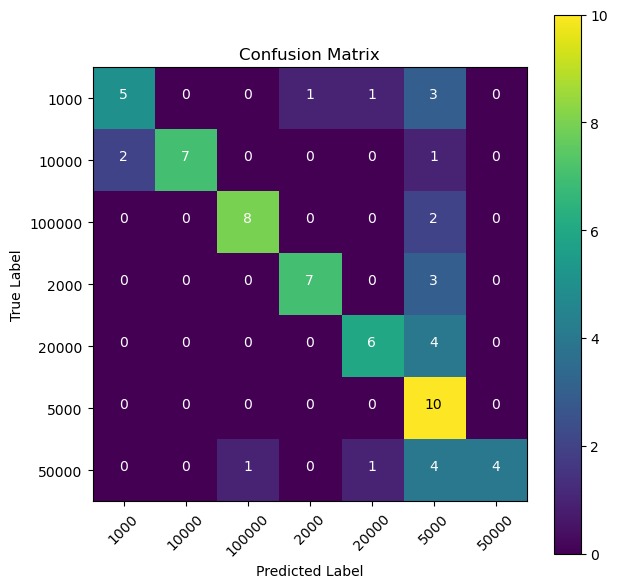

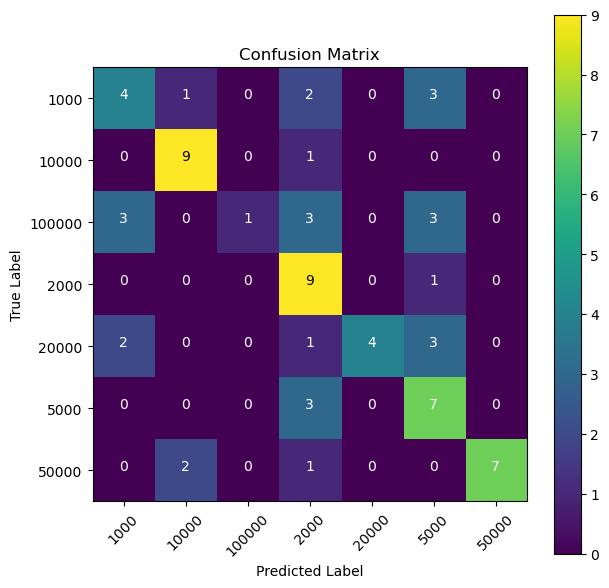

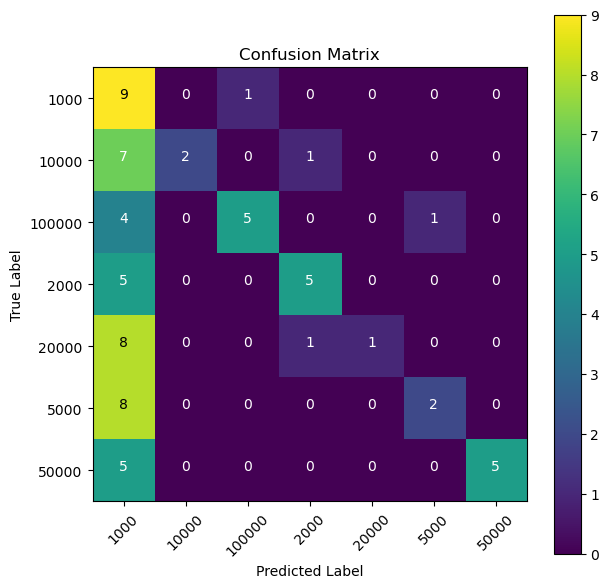

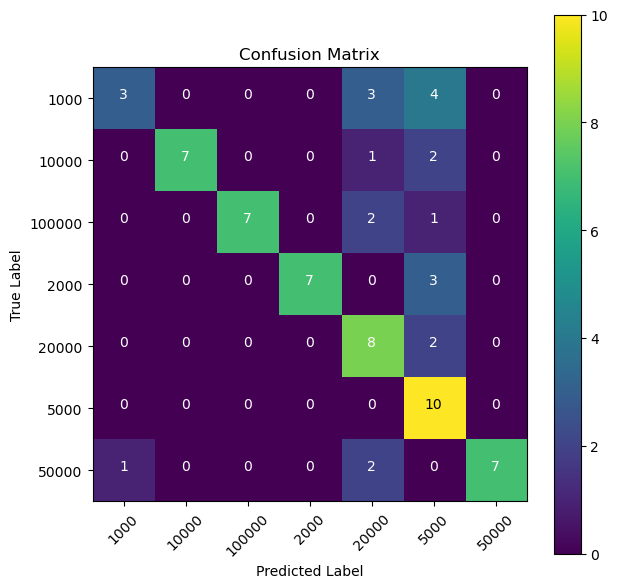

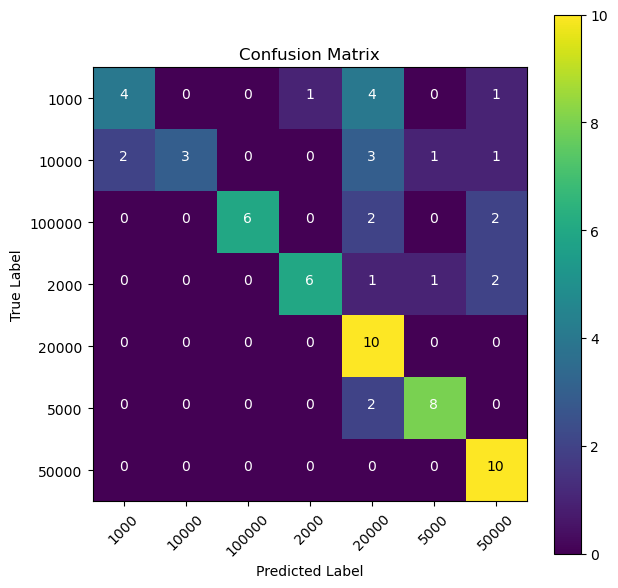

In [52]:
i = 0
#for i in len(parameter):
for i in range (25,30): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

In [54]:
i = 0
#for i in len(parameter):
for i in range (30,35): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 31 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.059123645323997706
batch size: 64
dropout rate: 0.7135016933867188
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/32
8/8 [==============================] - ETA: 0s - loss: 3.3840 - acc: 0.2469
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan31/model\vgg_16_31-saved-model-01-acc-0.28.hdf5
8/8 [==============================] - 34s 4s/step - loss: 3.3840 - acc: 0.2469 - val_loss: 2.9669 - val_acc: 0.2786
Epoch 2/32
8/8 [==============================] - ETA: 0s - loss: 2.6165 - acc: 0.3163
Epoch 2: val_acc did not improve from 0.27857
8/8 [==============================] - 32s 4s/step - loss: 2.6165 - acc: 0.3163 - val_loss: 3.7198 - val_acc: 0.2214
Epoch 3/32
8/8 [==============================] - ETA: 0s - loss: 2.0176 - acc: 0.3816
Epoch 3: val_acc di

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.30      0.46        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.80      0.40      0.53        10
        5000       0.18      1.00      0.30        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.31        70
   macro avg       0.71      0.31      0.31        70
weighted avg       0.71      0.31      0.31        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 34 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 30
learning rate: 0.05734476824730432
batch size: 128
dropout rate: 0.6062114971154174
────────────────────────────────────────────────────────────────────────────────────

: 

: 

[WinError 183] Cannot create a file when that file already exists: 'percobaan34'
[WinError 183] Cannot create a file when that file already exists: 'percobaan34/model'
Percobaan ke- 34 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 37
learning rate: 0.05070671130268802
batch size: 128
dropout rate: 0.5753175822202801
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/37
4/4 [==============================] - ETA: 0s - loss: 2.4825 - acc: 0.3286
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan34/model\vgg_16_34-saved-model-01-acc-0.28.hdf5
4/4 [==============================] - 37s 9s/step - loss: 2.4825 - acc: 0.3286 - val_loss: 6.4572 - val_acc: 0.2786
Epoch 2/37
4/4 [==============================] - ETA: 0s - loss: 1.6080 - acc: 0.4816
Epoch 2: val_acc did not improve from 0.27857
4/4 [==============================] - 33s 9s/step - lo

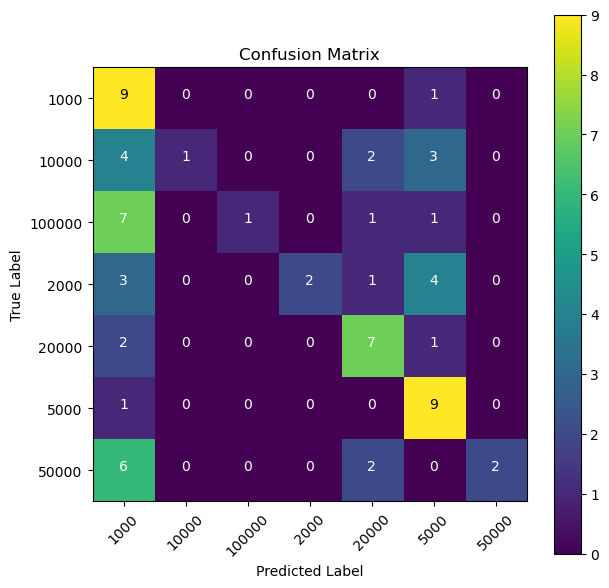

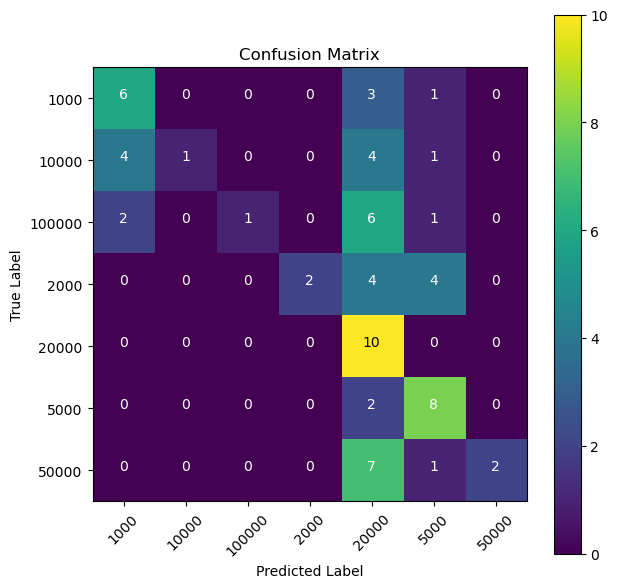

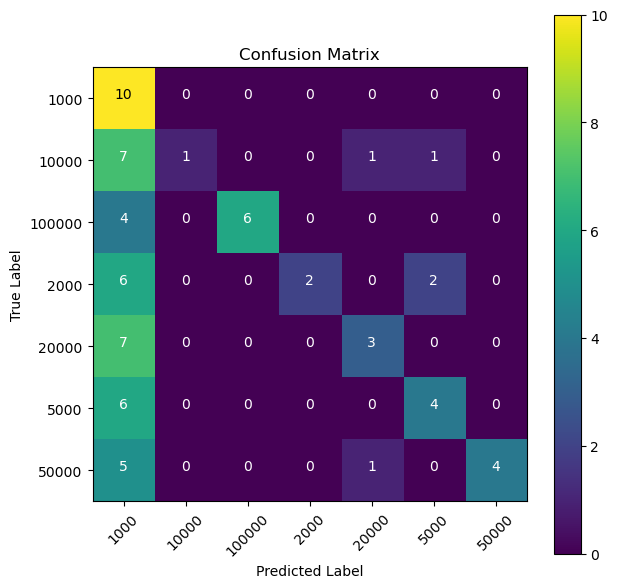

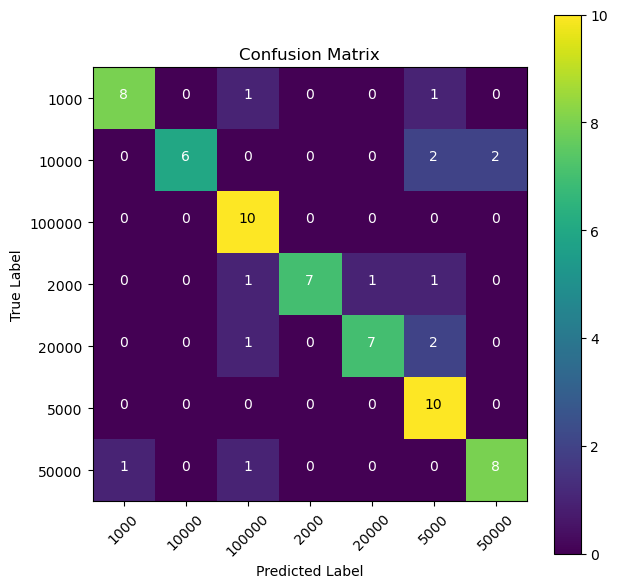

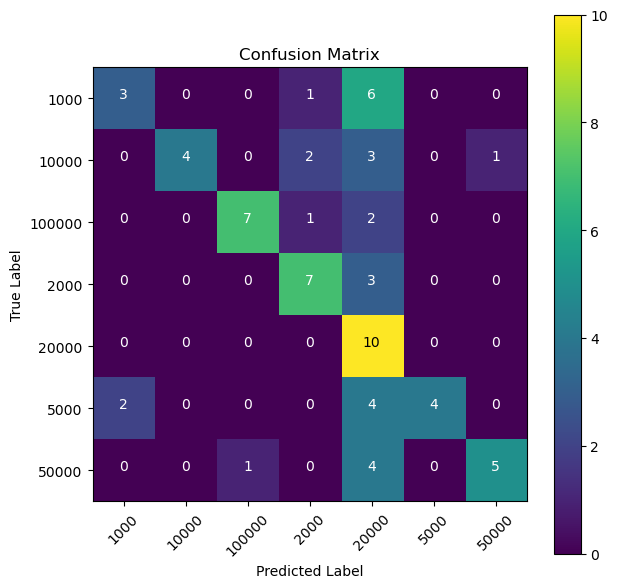

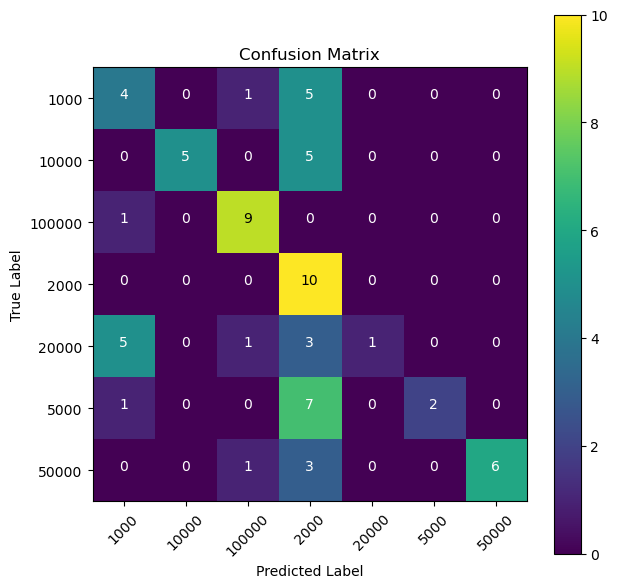

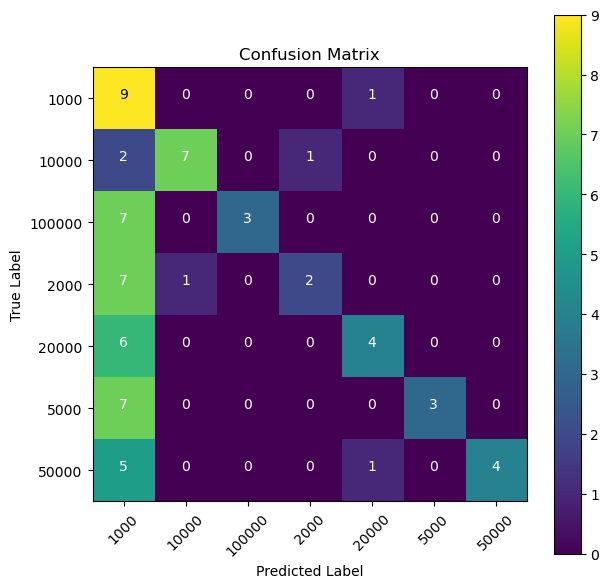

In [25]:
i = 0
#for i in len(parameter):
for i in range (33,40): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 41 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.08600266684298738
batch size: 64
dropout rate: 0.5651788770766103
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/34
8/8 [==============================] - ETA: 0s - loss: 3.1181 - acc: 0.2673
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan41/model\vgg_16_41-saved-model-01-acc-0.15.hdf5
8/8 [==============================] - 36s 4s/step - loss: 3.1181 - acc: 0.2673 - val_loss: 16.3470 - val_acc: 0.1500
Epoch 2/34
8/8 [==============================] - ETA: 0s - loss: 2.0917 - acc: 0.4408
Epoch 2: val_acc improved from 0.15000 to 0.24286, saving model to percobaan41/model\vgg_16_41-saved-model-02-acc-0.24.hdf5
8/8 [==============================] - 39s 5s/step - loss: 2.0917 - acc: 0.4408 - val_loss: 6.5158 - val_acc: 0.2429
Epoch 3/34
8/8 [============

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.38      0.60      0.46        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.22      1.00      0.36        10
        5000       0.67      0.40      0.50        10
       50000       0.50      0.10      0.17        10

    accuracy                           0.30        70
   macro avg       0.25      0.30      0.21        70
weighted avg       0.25      0.30      0.21        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 43 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.09621925683378733
batch size: 64
dropout rate: 0.7061957688195187
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.40      0.20      0.27        10
       10000       1.00      0.10      0.18        10
      100000       0.43      1.00      0.61        10
        2000       0.00      0.00      0.00        10
       20000       0.38      0.30      0.33        10
        5000       0.27      0.90      0.42        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.36        70
   macro avg       0.35      0.36      0.26        70
weighted avg       0.35      0.36      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 44 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 33
learning rate: 0.09024808256745456
batch size: 64
dropout rate: 0.7734958783119755
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.53      0.80      0.64        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.60      0.75        10
        5000       0.25      1.00      0.40        10
       50000       1.00      0.60      0.75        10

    accuracy                           0.46        70
   macro avg       0.54      0.46      0.41        70
weighted avg       0.54      0.46      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 45 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 36
learning rate: 0.08454996599135427
batch size: 128
dropout rate: 0.5467874936051952
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.38      0.60      0.46        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.10      0.18        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.20      0.33        10
        5000       0.21      1.00      0.34        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.31        70
   macro avg       0.65      0.31      0.26        70
weighted avg       0.65      0.31      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────


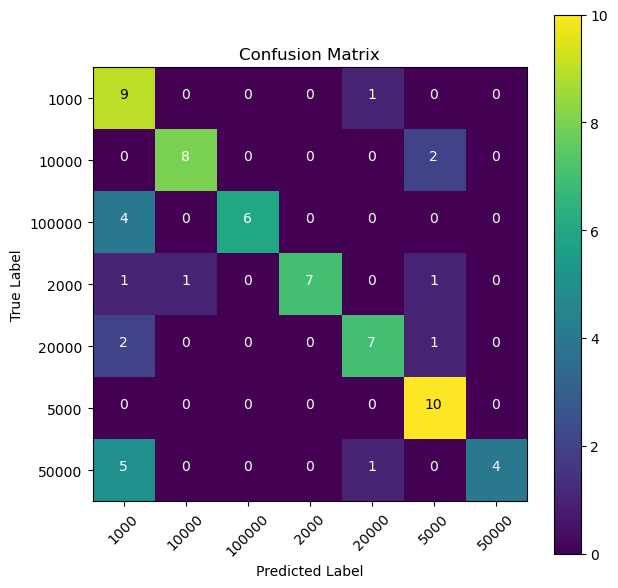

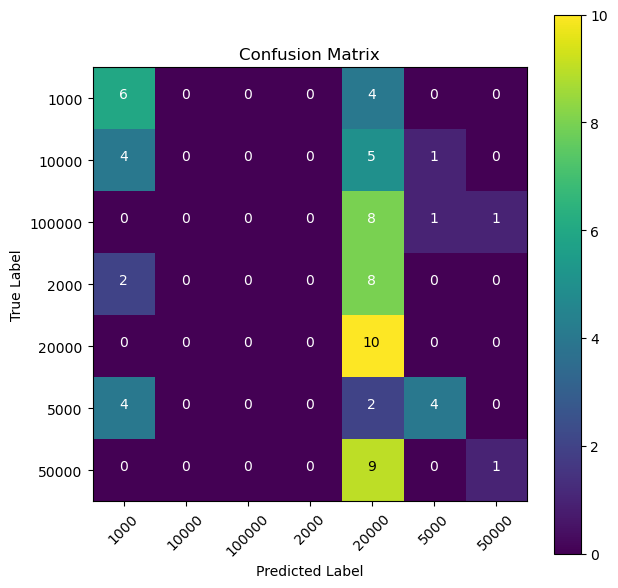

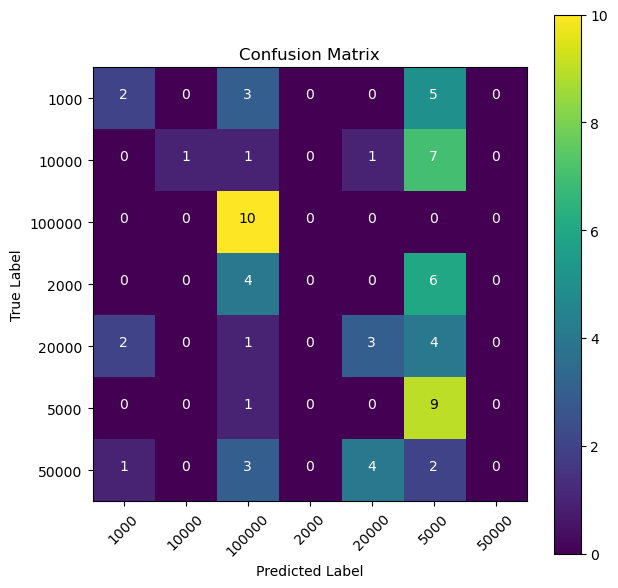

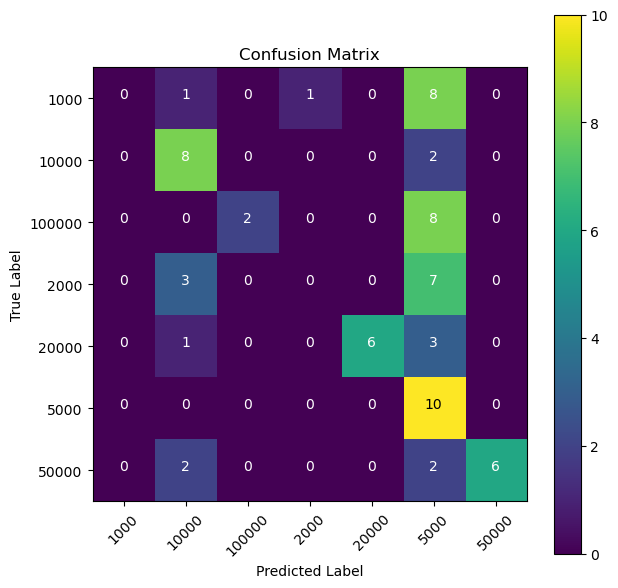

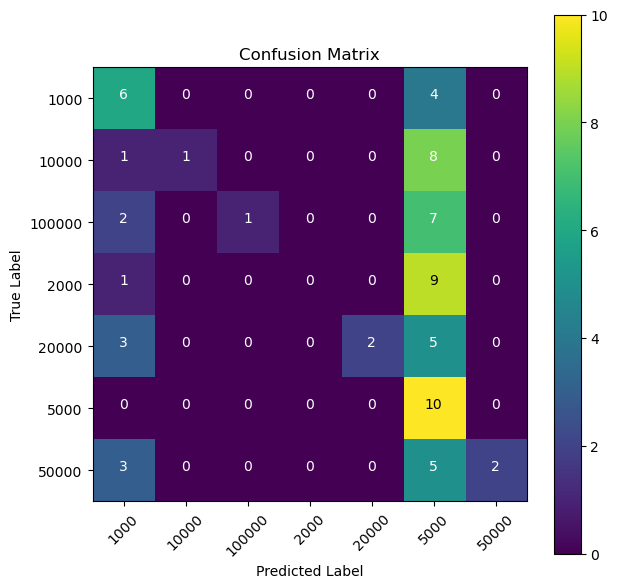

In [26]:
i = 0
arr_accuracy16 = []
#for i in len(parameter):
for i in range (40,45): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 46 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 34
learning rate: 0.07774214405111869
batch size: 128
dropout rate: 0.6015475279047259
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/34
4/4 [==============================] - ETA: 0s - loss: 3.2017 - acc: 0.2143
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan46/model\vgg_16_46-saved-model-01-acc-0.19.hdf5
4/4 [==============================] - 33s 9s/step - loss: 3.2017 - acc: 0.2143 - val_loss: 9.1759 - val_acc: 0.1857
Epoch 2/34
4/4 [==============================] - ETA: 0s - loss: 2.1056 - acc: 0.4184
Epoch 2: val_acc improved from 0.18571 to 0.20714, saving model to percobaan46/model\vgg_16_46-saved-model-02-acc-0.21.hdf5
4/4 [==============================] - 38s 10s/step - loss: 2.1056 - acc: 0.4184 - val_loss: 16.0794 - val_acc: 0.2071
Epoch 3/34
4/4 [==========

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.28      0.80      0.41        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.70      0.82        10
        2000       1.00      0.10      0.18        10
       20000       0.33      0.20      0.25        10
        5000       0.37      1.00      0.54        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.40        70
   macro avg       0.43      0.40      0.32        70
weighted avg       0.43      0.40      0.32        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 47 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 32
learning rate: 0.0988471080336342
batch size: 128
dropout rate: 0.6951836132570316
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.47      0.70      0.56        10
      100000       0.00      0.00      0.00        10
        2000       0.20      0.90      0.33        10
       20000       0.33      0.30      0.32        10
        5000       1.00      0.20      0.33        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.30        70
   macro avg       0.29      0.30      0.22        70
weighted avg       0.29      0.30      0.22        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 48 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 31
learning rate: 0.08202954161411728
batch size: 128
dropout rate: 0.7931083467085878
────────────────────────────────────────────────────────────────────────────────────

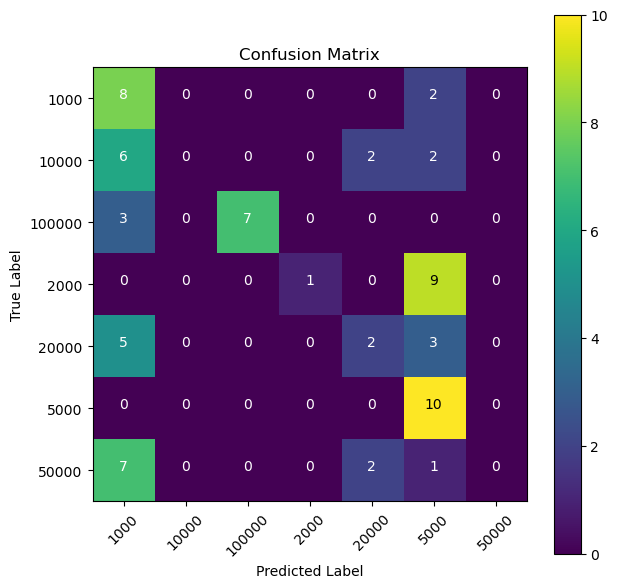

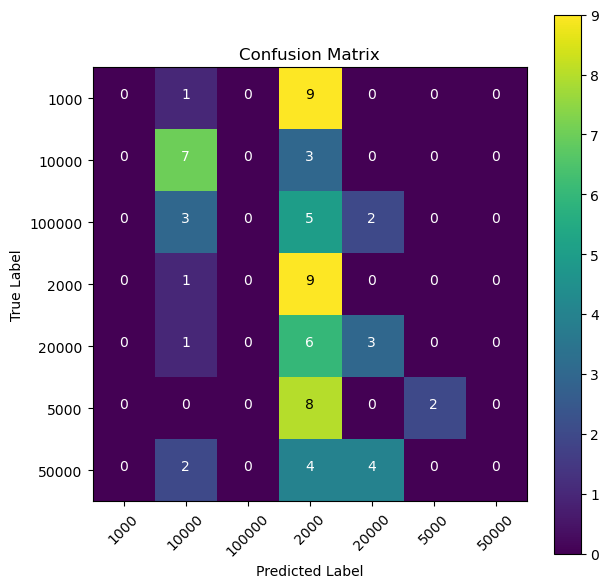

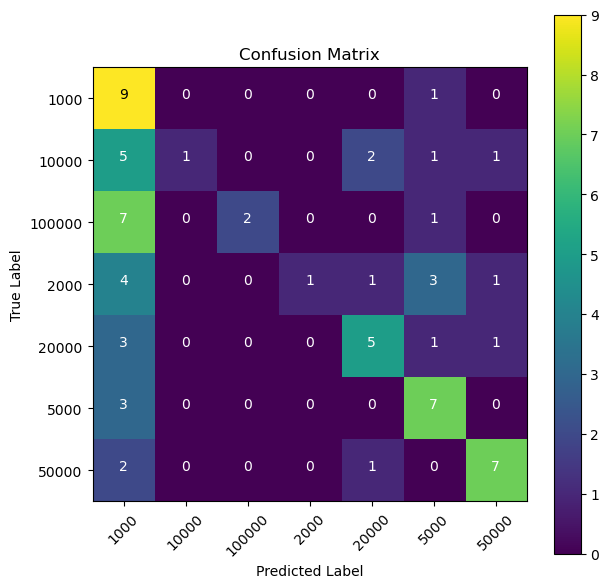

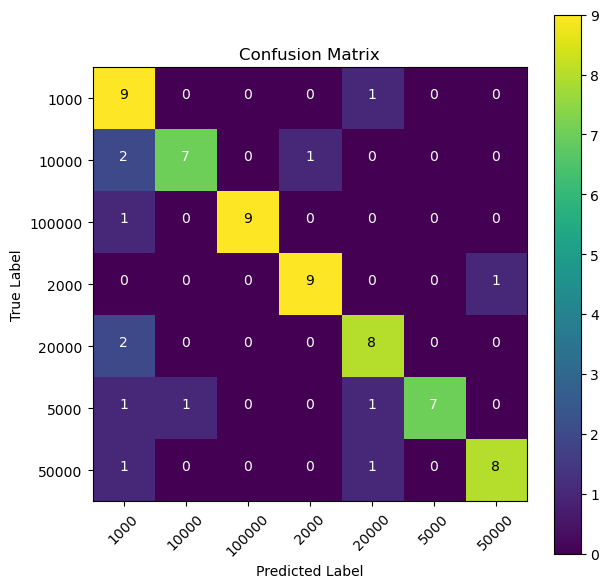

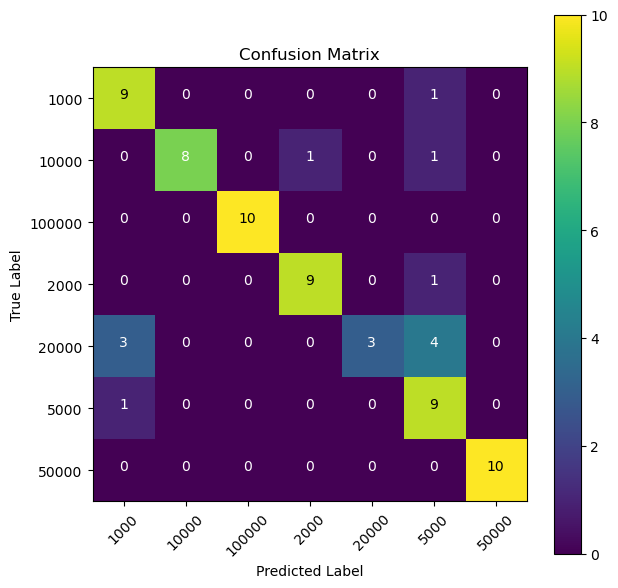

In [27]:
i = 0
#for i in len(parameter):
for i in range (45,50): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 51 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 47
learning rate: 0.024939428289457072
batch size: 32
dropout rate: 0.7034210553726414
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/47
16/16 [==============================] - ETA: 0s - loss: 3.0297 - acc: 0.2449
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan51/model\vgg_16_51-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 45s 3s/step - loss: 3.0297 - acc: 0.2449 - val_loss: 4.8445 - val_acc: 0.1929
Epoch 2/47
16/16 [==============================] - ETA: 0s - loss: 1.8937 - acc: 0.4061
Epoch 2: val_acc improved from 0.19286 to 0.45000, saving model to percobaan51/model\vgg_16_51-saved-model-02-acc-0.45.hdf5
16/16 [==============================] - 38s 2s/step - loss: 1.8937 - acc: 0.4061 - val_loss: 2.1344 - val_acc: 0.4500
Epoch 3/47
16/16 [==

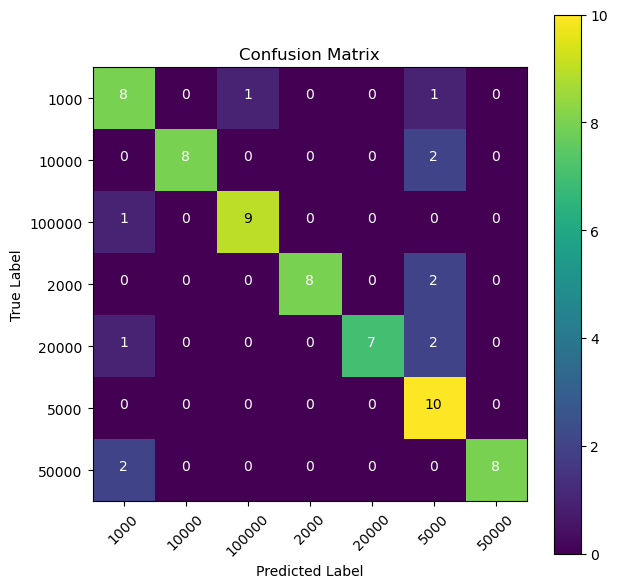

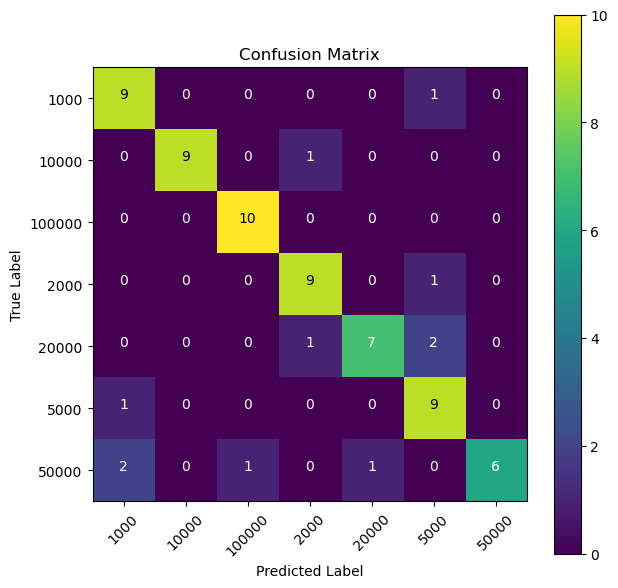

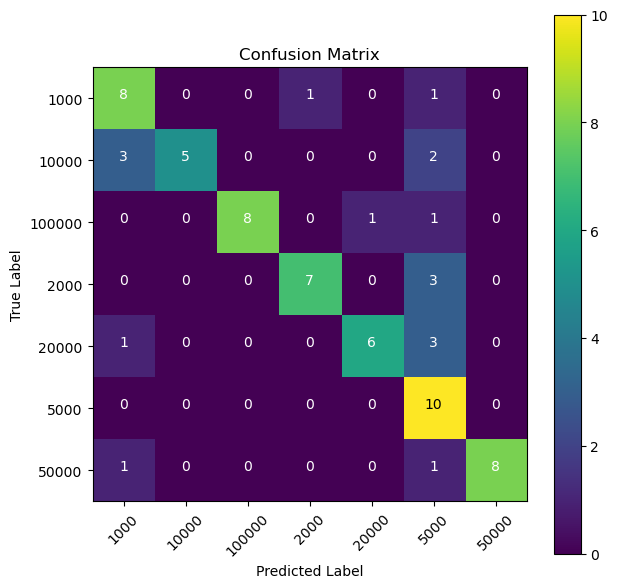

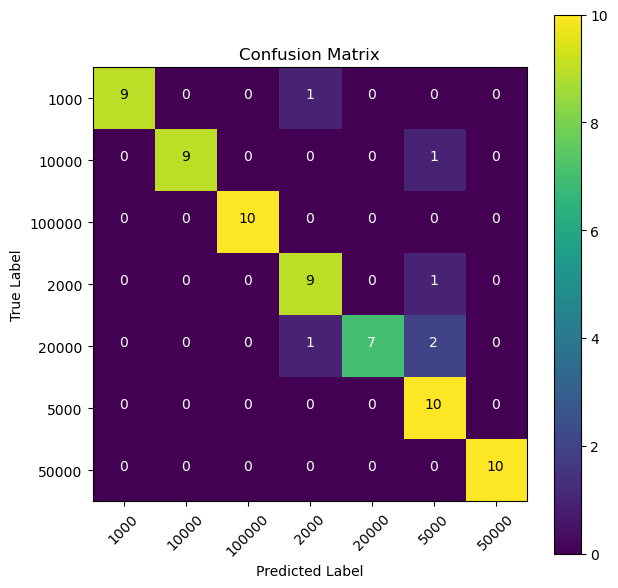

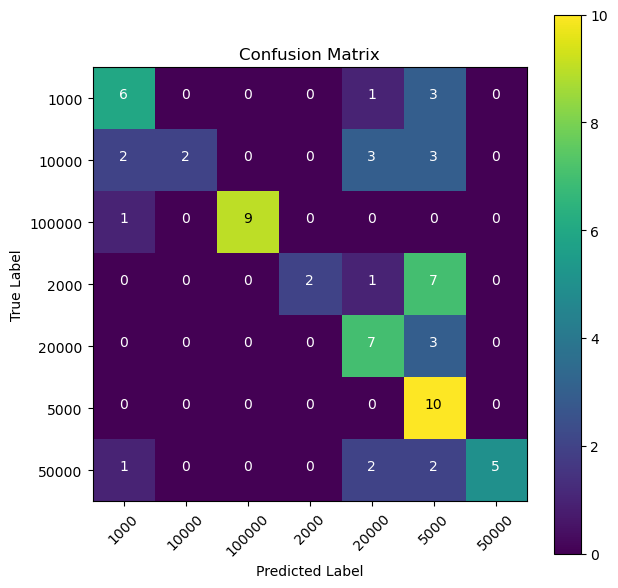

In [28]:
i = 0
#for i in len(parameter):
for i in range (50,55): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

In [28]:
i = 0
#for i in len(parameter):
for i in range (56,60): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 57 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.021525372018835236
batch size: 128
dropout rate: 0.5734156366998131
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/43
4/4 [==============================] - ETA: 0s - loss: 2.4400 - acc: 0.3000
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan57/model\vgg_16_57-saved-model-01-acc-0.16.hdf5
4/4 [==============================] - 39s 10s/step - loss: 2.4400 - acc: 0.3000 - val_loss: 5.3145 - val_acc: 0.1571
Epoch 2/43
4/4 [==============================] - ETA: 0s - loss: 1.2562 - acc: 0.5653
Epoch 2: val_acc improved from 0.15714 to 0.27857, saving model to percobaan57/model\vgg_16_57-saved-model-02-acc-0.28.hdf5
4/4 [==============================] - 34s 9s/step - loss: 1.2562 - acc: 0.5653 - val_loss: 4.9401 - val_acc: 0.2786
Epoch 3/43
4/4 [==========

: 

: 

Percobaan ke- 61 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.03935847065192845
batch size: 32
dropout rate: 0.534286212824187
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/45
16/16 [==============================] - ETA: 0s - loss: 2.5626 - acc: 0.2816
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan61/model\vgg_16_61-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 34s 2s/step - loss: 2.5626 - acc: 0.2816 - val_loss: 3.9818 - val_acc: 0.2357
Epoch 2/45
16/16 [==============================] - ETA: 0s - loss: 1.5107 - acc: 0.5245
Epoch 2: val_acc improved from 0.23571 to 0.29286, saving model to percobaan61/model\vgg_16_61-saved-model-02-acc-0.29.hdf5
16/16 [==============================] - 33s 2s/step - loss: 1.5107 - acc: 0.5245 - val_loss: 2.7654 - val_acc: 0.2929
Epoch 3/45
16/16 [====

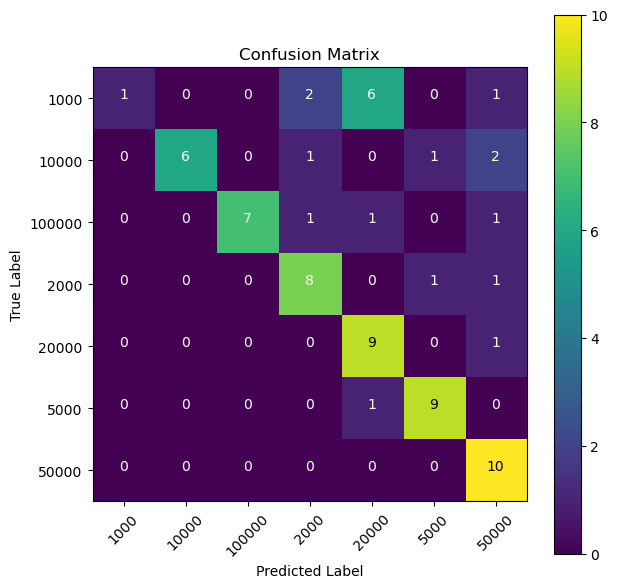

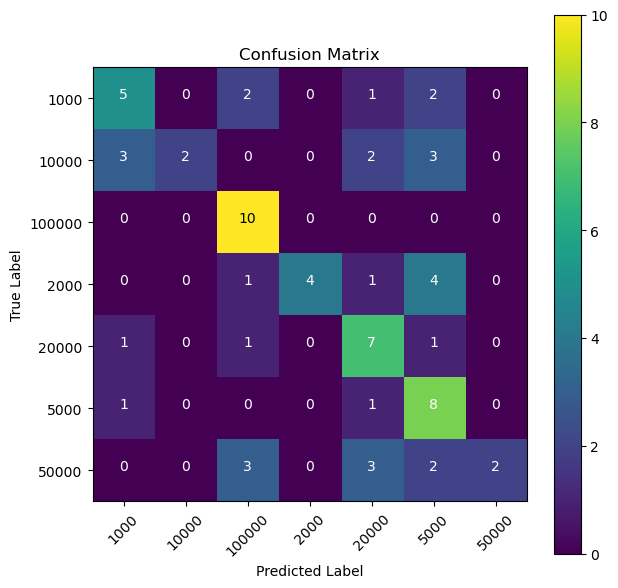

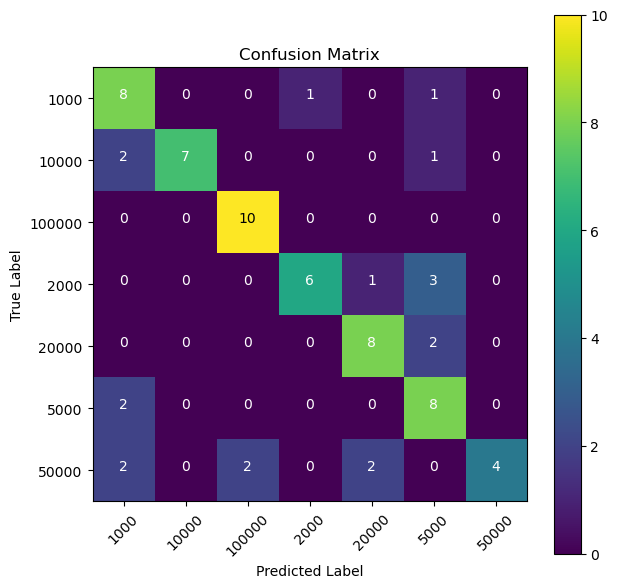

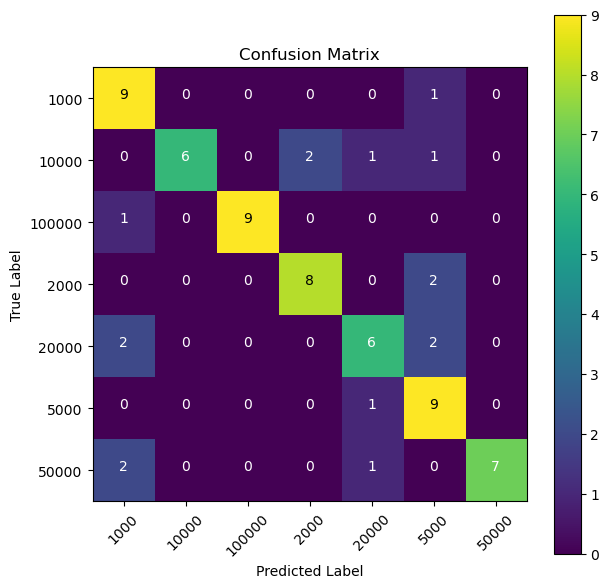

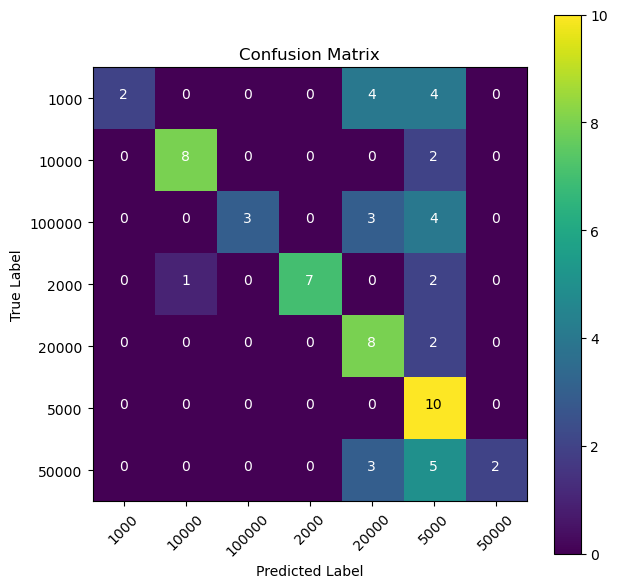

In [25]:
i = 0
#for i in len(parameter):
for i in range (60,65): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 66 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.043893361794624886
batch size: 64
dropout rate: 0.6044327391695554
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/43
8/8 [==============================] - ETA: 0s - loss: 3.0041 - acc: 0.2490
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan66/model\vgg_16_66-saved-model-01-acc-0.19.hdf5
8/8 [==============================] - 45s 5s/step - loss: 3.0041 - acc: 0.2490 - val_loss: 8.3349 - val_acc: 0.1929
Epoch 2/43
8/8 [==============================] - ETA: 0s - loss: 1.9841 - acc: 0.4306
Epoch 2: val_acc improved from 0.19286 to 0.20714, saving model to percobaan66/model\vgg_16_66-saved-model-02-acc-0.21.hdf5
8/8 [==============================] - 48s 6s/step - loss: 1.9841 - acc: 0.4306 - val_loss: 9.1741 - val_acc: 0.2071
Epoch 3/43
8/8 [============

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.38      0.50      0.43        10
        5000       0.19      1.00      0.31        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.26        70
   macro avg       0.37      0.26      0.18        70
weighted avg       0.37      0.26      0.18        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 69 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 42
learning rate: 0.03989526180357797
batch size: 128
dropout rate: 0.5520929863203753
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.21      0.90      0.34        10
        5000       0.33      0.90      0.49        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.26        70
   macro avg       0.08      0.26      0.12        70
weighted avg       0.08      0.26      0.12        70

────────────────────────────────────────────────────────────────────────────────────────────────────


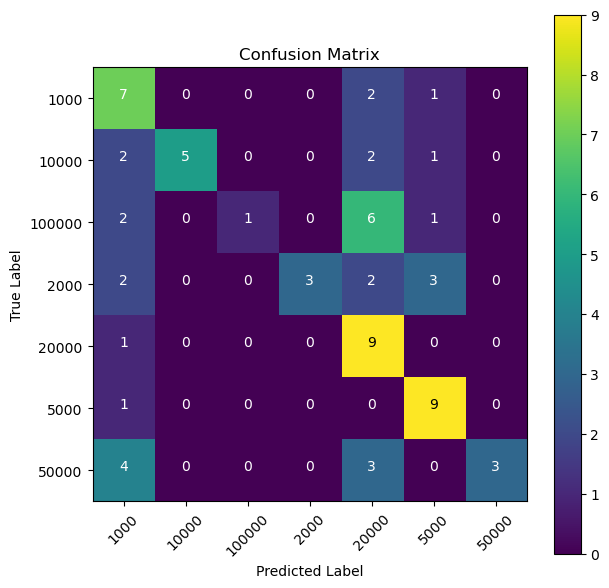

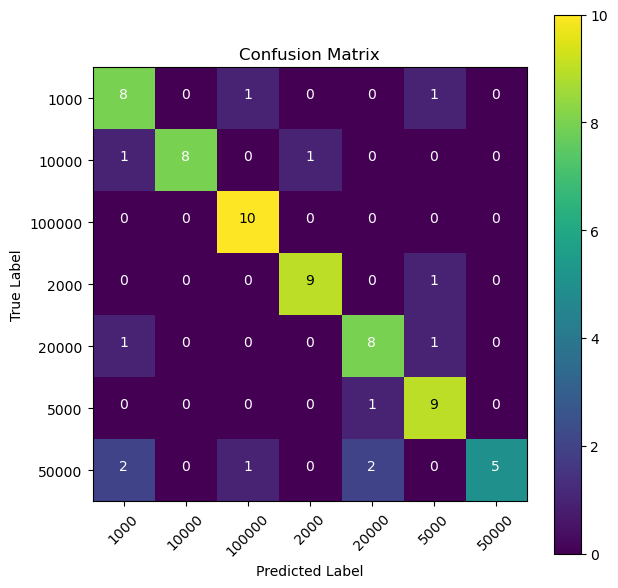

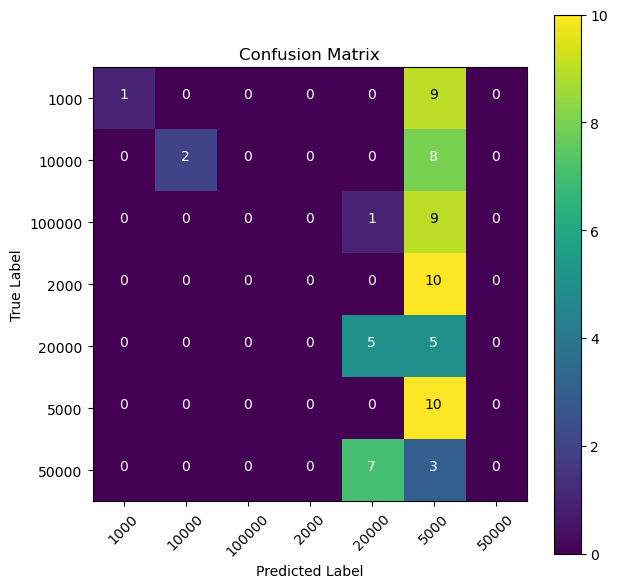

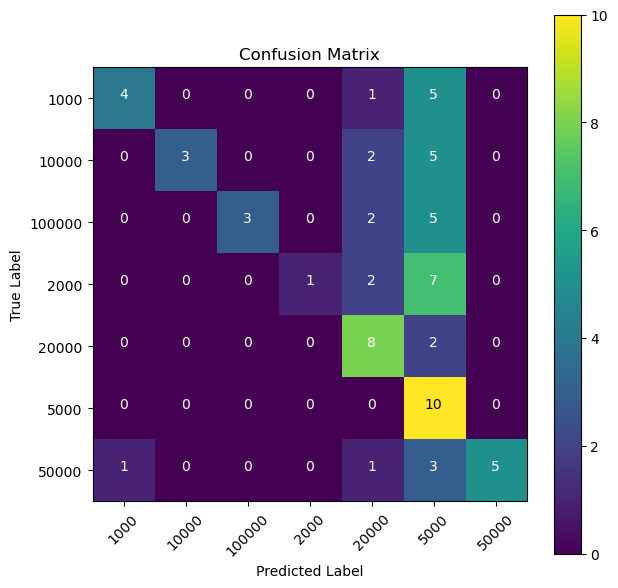

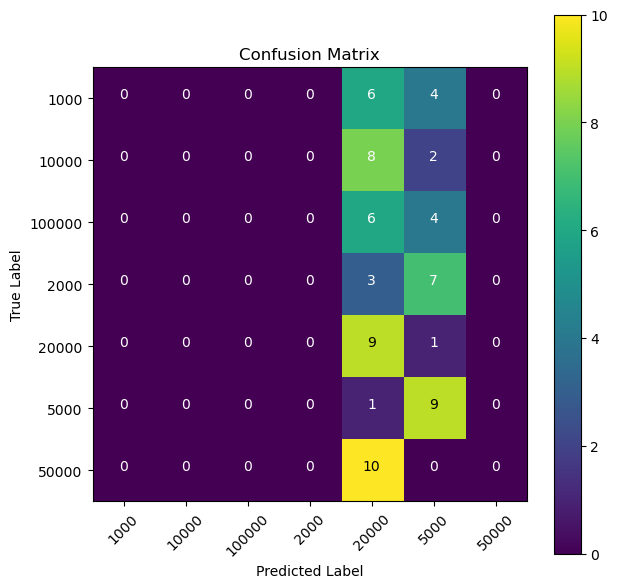

In [24]:
i = 0
#for i in len(parameter):
for i in range (65,70): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 71 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 47
learning rate: 0.02866755277136374
batch size: 128
dropout rate: 0.6617624624368162
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/47
4/4 [==============================] - ETA: 0s - loss: 2.7455 - acc: 0.2551
Epoch 1: val_acc improved from -inf to 0.32143, saving model to percobaan71/model\vgg_16_71-saved-model-01-acc-0.32.hdf5
4/4 [==============================] - 38s 9s/step - loss: 2.7455 - acc: 0.2551 - val_loss: 1.9337 - val_acc: 0.3214
Epoch 2/47
4/4 [==============================] - ETA: 0s - loss: 1.5292 - acc: 0.4694
Epoch 2: val_acc did not improve from 0.32143
4/4 [==============================] - 40s 11s/step - loss: 1.5292 - acc: 0.4694 - val_loss: 4.3368 - val_acc: 0.1857
Epoch 3/47
4/4 [==============================] - ETA: 0s - loss: 1.2725 - acc: 0.5490
Epoch 3: val_acc d

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.42      0.80      0.55        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.26      1.00      0.42        10
       20000       0.00      0.00      0.00        10
        5000       0.54      0.70      0.61        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.36        70
   macro avg       0.17      0.36      0.23        70
weighted avg       0.17      0.36      0.23        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 74 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.060845145295786905
batch size: 32
dropout rate: 0.6196970777002601
────────────────────────────────────────────────────────────────────────────────────

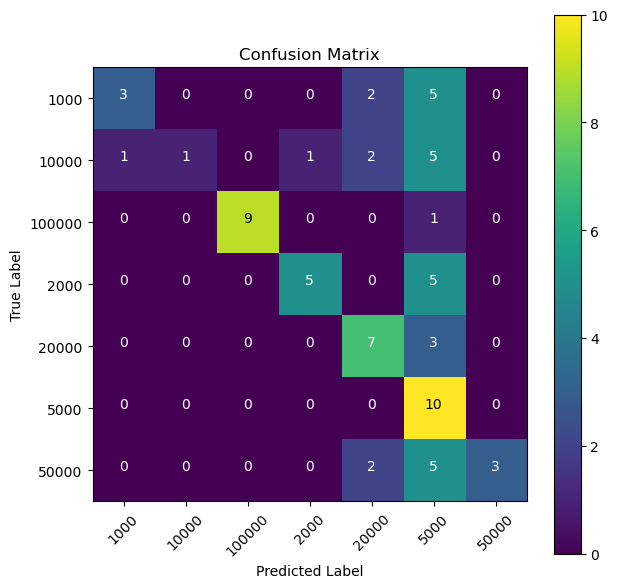

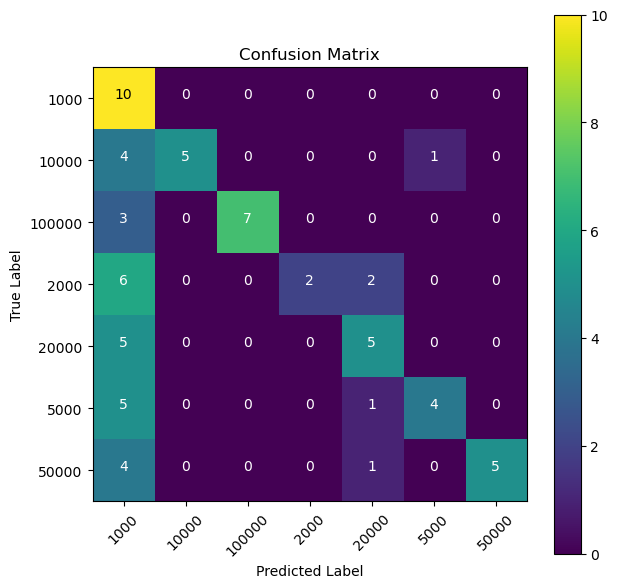

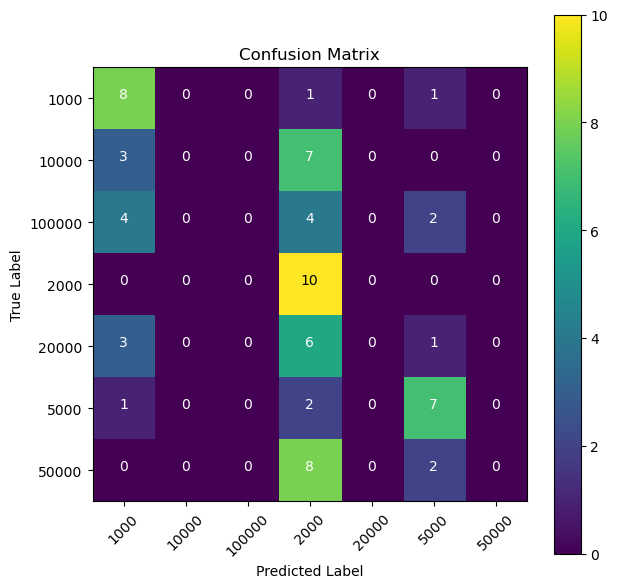

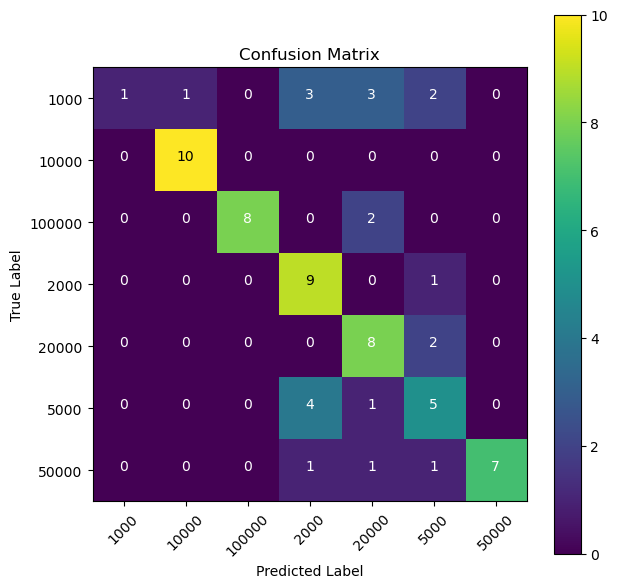

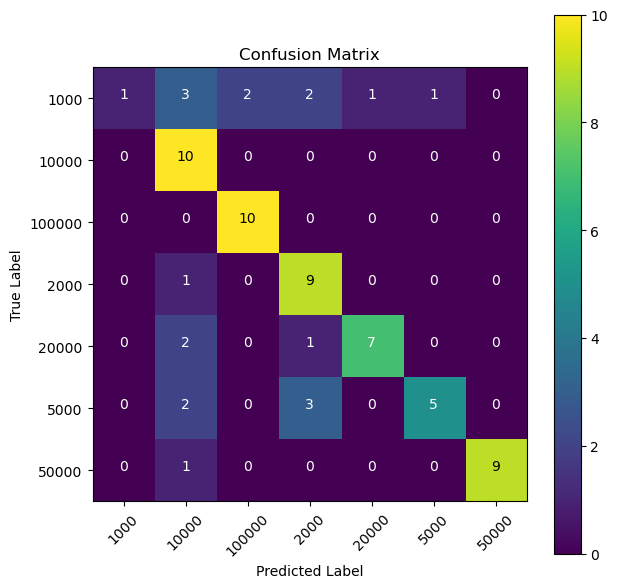

In [25]:
i = 0
#for i in len(parameter):
for i in range (70,75): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 76 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.053989116591934116
batch size: 32
dropout rate: 0.7538871180992549
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/45
16/16 [==============================] - ETA: 0s - loss: 4.1487 - acc: 0.1980
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan76/model\vgg_16_76-saved-model-01-acc-0.15.hdf5
16/16 [==============================] - 35s 2s/step - loss: 4.1487 - acc: 0.1980 - val_loss: 10.2202 - val_acc: 0.1500
Epoch 2/45
16/16 [==============================] - ETA: 0s - loss: 2.9561 - acc: 0.2776
Epoch 2: val_acc improved from 0.15000 to 0.37143, saving model to percobaan76/model\vgg_16_76-saved-model-02-acc-0.37.hdf5
16/16 [==============================] - 34s 2s/step - loss: 2.9561 - acc: 0.2776 - val_loss: 1.8752 - val_acc: 0.3714
Epoch 3/45
16/16 [=

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.41      0.90      0.56        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       0.78      0.70      0.74        10
       20000       0.35      0.60      0.44        10
        5000       0.53      1.00      0.69        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.50        70
   macro avg       0.58      0.50      0.42        70
weighted avg       0.58      0.50      0.42        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 80 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.05466014379327185
batch size: 64
dropout rate: 0.7433881524037834
─────────────────────────────────────────────────────────────────────────────────────

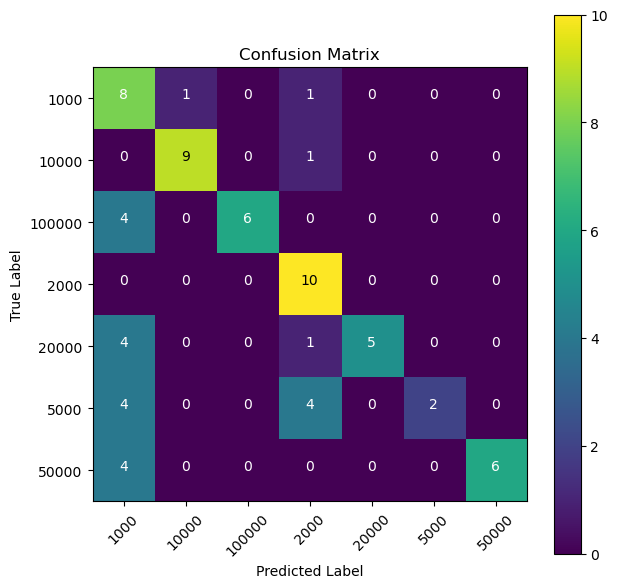

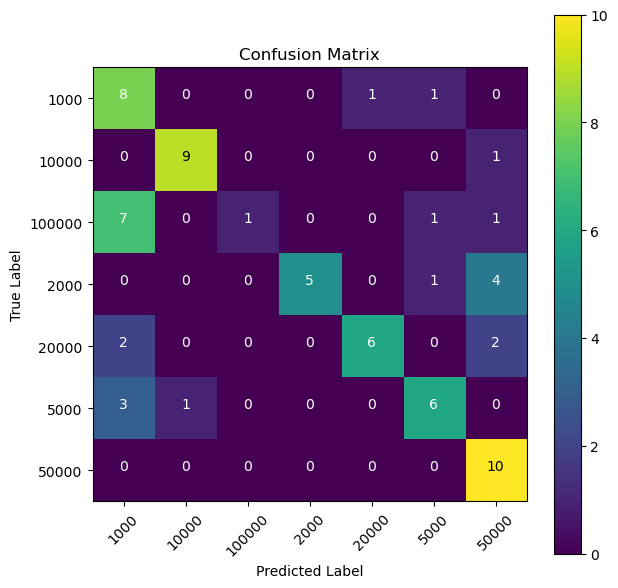

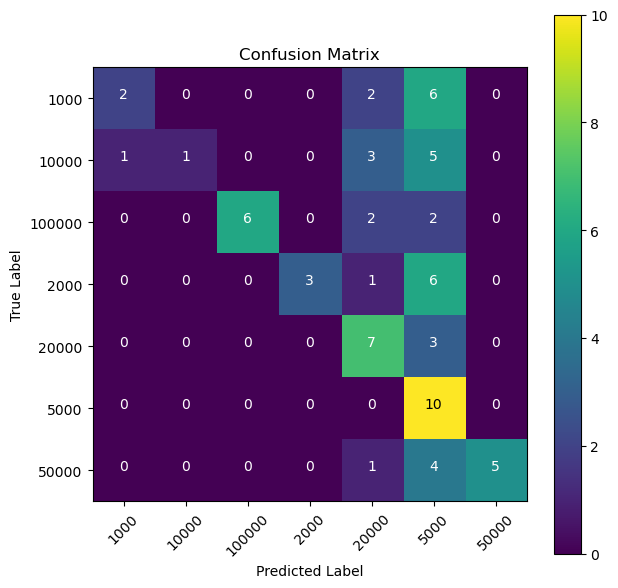

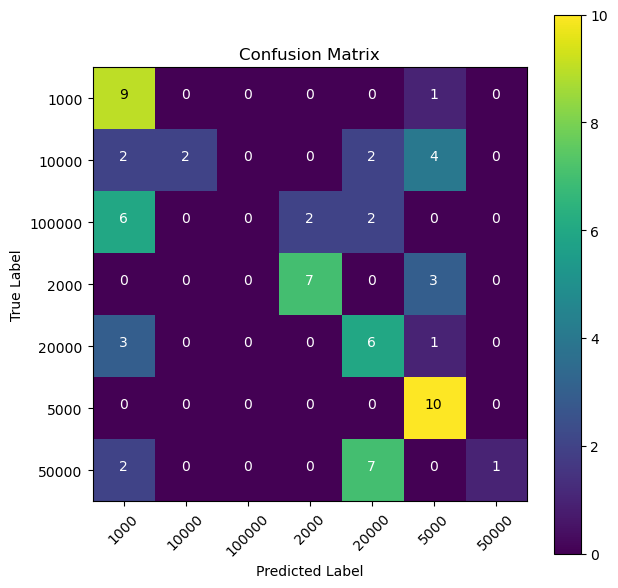

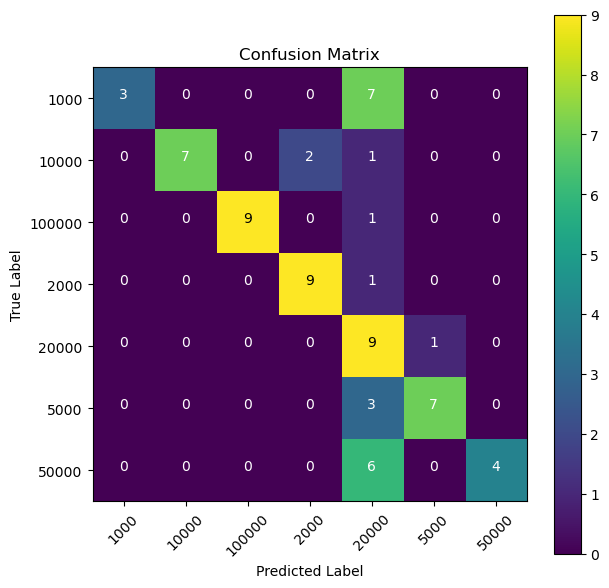

In [26]:
i = 0
#for i in len(parameter):
for i in range (75,80): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 81 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.07060922038621821
batch size: 128
dropout rate: 0.5027959718784499
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/46
4/4 [==============================] - ETA: 0s - loss: 2.6236 - acc: 0.2898
Epoch 1: val_acc improved from -inf to 0.36429, saving model to percobaan81/model\vgg_16_81-saved-model-01-acc-0.36.hdf5
4/4 [==============================] - 39s 10s/step - loss: 2.6236 - acc: 0.2898 - val_loss: 9.0843 - val_acc: 0.3643
Epoch 2/46
4/4 [==============================] - ETA: 0s - loss: 1.7967 - acc: 0.4755
Epoch 2: val_acc did not improve from 0.36429
4/4 [==============================] - 44s 12s/step - loss: 1.7967 - acc: 0.4755 - val_loss: 10.7488 - val_acc: 0.1571
Epoch 3/46
4/4 [==============================] - ETA: 0s - loss: 1.1802 - acc: 0.6184
Epoch 3: val_acc

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.23      0.70      0.34        10
        5000       0.26      1.00      0.41        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.24        70
   macro avg       0.07      0.24      0.11        70
weighted avg       0.07      0.24      0.11        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 82 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 47
learning rate: 0.053663754585999084
batch size: 128
dropout rate: 0.6349976442272193
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.67      0.60      0.63        10
       10000       0.00      0.00      0.00        10
      100000       0.75      0.90      0.82        10
        2000       0.64      0.70      0.67        10
       20000       0.38      0.90      0.53        10
        5000       0.62      0.80      0.70        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.57        70
   macro avg       0.58      0.57      0.50        70
weighted avg       0.58      0.57      0.50        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 83 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.05261083282449312
batch size: 128
dropout rate: 0.7112864228971424
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.60      0.30      0.40        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.31      0.50      0.38        10
        5000       0.21      1.00      0.34        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.27        70
   macro avg       0.30      0.27      0.19        70
weighted avg       0.30      0.27      0.19        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 84 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.07189901953478248
batch size: 128
dropout rate: 0.7807742239864077
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.25      0.70      0.37        10
        5000       0.26      1.00      0.42        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.30        70
   macro avg       0.50      0.30      0.21        70
weighted avg       0.50      0.30      0.21        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 85 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.09886379759195607
batch size: 32
dropout rate: 0.5618191852298724
─────────────────────────────────────────────────────────────────────────────────────

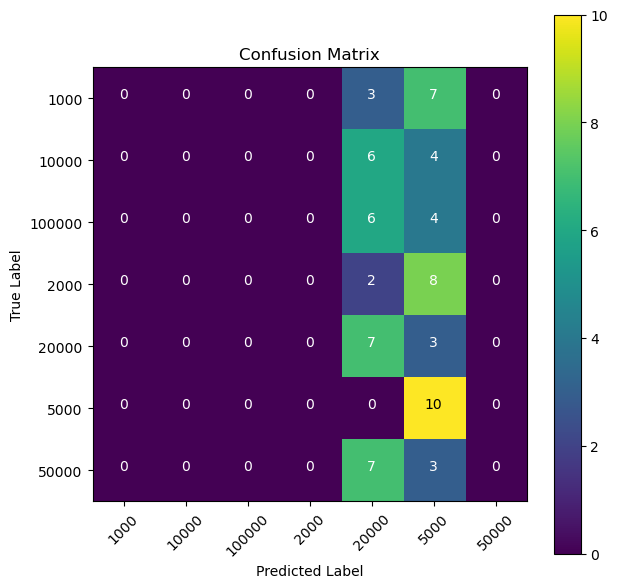

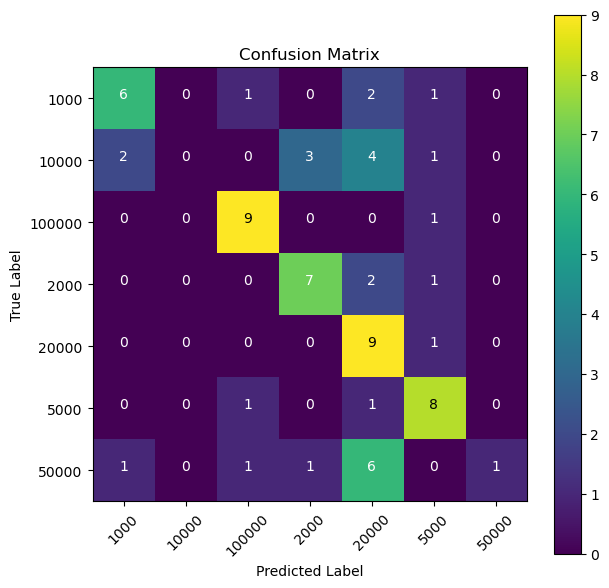

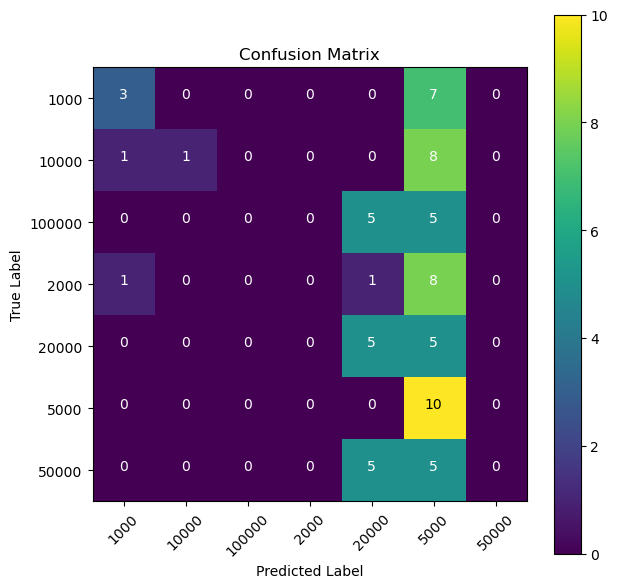

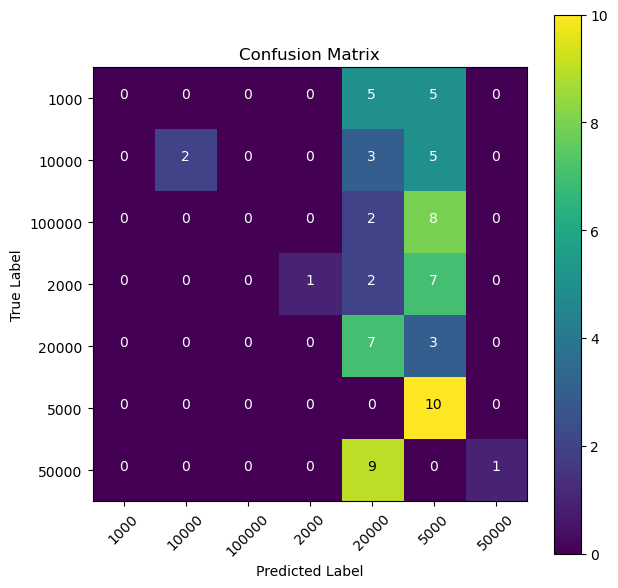

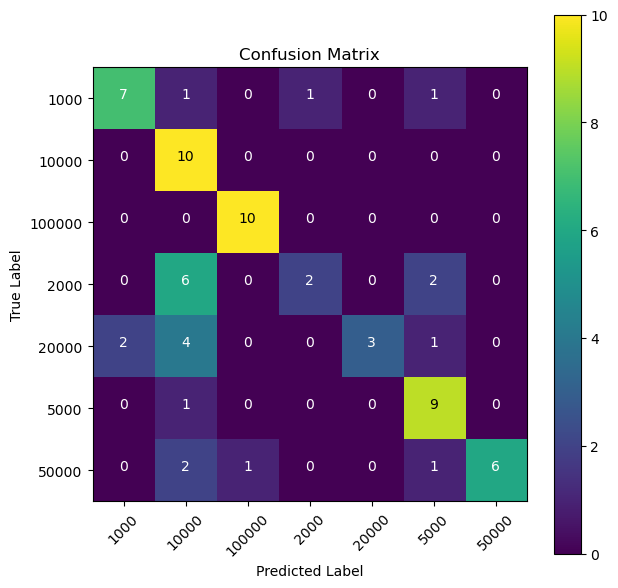

In [27]:
i = 0
#for i in len(parameter):
for i in range (80,85): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 86 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.07517415587944974
batch size: 32
dropout rate: 0.6103648008797475
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/45
16/16 [==============================] - ETA: 0s - loss: 3.5874 - acc: 0.2490
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan86/model\vgg_16_86-saved-model-01-acc-0.22.hdf5
16/16 [==============================] - 36s 2s/step - loss: 3.5874 - acc: 0.2490 - val_loss: 8.3508 - val_acc: 0.2214
Epoch 2/45
16/16 [==============================] - ETA: 0s - loss: 2.6242 - acc: 0.3408
Epoch 2: val_acc did not improve from 0.22143
16/16 [==============================] - 36s 2s/step - loss: 2.6242 - acc: 0.3408 - val_loss: 4.5404 - val_acc: 0.2143
Epoch 3/45
16/16 [==============================] - ETA: 0s - loss: 1.7856 - acc: 0.4102
Epoch 3: v

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.50      0.10      0.17        10
      100000       0.89      0.80      0.84        10
        2000       1.00      0.30      0.46        10
       20000       0.20      0.10      0.13        10
        5000       0.20      1.00      0.33        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.33        70
   macro avg       0.40      0.33      0.28        70
weighted avg       0.40      0.33      0.28        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 88 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 45
learning rate: 0.09148272151284849
batch size: 32
dropout rate: 0.7996550943380916
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.10      0.18        10
        2000       0.00      0.00      0.00        10
       20000       0.19      0.90      0.32        10
        5000       0.53      0.90      0.67        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.33        70
   macro avg       0.53      0.33      0.26        70
weighted avg       0.53      0.33      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 90 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 46
learning rate: 0.0860315836302657
batch size: 64
dropout rate: 0.6396084232392932
──────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


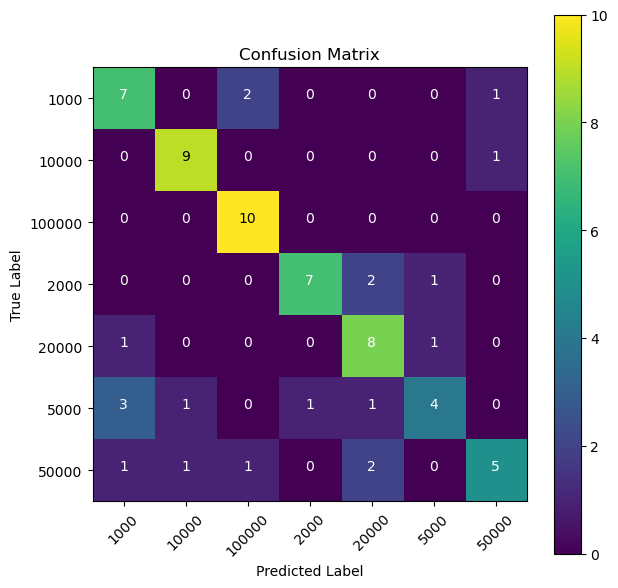

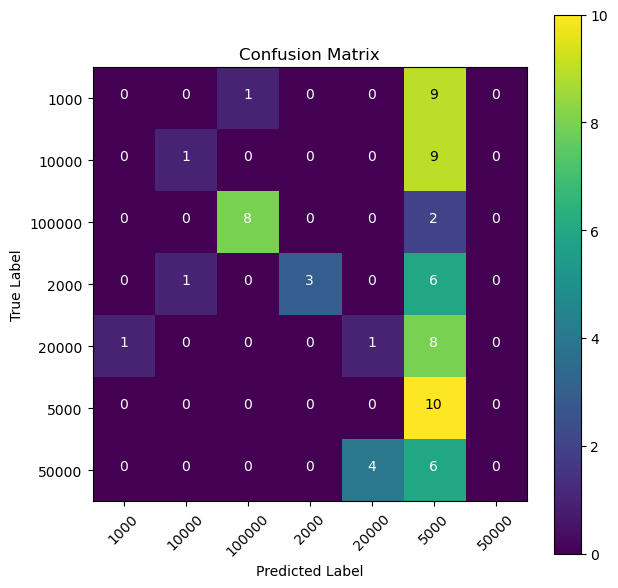

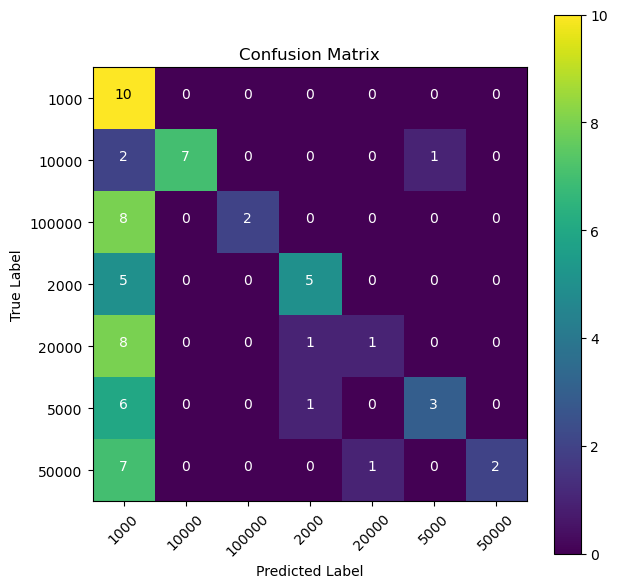

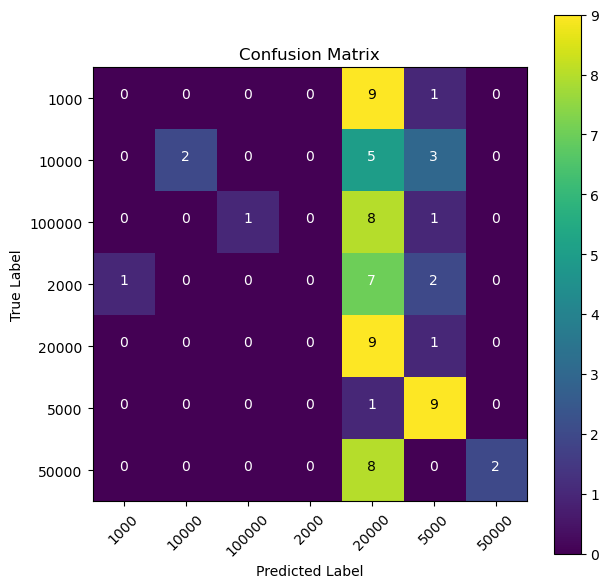

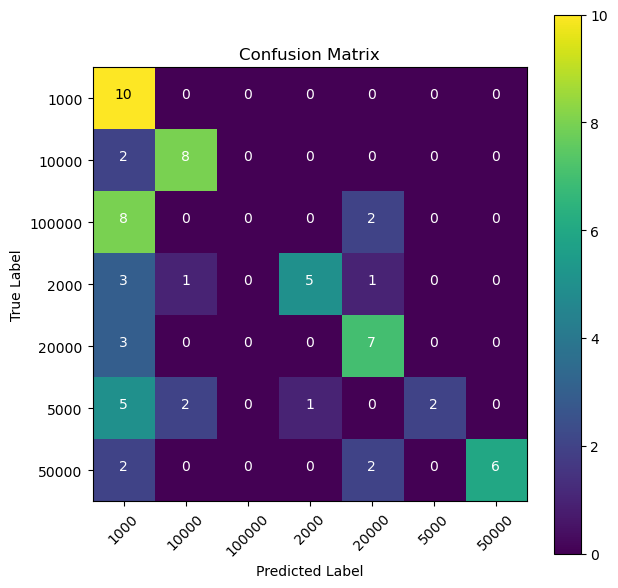

In [28]:
i = 0
#for i in len(parameter):
for i in range (85,90): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 91 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 40
learning rate: 0.07879908644550487
batch size: 64
dropout rate: 0.6501867716321621
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/40
8/8 [==============================] - ETA: 0s - loss: 3.3643 - acc: 0.2531
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan91/model\vgg_16_91-saved-model-01-acc-0.20.hdf5
8/8 [==============================] - 38s 5s/step - loss: 3.3643 - acc: 0.2531 - val_loss: 10.3016 - val_acc: 0.2000
Epoch 2/40
8/8 [==============================] - ETA: 0s - loss: 2.5593 - acc: 0.3490
Epoch 2: val_acc improved from 0.20000 to 0.35000, saving model to percobaan91/model\vgg_16_91-saved-model-02-acc-0.35.hdf5
8/8 [==============================] - 32s 4s/step - loss: 2.5593 - acc: 0.3490 - val_loss: 6.6779 - val_acc: 0.3500
Epoch 3/40
8/8 [============

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.33      0.90      0.49        10
       10000       0.89      0.80      0.84        10
      100000       1.00      0.10      0.18        10
        2000       0.78      0.70      0.74        10
       20000       0.75      0.30      0.43        10
        5000       0.45      0.90      0.60        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.53        70
   macro avg       0.60      0.53      0.47        70
weighted avg       0.60      0.53      0.47        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 92 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 43
learning rate: 0.08192253259374697
batch size: 64
dropout rate: 0.7549332900263103
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 93 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.09343160593601746
batch size: 128
dropout rate: 0.5303005110542868
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/39
4/4 [==============================] - ETA: 0s - loss: 3.1693 - acc: 0.2592
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan93/model\vgg_16_93-saved-model-01-acc-0.16.hdf5
4/4 [==============================] - 45s 12s/step - loss: 3.1693 - acc: 0.2592 - val_loss: 18.5623 - val_acc: 0.1571
Epoch 2/39
4/4 [==============================] - ETA: 0s - loss: 1.9663 - acc: 0.4449
Epoch 2: val_acc improved from 0.15714 to 0.32143, saving model to percobaan93/model\vgg_16_93-saved-model-02-acc-0.32.hdf5
4/4 [==============================] - 44s

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.55      0.60      0.57        10
       10000       1.00      0.30      0.46        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.60      0.55        10
        5000       0.34      1.00      0.51        10
       50000       0.69      0.90      0.78        10

    accuracy                           0.51        70
   macro avg       0.58      0.51      0.46        70
weighted avg       0.58      0.51      0.46        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 94 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.07687165757760248
batch size: 128
dropout rate: 0.5883641024664974
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.30      0.70      0.42        10
        5000       0.22      1.00      0.36        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.27        70
   macro avg       0.22      0.27      0.16        70
weighted avg       0.22      0.27      0.16        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 95 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 41
learning rate: 0.08665090826060982
batch size: 128
dropout rate: 0.6739663487591017
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.00      0.00      0.00        10
        5000       0.16      1.00      0.27        10
       50000       1.00      0.30      0.46        10

    accuracy                           0.20        70
   macro avg       0.31      0.20      0.13        70
weighted avg       0.31      0.20      0.13        70

────────────────────────────────────────────────────────────────────────────────────────────────────


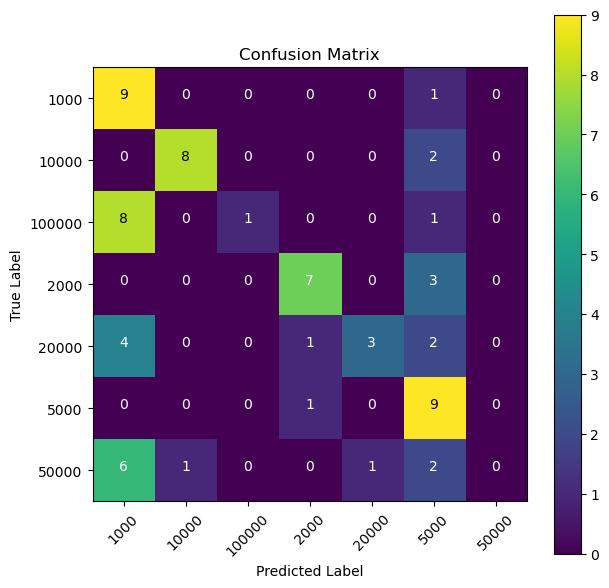

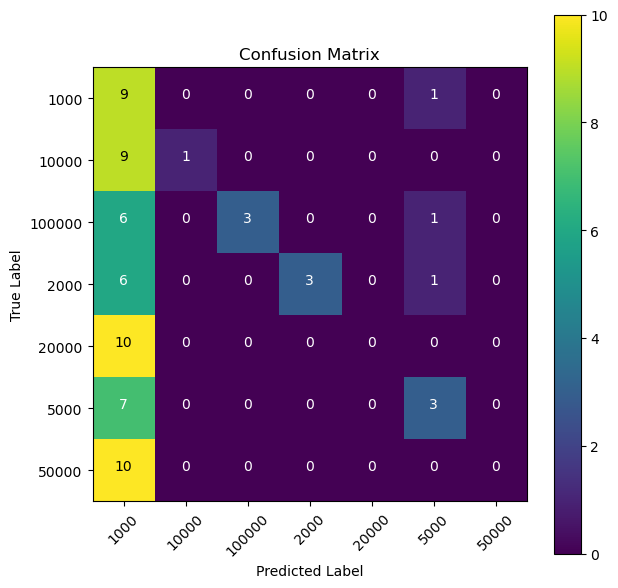

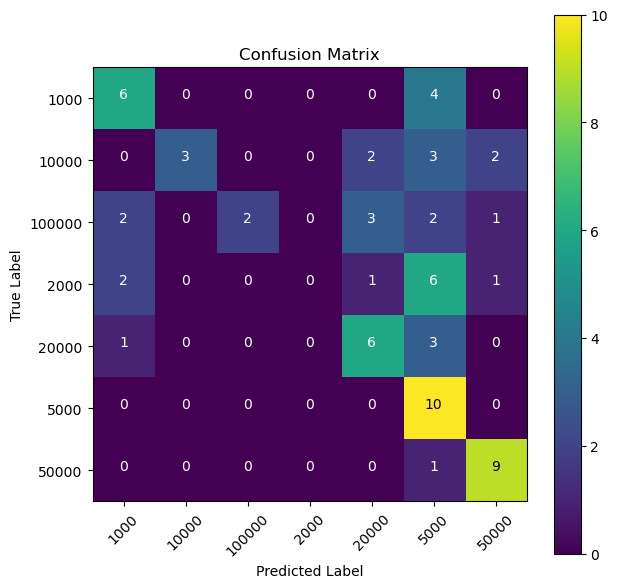

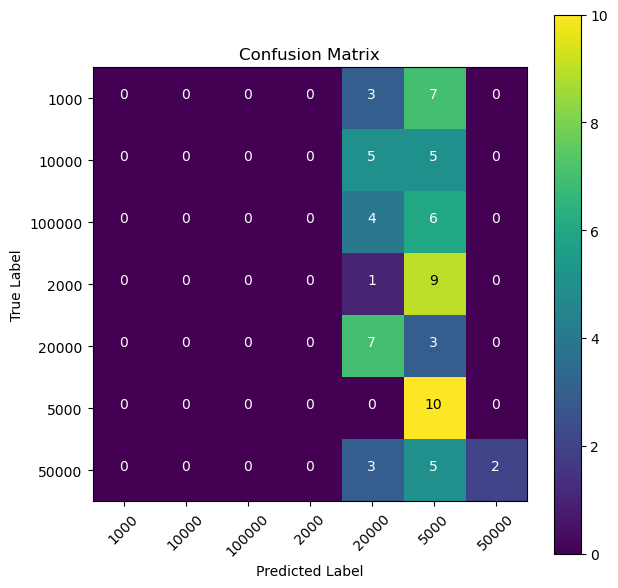

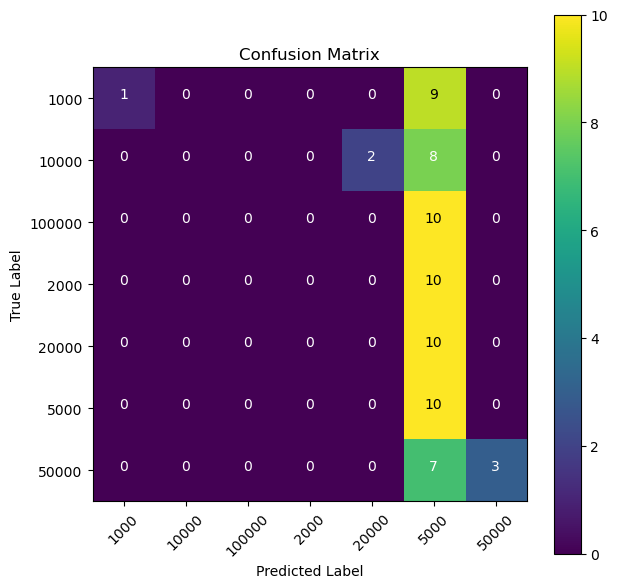

In [24]:
i = 0
#for i in len(parameter):
for i in range (90,95): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 96 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 40
learning rate: 0.08914964139849992
batch size: 128
dropout rate: 0.7308328604251534
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/40
4/4 [==============================] - ETA: 0s - loss: 3.4962 - acc: 0.2000
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan96/model\vgg_16_96-saved-model-01-acc-0.22.hdf5
4/4 [==============================] - 45s 12s/step - loss: 3.4962 - acc: 0.2000 - val_loss: 10.5753 - val_acc: 0.2214
Epoch 2/40
4/4 [==============================] - ETA: 0s - loss: 2.6417 - acc: 0.3592
Epoch 2: val_acc improved from 0.22143 to 0.22857, saving model to percobaan96/model\vgg_16_96-saved-model-02-acc-0.23.hdf5
4/4 [==============================] - 43s 12s/step - loss: 2.6417 - acc: 0.3592 - val_loss: 7.4478 - val_acc: 0.2286
Epoch 3/40
4/4 [=========

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.56      0.50      0.53        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.19      1.00      0.31        10
        5000       0.71      0.50      0.59        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.29        70
   macro avg       0.21      0.29      0.20        70
weighted avg       0.21      0.29      0.20        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 97 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 53
learning rate: 0.01564737410057251
batch size: 32
dropout rate: 0.5315804101484349
─────────────────────────────────────────────────────────────────────────────────────

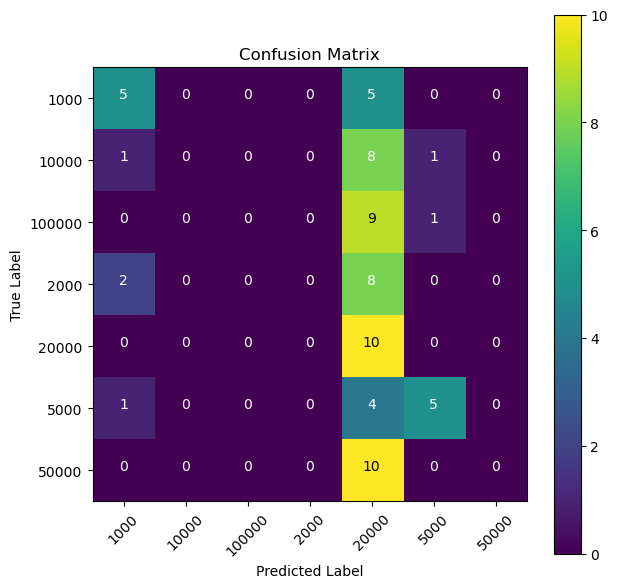

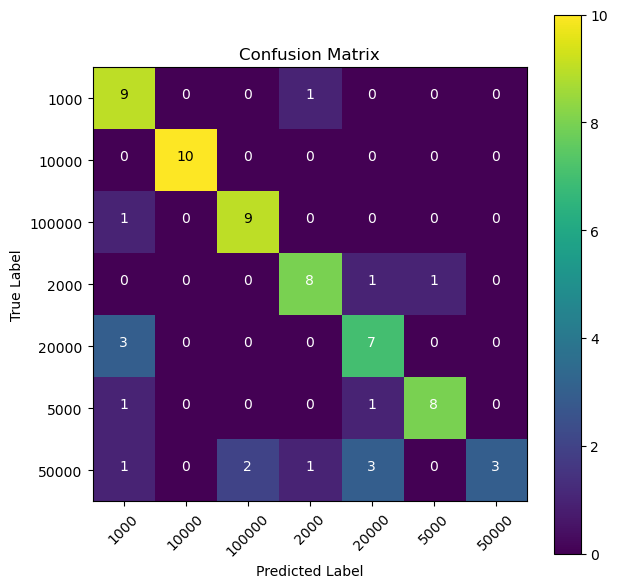

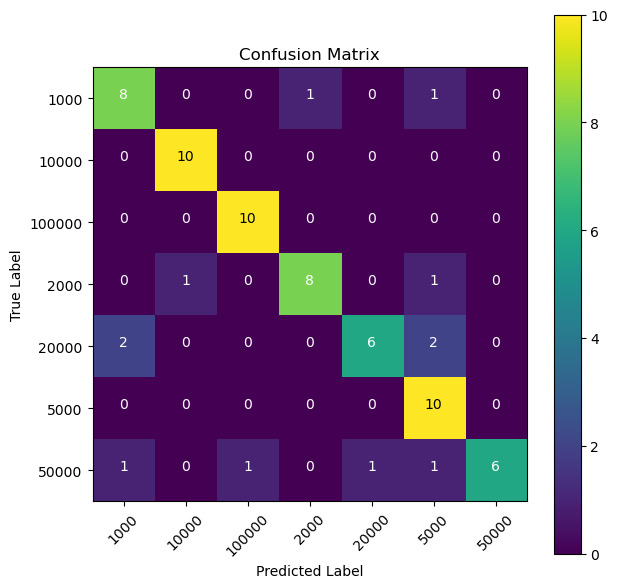

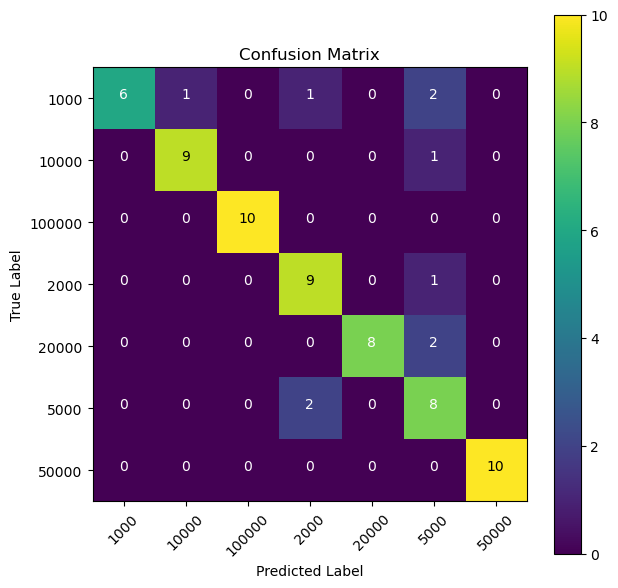

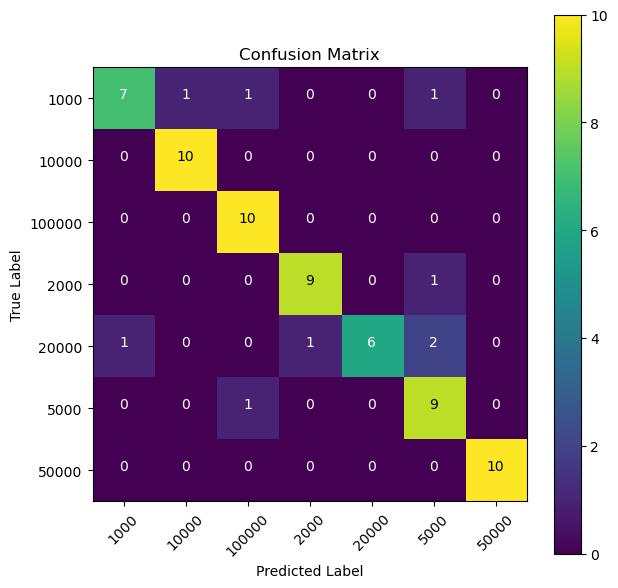

In [25]:
i = 0
#for i in len(parameter):
for i in range (95,100): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 101 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 49
learning rate: 0.022925341286770595
batch size: 64
dropout rate: 0.527383476590591
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/49
8/8 [==============================] - ETA: 0s - loss: 2.5293 - acc: 0.3041
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan101/model\vgg_16_101-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 34s 4s/step - loss: 2.5293 - acc: 0.3041 - val_loss: 3.4856 - val_acc: 0.2071
Epoch 2/49
8/8 [==============================] - ETA: 0s - loss: 1.3506 - acc: 0.4939
Epoch 2: val_acc improved from 0.20714 to 0.34286, saving model to percobaan101/model\vgg_16_101-saved-model-02-acc-0.34.hdf5
8/8 [==============================] - 38s 5s/step - loss: 1.3506 - acc: 0.4939 - val_loss: 3.2539 - val_acc: 0.3429
Epoch 3/49
8/8 [========

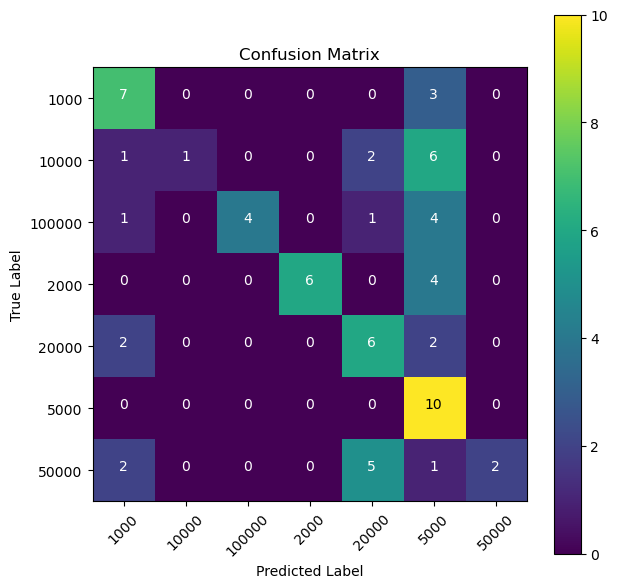

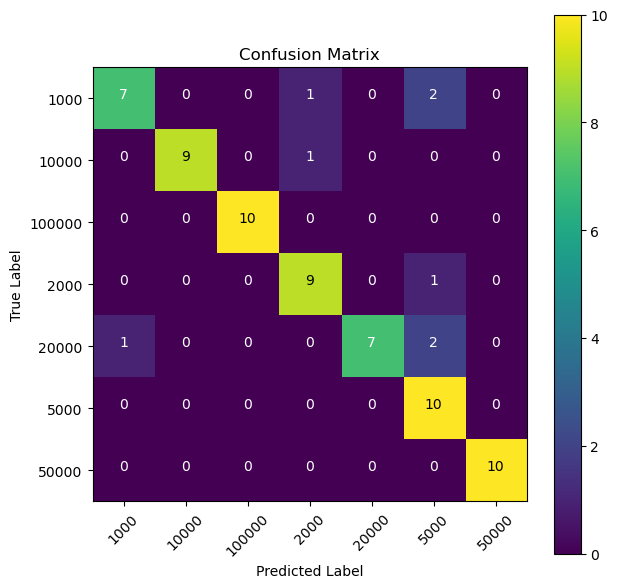

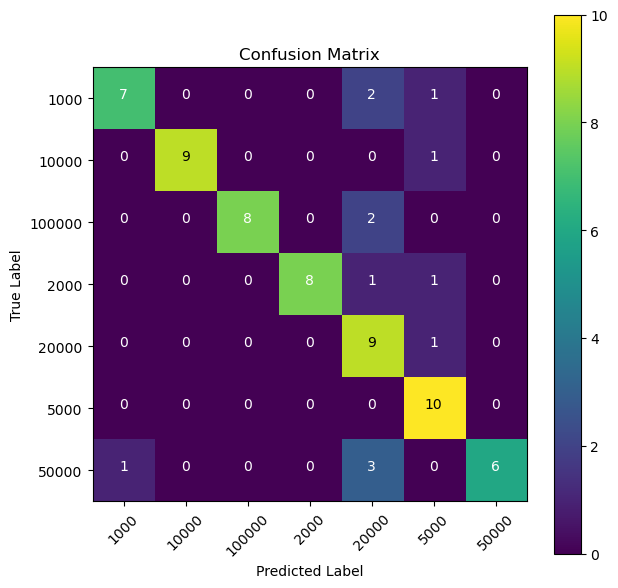

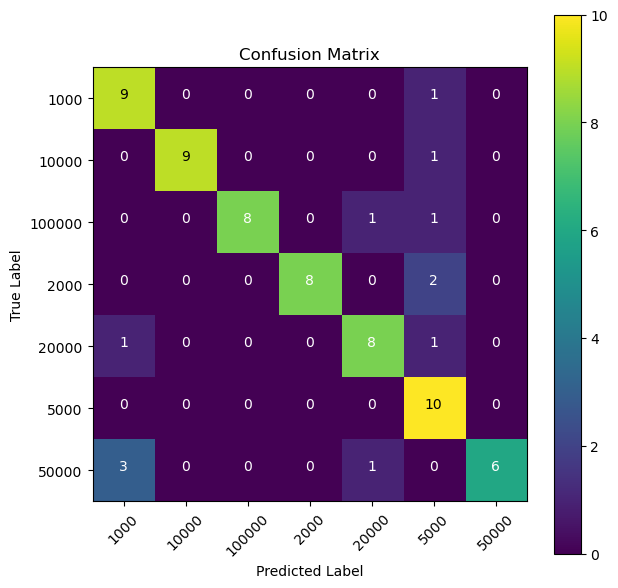

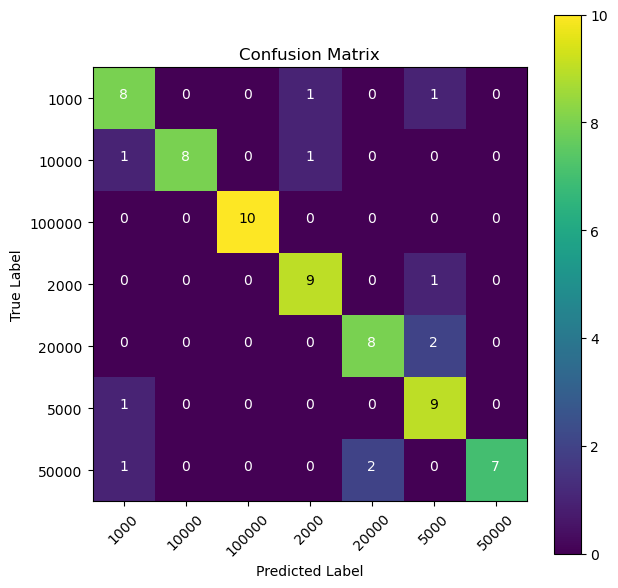

In [26]:
i = 0
#for i in len(parameter):
for i in range (100,105): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

In [26]:
i = 0
#for i in len(parameter):
for i in range (105,110): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 106 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.008700233610421833
batch size: 128
dropout rate: 0.6062205032420733
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/56
4/4 [==============================] - ETA: 0s - loss: 2.6452 - acc: 0.2918
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan106/model\vgg_16_106-saved-model-01-acc-0.20.hdf5
4/4 [==============================] - 44s 10s/step - loss: 2.6452 - acc: 0.2918 - val_loss: 2.2220 - val_acc: 0.2000
Epoch 2/56
4/4 [==============================] - ETA: 0s - loss: 1.4400 - acc: 0.5265
Epoch 2: val_acc improved from 0.20000 to 0.34286, saving model to percobaan106/model\vgg_16_106-saved-model-02-acc-0.34.hdf5
4/4 [==============================] - 48s 13s/step - loss: 1.4400 - acc: 0.5265 - val_loss: 2.4315 - val_acc: 0.3429
Epoch 3/56
4/4 [====

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.25      0.90      0.39        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.50      0.50        10
        5000       0.48      1.00      0.65        10
       50000       1.00      0.30      0.46        10

    accuracy                           0.39        70
   macro avg       0.32      0.39      0.29        70
weighted avg       0.32      0.39      0.29        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 107 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.015672237818911184
batch size: 128
dropout rate: 0.7028969349742514
──────────────────────────────────────────────────────────────────────────────────

: 

: 

Percobaan ke- 111 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.049639652995883146
batch size: 32
dropout rate: 0.7174057783512222
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/54
16/16 [==============================] - ETA: 0s - loss: 3.5337 - acc: 0.2367
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan111/model\vgg_16_111-saved-model-01-acc-0.20.hdf5
16/16 [==============================] - 42s 3s/step - loss: 3.5337 - acc: 0.2367 - val_loss: 4.3147 - val_acc: 0.2000
Epoch 2/54
16/16 [==============================] - ETA: 0s - loss: 2.5949 - acc: 0.2939
Epoch 2: val_acc did not improve from 0.20000
16/16 [==============================] - 51s 3s/step - loss: 2.5949 - acc: 0.2939 - val_loss: 2.5808 - val_acc: 0.1857
Epoch 3/54
16/16 [==============================] - ETA: 0s - loss: 2.0221 - acc: 0.3490
Epoch 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.64      0.90      0.75        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.44      0.70      0.54        10
        5000       0.28      1.00      0.43        10
       50000       1.00      0.30      0.46        10

    accuracy                           0.43        70
   macro avg       0.48      0.43      0.34        70
weighted avg       0.48      0.43      0.34        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 112 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 49
learning rate: 0.03337257999807543
batch size: 32
dropout rate: 0.7320507221732558
────────────────────────────────────────────────────────────────────────────────────

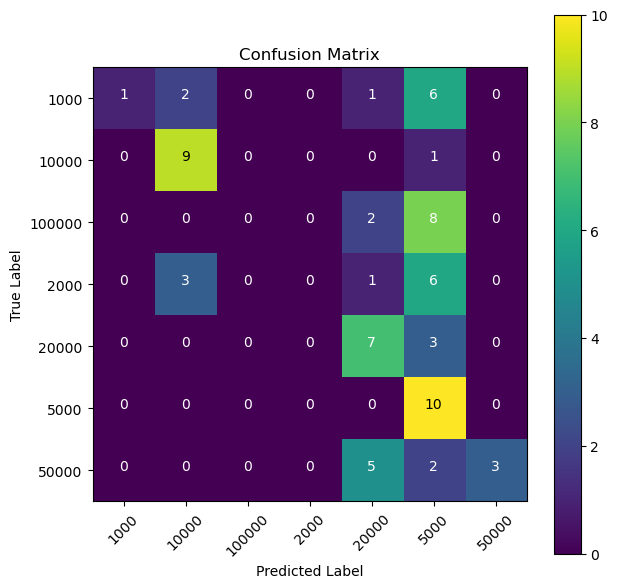

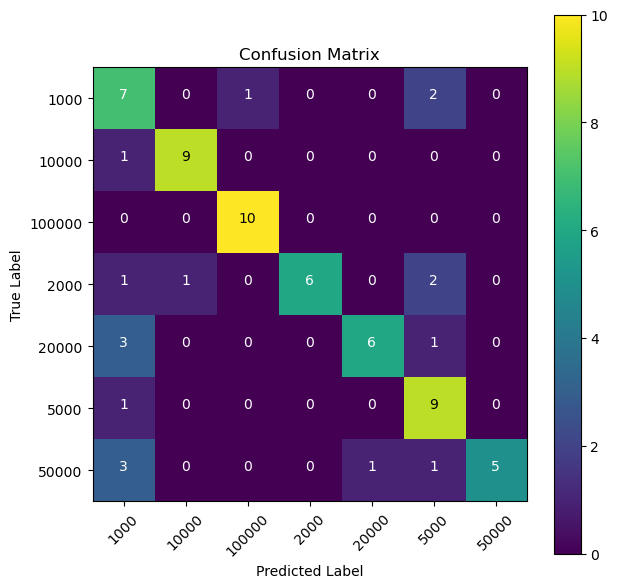

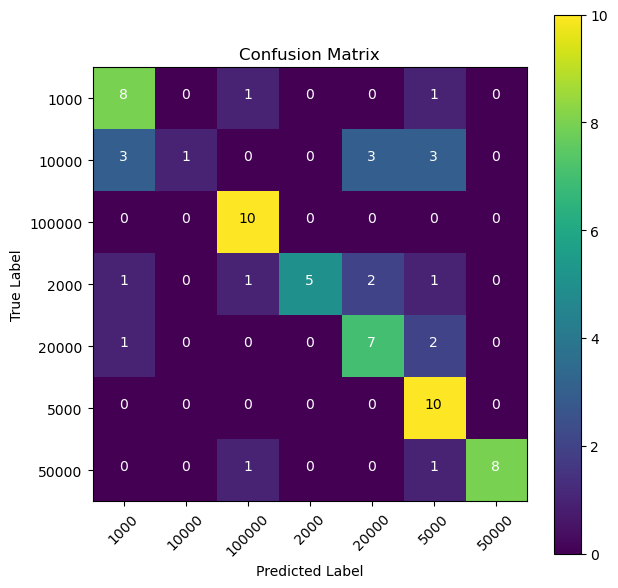

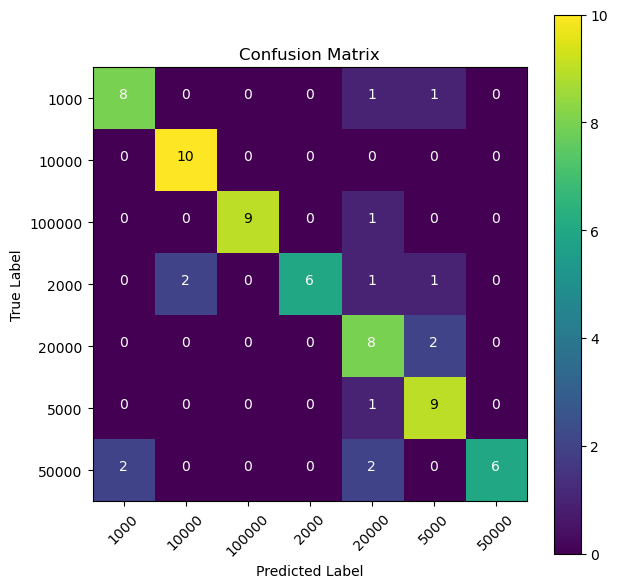

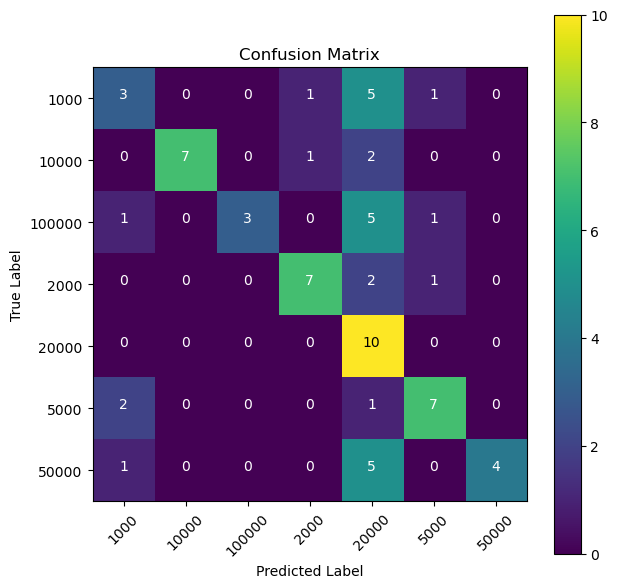

In [25]:
i = 0
#for i in len(parameter):
for i in range (110,115): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 116 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.0351175098903796
batch size: 64
dropout rate: 0.7671147898516892
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/56
8/8 [==============================] - ETA: 0s - loss: 3.2113 - acc: 0.2551
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan116/model\vgg_16_116-saved-model-01-acc-0.23.hdf5
8/8 [==============================] - 35s 4s/step - loss: 3.2113 - acc: 0.2551 - val_loss: 4.0585 - val_acc: 0.2286
Epoch 2/56
8/8 [==============================] - ETA: 0s - loss: 2.6443 - acc: 0.2980
Epoch 2: val_acc improved from 0.22857 to 0.34286, saving model to percobaan116/model\vgg_16_116-saved-model-02-acc-0.34.hdf5
8/8 [==============================] - 45s 6s/step - loss: 2.6443 - acc: 0.2980 - val_loss: 2.8608 - val_acc: 0.3429
Epoch 3/56
8/8 [=========

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.75      0.30      0.43        10
       10000       1.00      0.30      0.46        10
      100000       0.89      0.80      0.84        10
        2000       0.00      0.00      0.00        10
       20000       0.30      0.90      0.45        10
        5000       0.53      0.80      0.64        10
       50000       0.78      0.70      0.74        10

    accuracy                           0.54        70
   macro avg       0.61      0.54      0.51        70
weighted avg       0.61      0.54      0.51        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 117 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.030301122609280022
batch size: 128
dropout rate: 0.528846472035523
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.60      0.30      0.40        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.10      0.18        10
        2000       0.50      0.10      0.17        10
       20000       0.62      0.50      0.56        10
        5000       0.19      1.00      0.32        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.30        70
   macro avg       0.56      0.30      0.26        70
weighted avg       0.56      0.30      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 118 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.04482223163697349
batch size: 128
dropout rate: 0.6050157608592501
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 119 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 52
learning rate: 0.03723791215876305
batch size: 128
dropout rate: 0.7011630397834409
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/52
4/4 [==============================] - ETA: 0s - loss: 3.0360 - acc: 0.2653 
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan119/model\vgg_16_119-saved-model-01-acc-0.17.hdf5
4/4 [==============================] - 54s 16s/step - loss: 3.0360 - acc: 0.2653 - val_loss: 5.7146 - val_acc: 0.1714
Epoch 2/52
4/4 [==============================] - ETA: 0s - loss: 1.9687 - acc: 0.3918
Epoch 2: val_acc improved from 0.17143 to 0.25714, saving model to percobaan119/model\vgg_16_119-saved-model-02-acc-0.26.hdf5
4/4 [==============================] 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.60      0.60      0.60        10
       10000       0.88      0.70      0.78        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.40      0.57        10
       20000       0.28      0.90      0.43        10
        5000       0.56      0.90      0.69        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.50        70
   macro avg       0.47      0.50      0.44        70
weighted avg       0.47      0.50      0.44        70

────────────────────────────────────────────────────────────────────────────────────────────────────


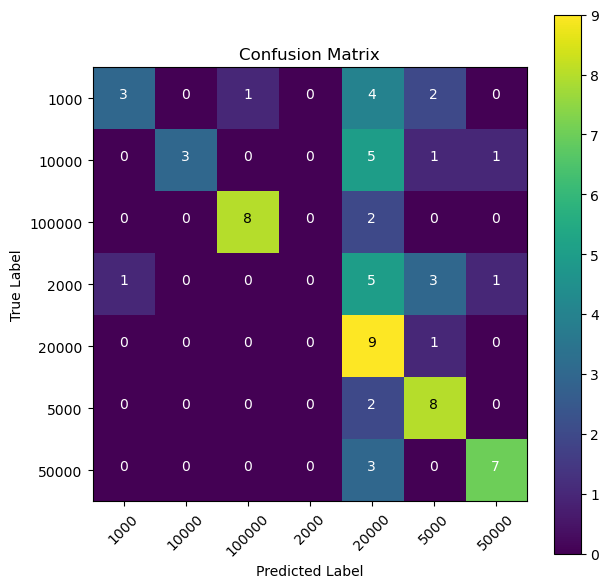

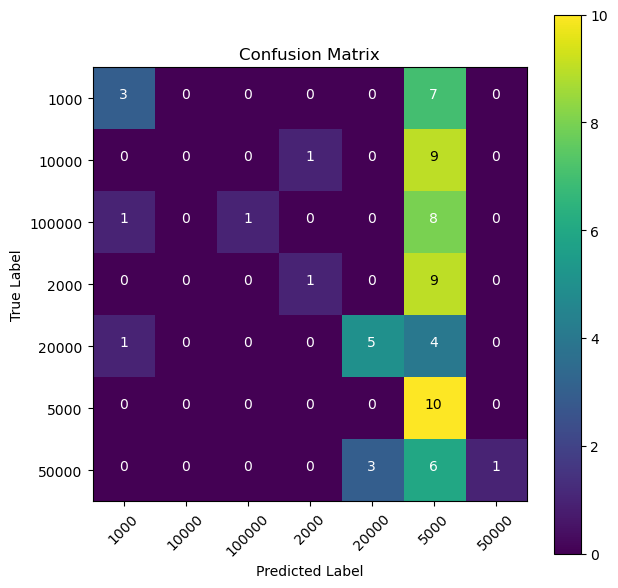

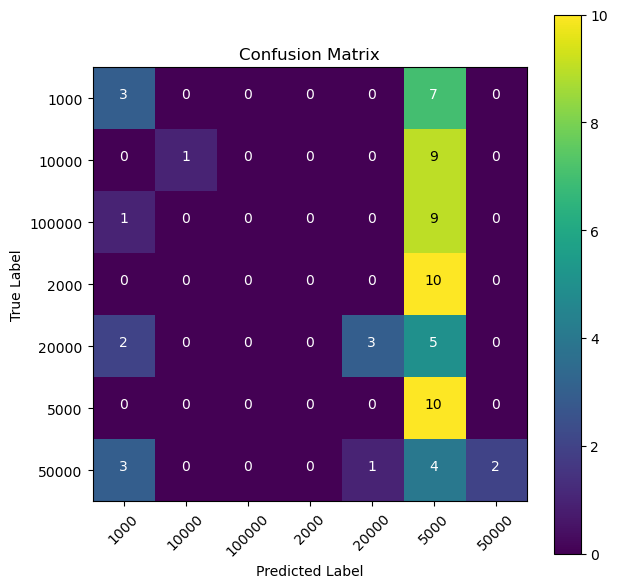

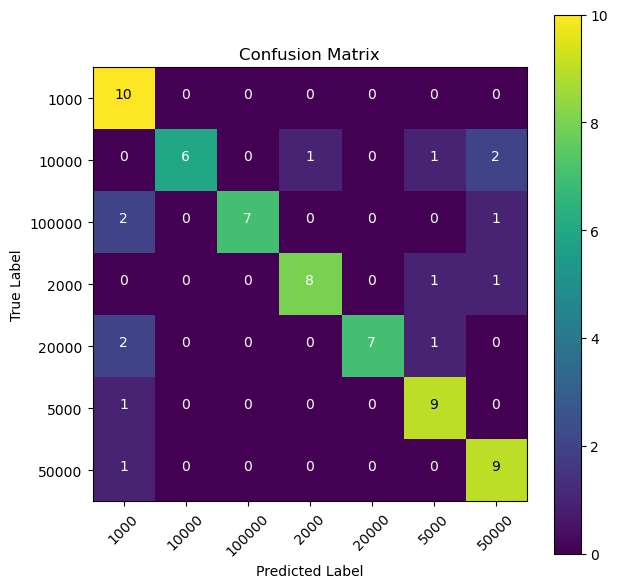

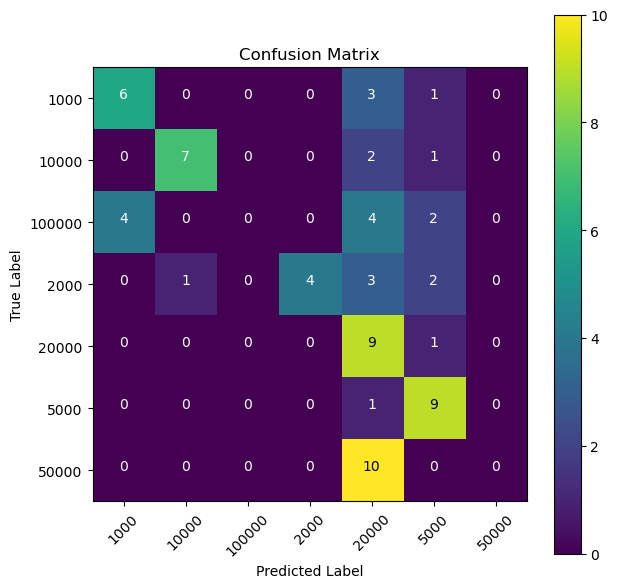

In [26]:
i = 0
#for i in len(parameter):
for i in range (115,120): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 121 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.05592353609234285
batch size: 32
dropout rate: 0.5288216657686752
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/56
16/16 [==============================] - ETA: 0s - loss: 3.0448 - acc: 0.2653
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan121/model\vgg_16_121-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 55s 4s/step - loss: 3.0448 - acc: 0.2653 - val_loss: 8.8412 - val_acc: 0.1643
Epoch 2/56
16/16 [==============================] - ETA: 0s - loss: 1.7650 - acc: 0.4429
Epoch 2: val_acc improved from 0.16429 to 0.21429, saving model to percobaan121/model\vgg_16_121-saved-model-02-acc-0.21.hdf5
16/16 [==============================] - 62s 4s/step - loss: 1.7650 - acc: 0.4429 - val_loss: 5.7858 - val_acc: 0.2143
Epoch 3/56
16/16

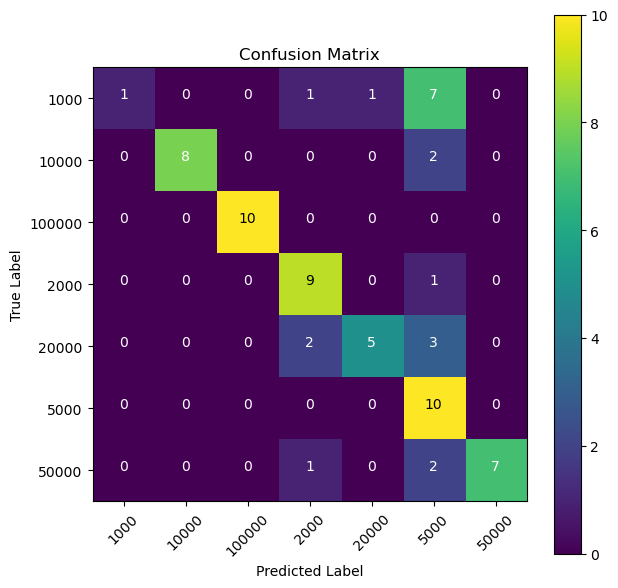

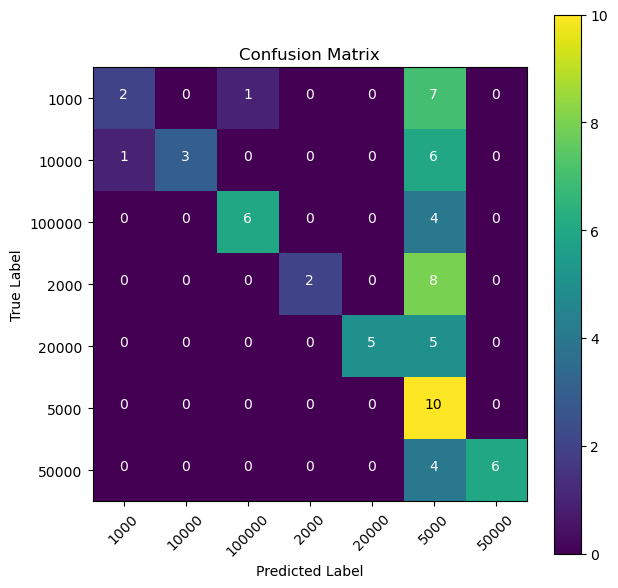

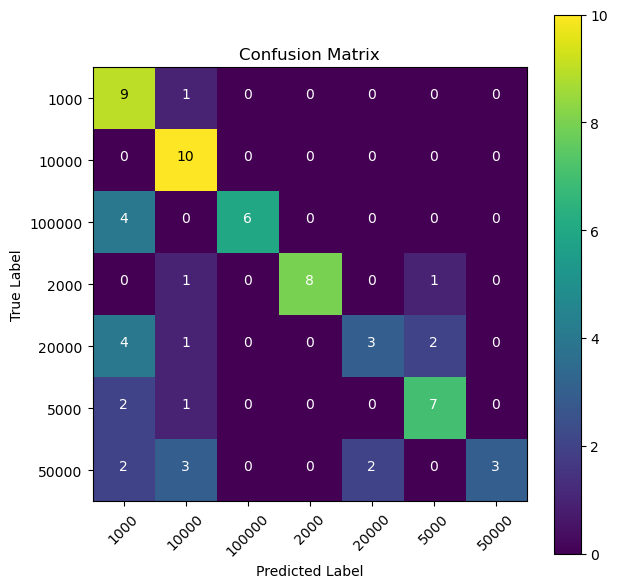

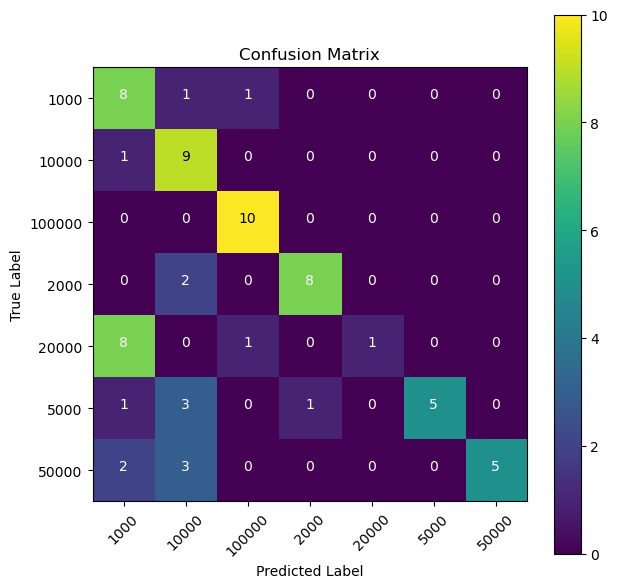

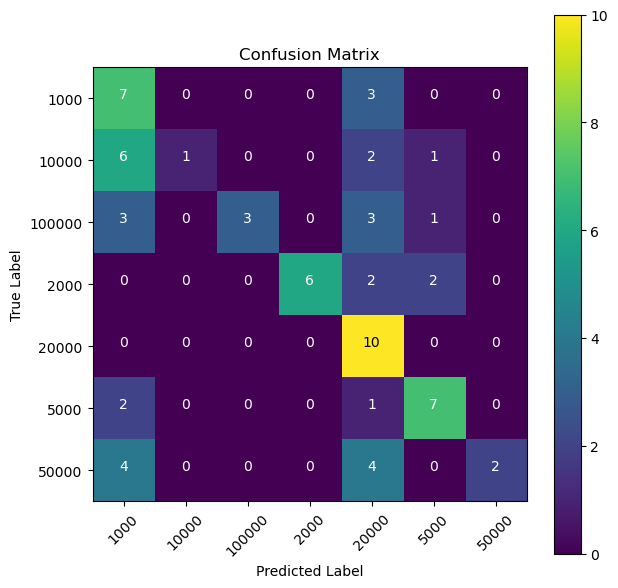

In [27]:
i = 0
#for i in len(parameter):
for i in range (120,125): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

In [28]:
i = 0
#for i in len(parameter):
for i in range (125,130): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 126 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.05596927738275968
batch size: 64
dropout rate: 0.6461558969127884
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/51
8/8 [==============================] - ETA: 0s - loss: 3.0301 - acc: 0.2796
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan126/model\vgg_16_126-saved-model-01-acc-0.24.hdf5
8/8 [==============================] - 36s 4s/step - loss: 3.0301 - acc: 0.2796 - val_loss: 5.6540 - val_acc: 0.2357
Epoch 2/51
8/8 [==============================] - ETA: 0s - loss: 2.2273 - acc: 0.3878
Epoch 2: val_acc improved from 0.23571 to 0.32143, saving model to percobaan126/model\vgg_16_126-saved-model-02-acc-0.32.hdf5
8/8 [==============================] - 32s 4s/step - loss: 2.2273 - acc: 0.3878 - val_loss: 3.3579 - val_acc: 0.3214
Epoch 3/51
8/8 [========

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.20      0.33        10
        2000       1.00      0.10      0.18        10
       20000       0.33      0.80      0.47        10
        5000       0.37      1.00      0.54        10
       50000       0.50      0.80      0.62        10

    accuracy                           0.41        70
   macro avg       0.46      0.41      0.31        70
weighted avg       0.46      0.41      0.31        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 130 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.06366595087791668
batch size: 128
dropout rate: 0.5765726048989832
───────────────────────────────────────────────────────────────────────────────────

: 

: 

[WinError 183] Cannot create a file when that file already exists: 'percobaan130'
[WinError 183] Cannot create a file when that file already exists: 'percobaan130/model'
Percobaan ke- 130 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 52
learning rate: 0.05236185385135709
batch size: 128
dropout rate: 0.6327690468763081
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/52
4/4 [==============================] - ETA: 0s - loss: 2.8235 - acc: 0.2571
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan130/model\vgg_16_130-saved-model-01-acc-0.22.hdf5
4/4 [==============================] - 34s 9s/step - loss: 2.8235 - acc: 0.2571 - val_loss: 7.6346 - val_acc: 0.2214
Epoch 2/52
4/4 [==============================] - ETA: 0s - loss: 1.8727 - acc: 0.4163
Epoch 2: val_acc did not improve from 0.22143
4/4 [==============================] - 40s 12s/ste

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.23      0.90      0.37        10
       10000       1.00      0.40      0.57        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.10      0.18        10
       20000       0.00      0.00      0.00        10
        5000       0.33      0.80      0.47        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.34        70
   macro avg       0.51      0.34      0.27        70
weighted avg       0.51      0.34      0.27        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 132 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.062312278211962654
batch size: 128
dropout rate: 0.7419020314861339
──────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.44      0.80      0.57        10
       10000       1.00      0.20      0.33        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.28      0.80      0.41        10
        5000       0.57      0.80      0.67        10
       50000       1.00      0.50      0.67        10

    accuracy                           0.47        70
   macro avg       0.61      0.47      0.43        70
weighted avg       0.61      0.47      0.43        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 133 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 56
learning rate: 0.07935876310030822
batch size: 32
dropout rate: 0.5029323193782806
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.36      0.40      0.38        10
       10000       1.00      0.90      0.95        10
      100000       1.00      0.10      0.18        10
        2000       0.62      0.50      0.56        10
       20000       0.25      1.00      0.40        10
        5000       1.00      0.10      0.18        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.43        70
   macro avg       0.61      0.43      0.38        70
weighted avg       0.61      0.43      0.38        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 134 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 54
learning rate: 0.09066222989992184
batch size: 32
dropout rate: 0.6358654756432072
────────────────────────────────────────────────────────────────────────────────────

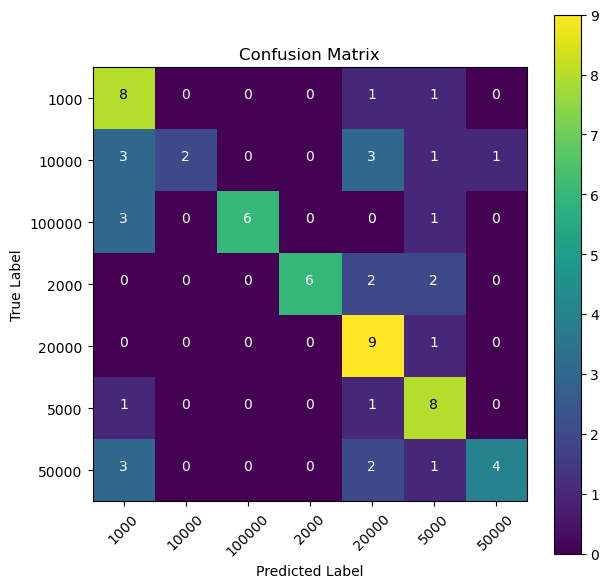

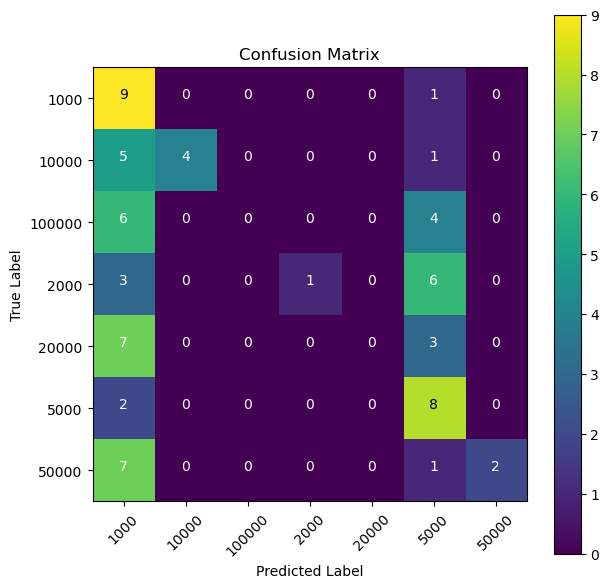

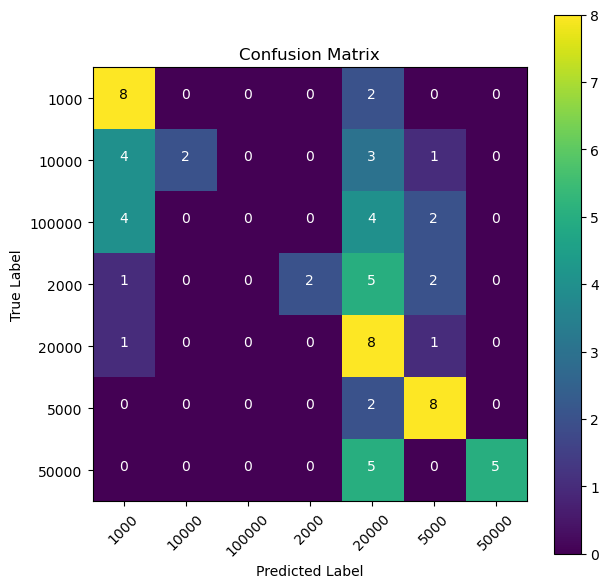

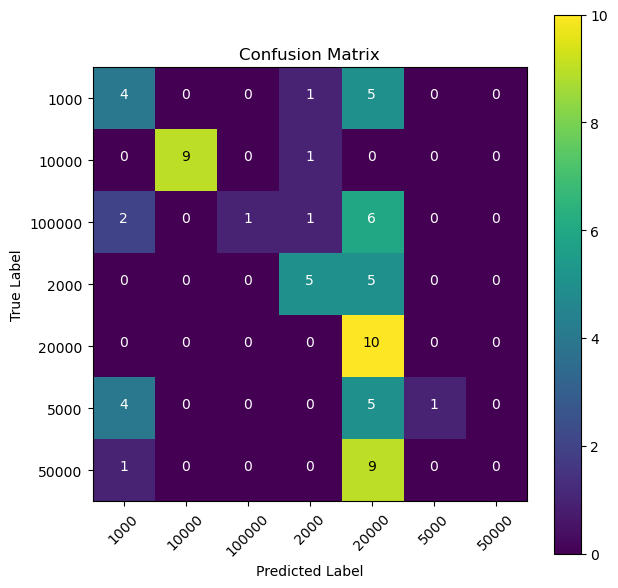

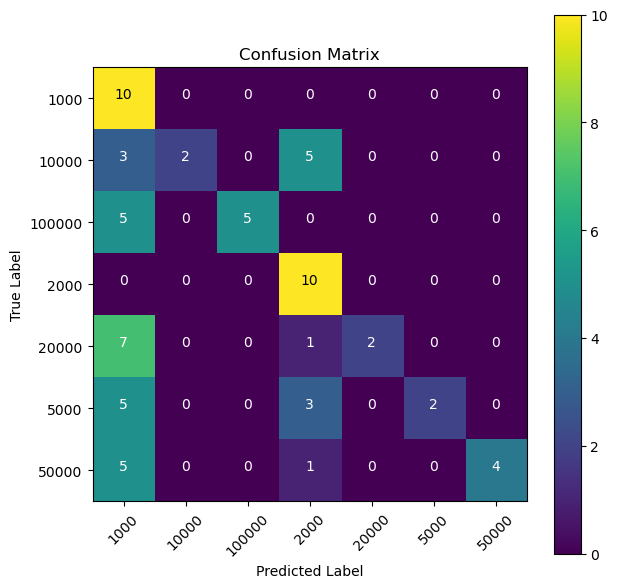

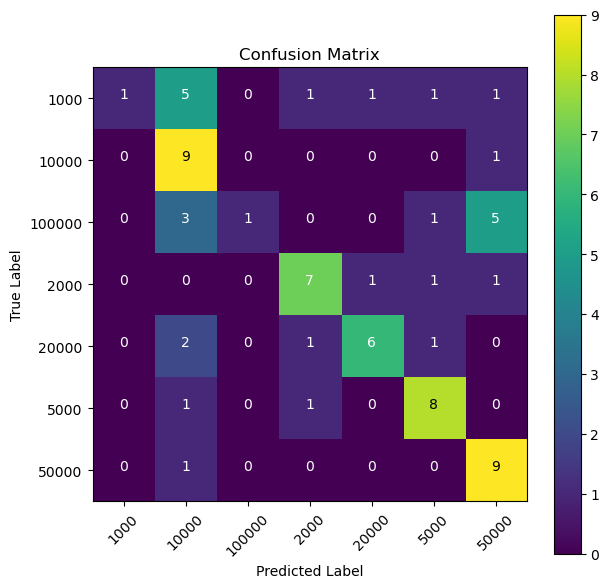

In [26]:
i = 0
#for i in len(parameter):
for i in range (129,135): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 136 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 50
learning rate: 0.08169151938705192
batch size: 32
dropout rate: 0.7410659255896106
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/50
16/16 [==============================] - ETA: 0s - loss: 4.6733 - acc: 0.1959
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan136/model\vgg_16_136-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 38s 2s/step - loss: 4.6733 - acc: 0.1959 - val_loss: 10.2458 - val_acc: 0.2071
Epoch 2/50
16/16 [==============================] - ETA: 0s - loss: 3.1538 - acc: 0.2633
Epoch 2: val_acc improved from 0.20714 to 0.27857, saving model to percobaan136/model\vgg_16_136-saved-model-02-acc-0.28.hdf5
16/16 [==============================] - 81s 5s/step - loss: 3.1538 - acc: 0.2633 - val_loss: 2.5358 - val_acc: 0.2786
Epoch 3/50
16/1

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.00      0.00      0.00        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.20      0.33        10
       20000       0.24      0.80      0.36        10
        5000       0.27      0.90      0.42        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.29        70
   macro avg       0.36      0.29      0.19        70
weighted avg       0.36      0.29      0.19        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 140 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.07887405204485254
batch size: 64
dropout rate: 0.7277835886467279
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.50      0.20      0.29        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.32      0.80      0.46        10
        5000       0.26      1.00      0.42        10
       50000       1.00      0.30      0.46        10

    accuracy                           0.33        70
   macro avg       0.30      0.33      0.23        70
weighted avg       0.30      0.33      0.23        70

────────────────────────────────────────────────────────────────────────────────────────────────────


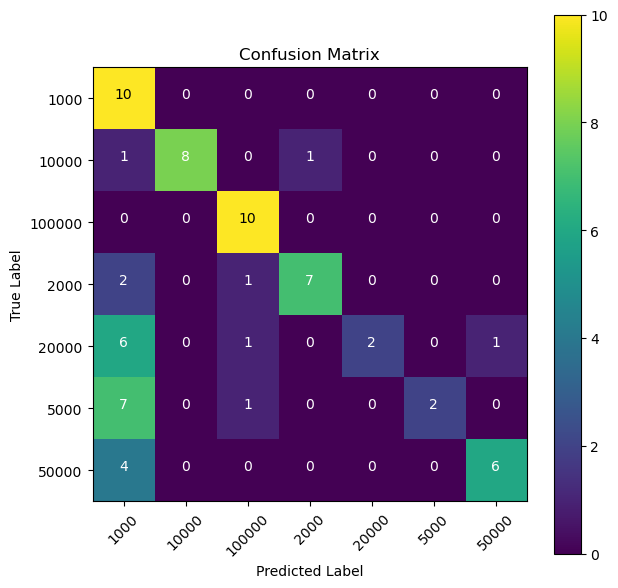

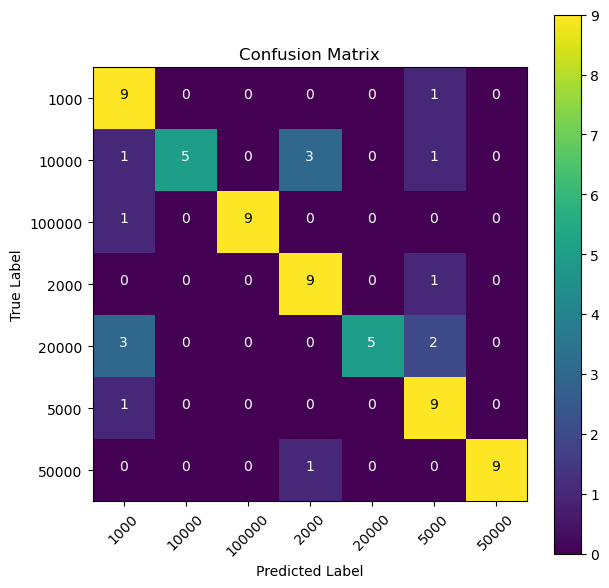

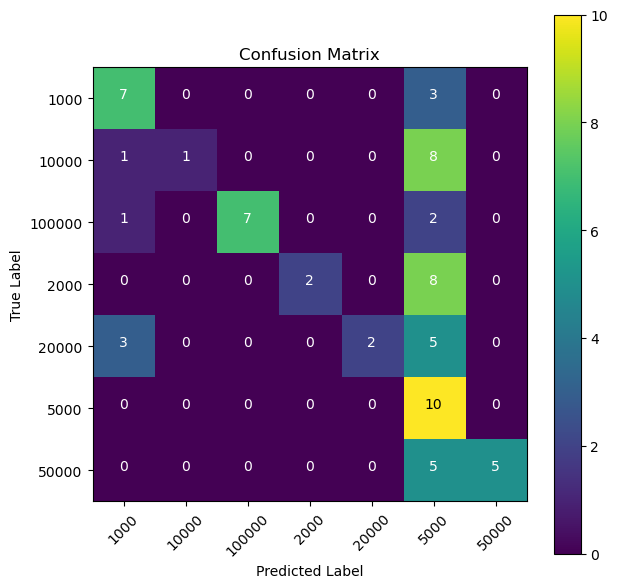

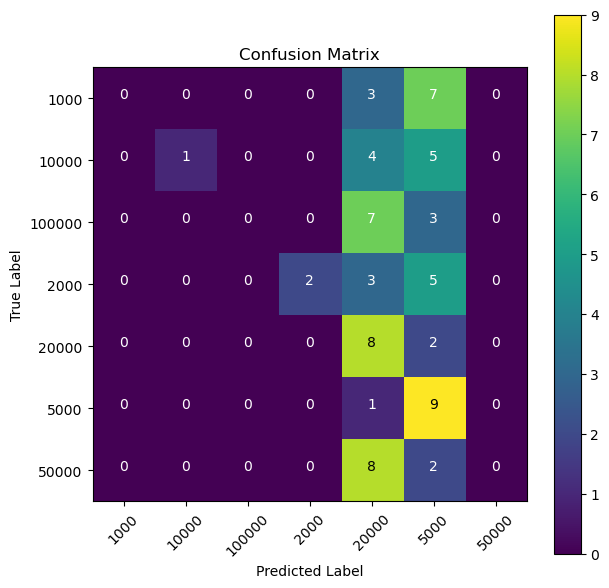

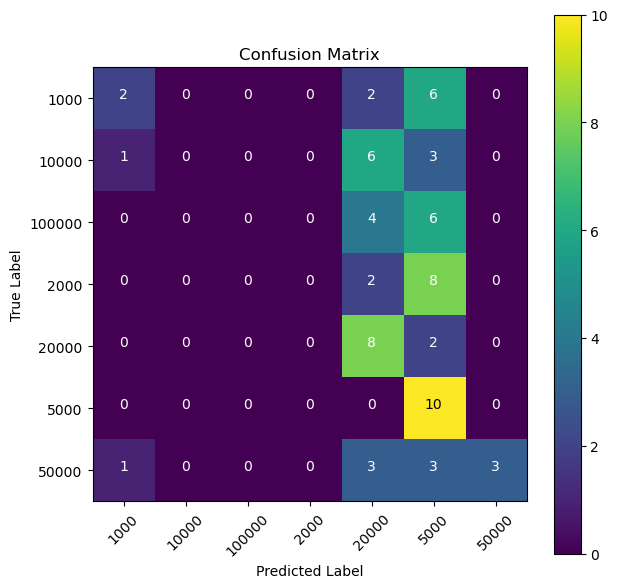

In [27]:
i = 0
#for i in len(parameter):
for i in range (135,140): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

In [33]:
i = 0
#for i in len(parameter):
for i in range (140,145): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  print("".center(100,"─"))

Percobaan ke- 141 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 49
learning rate: 0.08607305020160189
batch size: 128
dropout rate: 0.5356456244817892
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/49
4/4 [==============================] - ETA: 0s - loss: 2.9441 - acc: 0.2490 
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan141/model\vgg_16_141-saved-model-01-acc-0.21.hdf5
4/4 [==============================] - 112s 27s/step - loss: 2.9441 - acc: 0.2490 - val_loss: 17.7794 - val_acc: 0.2071
Epoch 2/49
4/4 [==============================] - ETA: 0s - loss: 1.9174 - acc: 0.4469 
Epoch 2: val_acc did not improve from 0.20714
4/4 [==============================] - 100s 26s/step - loss: 1.9174 - acc: 0.4469 - val_loss: 12.3817 - val_acc: 0.2000
Epoch 3/49
4/4 [==============================] - ETA: 0s - loss: 1.4611 - acc: 0.5184 
Epoch 3

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.32      0.90      0.47        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.55      0.60      0.57        10
        5000       0.43      1.00      0.61        10
       50000       0.71      0.50      0.59        10

    accuracy                           0.44        70
   macro avg       0.43      0.44      0.35        70
weighted avg       0.43      0.44      0.35        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 142 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 55
learning rate: 0.08114324189687783
batch size: 128
dropout rate: 0.5977027719129155
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


              precision    recall  f1-score   support

        1000       0.26      0.90      0.41        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.67      0.20      0.31        10
       20000       0.00      0.00      0.00        10
        5000       0.29      0.90      0.44        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.31        70
   macro avg       0.32      0.31      0.21        70
weighted avg       0.32      0.31      0.21        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 143 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 48
learning rate: 0.09632286049875585
batch size: 128
dropout rate: 0.6682336513152286
───────────────────────────────────────────────────────────────────────────────────

: 

: 

In [27]:
print(arr_accuracy16)

[]


Percobaan ke- 56 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.005491476808886869
batch size: 64
dropout rate: 0.7706644836147145
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/39
8/8 [==============================] - ETA: 0s - loss: 3.4423 - acc: 0.2020
Epoch 1: val_acc improved from -inf to 0.38571, saving model to percobaan56/model\vgg_16_56-saved-model-01-acc-0.39.hdf5
8/8 [==============================] - 38s 5s/step - loss: 3.4423 - acc: 0.2020 - val_loss: 2.6204 - val_acc: 0.3857
Epoch 2/39
8/8 [==============================] - ETA: 0s - loss: 2.3408 - acc: 0.3469
Epoch 2: val_acc did not improve from 0.38571
8/8 [==============================] - 35s 4s/step - loss: 2.3408 - acc: 0.3469 - val_loss: 2.4429 - val_acc: 0.2286
Epoch 3/39
8/8 [==============================] - ETA: 0s - loss: 1.7464 - acc: 0.4673
Epoch 3: val_acc im

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\1985419816.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/44
4/4 [==============================] - ETA: 0s - loss: 2.3641 - acc: 0.3306 
Epoch 1: val_acc improved from -inf to 0.19286, saving model to percobaan57/model\vgg_16_57-saved-model-01-acc-0.19.hdf5
4/4 [==============================] - 99s 29s/step - loss: 2.3641 - acc: 0.3306 - val_loss: 3.3142 - val_acc: 0.1929
Epoch 2/44
4/4 [==============================] - ETA: 0s - loss: 1.2322 - acc: 0.5857 
Epoch 2: val_acc improved from 0.19286 to 0.29286, saving model to percobaan57/model\vgg_16_57-saved-model-02-acc-0.29.hdf5
4/4 [==============================] - 112s 31s/step - loss: 1.2322 - acc: 0.5857 - val_loss: 2.7586 - val_acc: 0.2929
Epoch 3/44
4/4 [==============================] - ETA: 0s - loss: 0.8421 - acc: 0.7143 
Epoch 3: val_acc improved from 0.29286 to 0.40714, saving model to percobaan57/model\vgg_16_57-saved-model-03-acc-0.41.hdf5
4/4 [==============================] - 112s 31s/step - loss: 0.8421 - acc: 0.7143 - val_loss: 2.0571 - val_acc: 0.4071
Epoch 4/44


c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\19854

              precision    recall  f1-score   support

        1000       0.71      0.50      0.59        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       1.00      0.30      0.46        10
        5000       0.18      1.00      0.31        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.33        70
   macro avg       0.56      0.33      0.30        70
weighted avg       0.56      0.33      0.30        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 58 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 39
learning rate: 0.020601109398525993
batch size: 128
dropout rate: 0.6134134589105704
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\19854

              precision    recall  f1-score   support

        1000       0.37      0.70      0.48        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.67      0.20      0.31        10
       20000       0.57      0.40      0.47        10
        5000       0.25      1.00      0.40        10
       50000       1.00      0.10      0.18        10

    accuracy                           0.34        70
   macro avg       0.41      0.34      0.26        70
weighted avg       0.41      0.34      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 59 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 44
learning rate: 0.004644345794412814
batch size: 128
dropout rate: 0.680923299308516
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\1985419816.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/47
4/4 [==============================] - ETA: 0s - loss: 3.1417 - acc: 0.2490 
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan60/model\vgg_16_60-saved-model-01-acc-0.19.hdf5
4/4 [==============================] - 80s 21s/step - loss: 3.1417 - acc: 0.2490 - val_loss: 4.6321 - val_acc: 0.1857
Epoch 2/47
4/4 [==============================] - ETA: 0s - loss: 1.9111 - acc: 0.4204 
Epoch 2: val_acc did not improve from 0.18571
4/4 [==============================] - 84s 24s/step - loss: 1.9111 - acc: 0.4204 - val_loss: 4.1440 - val_acc: 0.1786
Epoch 3/47
4/4 [==============================] - ETA: 0s - loss: 1.3483 - acc: 0.5286 
Epoch 3: val_acc improved from 0.18571 to 0.37857, saving model to percobaan60/model\vgg_16_60-saved-model-03-acc-0.38.hdf5
4/4 [==============================] - 76s 20s/step - loss: 1.3483 - acc: 0.5286 - val_loss: 3.1862 - val_acc: 0.3786
Epoch 4/47
4/4 [==============================] - ETA: 0s - loss: 1.2725 - acc: 0.5612 
Epo

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\1985419816.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────


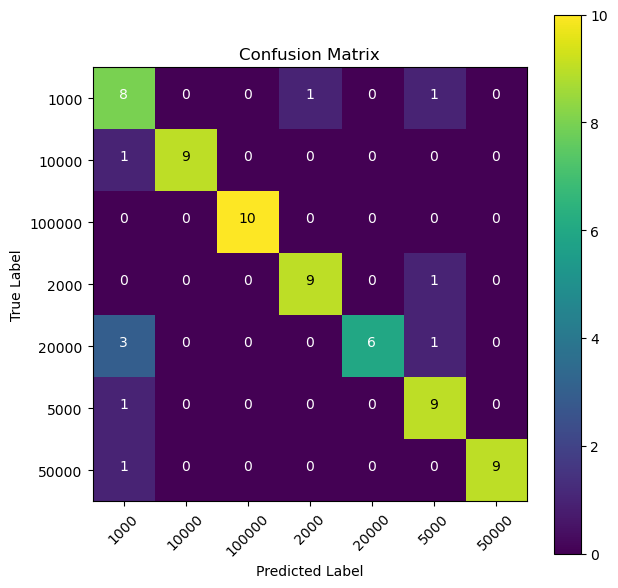

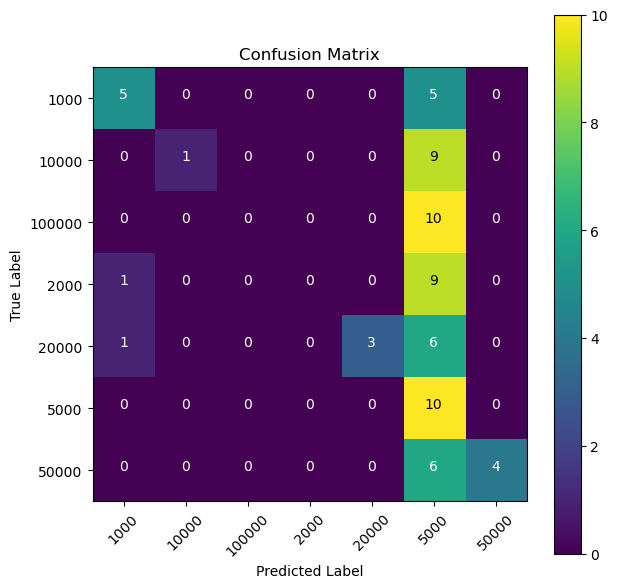

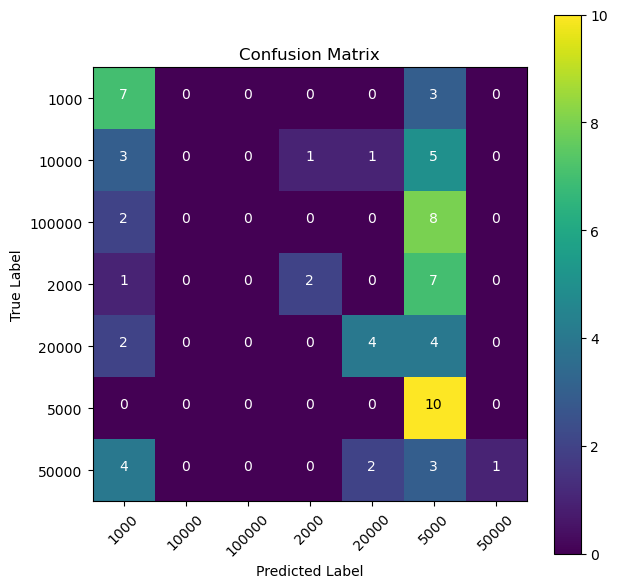

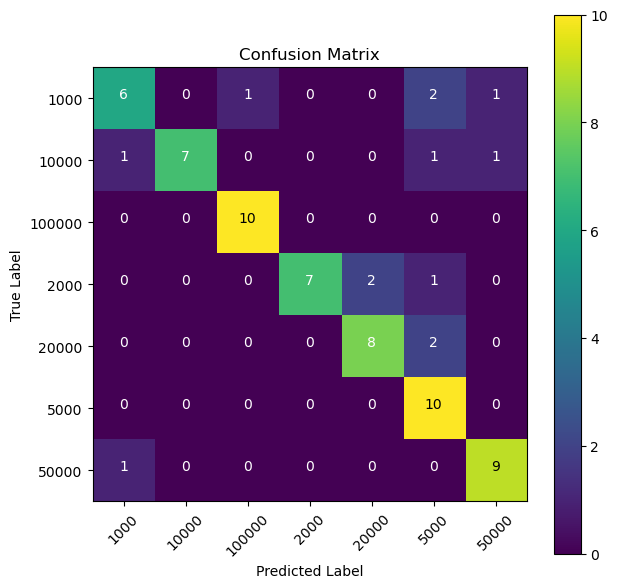

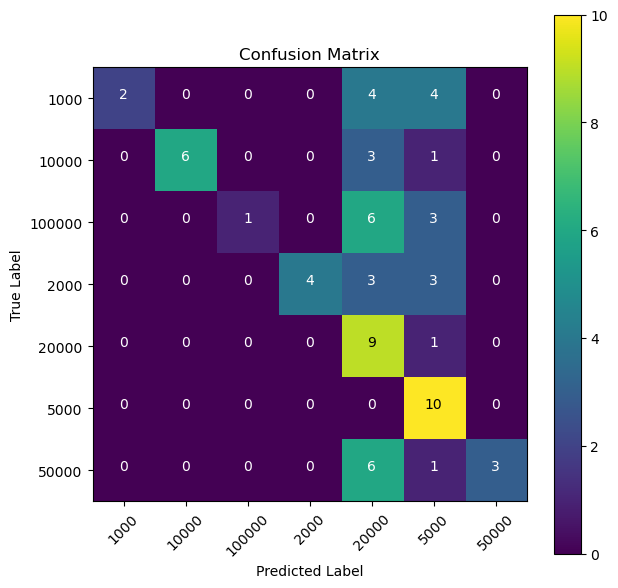

In [30]:
j = 55
for i in range (j,60):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (j+1)
  hasilTabel.to_excel("hasilTabel.xlsx")
  print("".center(100,"─"))

Percobaan ke- 108 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 52
learning rate: 0.013573402721822442
batch size: 128
dropout rate: 0.761192612318089
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/52
4/4 [==============================] - ETA: 0s - loss: 3.2263 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan108/model\vgg_16_108-saved-model-01-acc-0.19.hdf5
4/4 [==============================] - 38s 9s/step - loss: 3.2263 - acc: 0.2163 - val_loss: 3.0725 - val_acc: 0.1857
Epoch 2/52
4/4 [==============================] - ETA: 0s - loss: 1.9420 - acc: 0.4204
Epoch 2: val_acc did not improve from 0.18571
4/4 [==============================] - 34s 9s/step - loss: 1.9420 - acc: 0.4204 - val_loss: 3.7118 - val_acc: 0.1429
Epoch 3/52
4/4 [==============================] - ETA: 0s - loss: 1.5399 - acc: 0.5041
Epoch 3: val_acc

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18176\37891

              precision    recall  f1-score   support

        1000       0.83      0.50      0.62        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.56      0.50      0.53        10
        5000       0.19      1.00      0.31        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.30        70
   macro avg       0.37      0.30      0.24        70
weighted avg       0.37      0.30      0.24        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 109 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 51
learning rate: 0.04914892724743228
batch size: 32
dropout rate: 0.5716040737285
───────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18176\3789140505.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/50
16/16 [==============================] - ETA: 0s - loss: 2.8734 - acc: 0.2714
Epoch 1: val_acc improved from -inf to 0.17143, saving model to percobaan110/model\vgg_16_110-saved-model-01-acc-0.17.hdf5
16/16 [==============================] - 46s 3s/step - loss: 2.8734 - acc: 0.2714 - val_loss: 6.3754 - val_acc: 0.1714
Epoch 2/50
16/16 [==============================] - ETA: 0s - loss: 2.1227 - acc: 0.3796
Epoch 2: val_acc improved from 0.17143 to 0.35000, saving model to percobaan110/model\vgg_16_110-saved-model-02-acc-0.35.hdf5
16/16 [==============================] - 44s 3s/step - loss: 2.1227 - acc: 0.3796 - val_loss: 2.8530 - val_acc: 0.3500
Epoch 3/50
16/16 [==============================] - ETA: 0s - loss: 1.4409 - acc: 0.5388
Epoch 3: val_acc did not improve from 0.35000
16/16 [==============================] - 40s 3s/step - loss: 1.4409 - acc: 0.5388 - val_loss: 2.8192 - val_acc: 0.3000
Epoch 4/50
16/16 [==============================] - ETA: 0s - loss: 1.2538 - acc:

C:\Users\ardin\AppData\Local\Temp\ipykernel_18176\3789140505.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


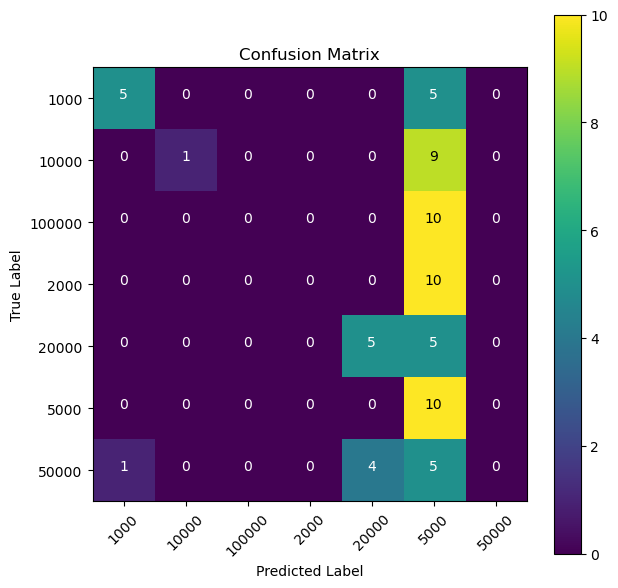

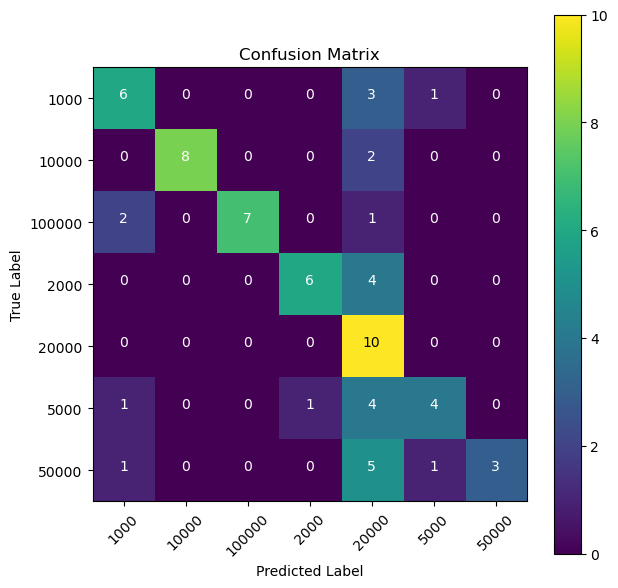

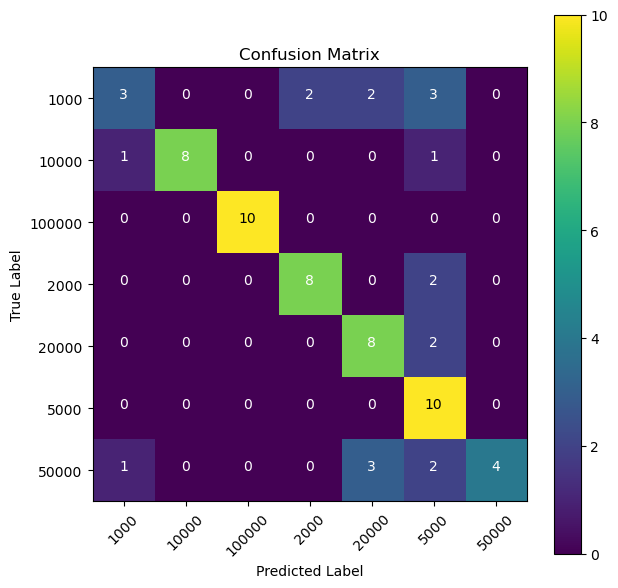

In [27]:
j = 107
for i in range (j,110):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (j+1)
  hasilTabel.to_excel("hasilTabel.xlsx")
  print("".center(100,"─"))

Percobaan ke- 154 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 58
learning rate: 0.0015834415215939023
batch size: 128
dropout rate: 0.6354346464668529
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
4/4 [==============================] - ETA: 0s - loss: 3.4525 - acc: 0.1612
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan154/model\vgg_16_154-saved-model-01-acc-0.16.hdf5
4/4 [==============================] - 35s 9s/step - loss: 3.4525 - acc: 0.1612 - val_loss: 2.0541 - val_acc: 0.1571
Epoch 2/58
4/4 [==============================] - ETA: 0s - loss: 2.8078 - acc: 0.2469
Epoch 2: val_acc improved from 0.15714 to 0.22143, saving model to percobaan154/model\vgg_16_154-saved-model-02-acc-0.22.hdf5
4/4 [==============================] - 33s 9s/step - loss: 2.8078 - acc: 0.2469 - val_loss: 1.9259 - val_acc: 0.2214
Epoch 3/58
4/4 [=====

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
4/4 [==============================] - ETA: 0s - loss: 3.0565 - acc: 0.2204
Epoch 1: val_acc improved from -inf to 0.26429, saving model to percobaan155/model\vgg_16_155-saved-model-01-acc-0.26.hdf5
4/4 [==============================] - 45s 13s/step - loss: 3.0565 - acc: 0.2204 - val_loss: 1.8691 - val_acc: 0.2643
Epoch 2/57
4/4 [==============================] - ETA: 0s - loss: 1.9864 - acc: 0.3878
Epoch 2: val_acc did not improve from 0.26429
4/4 [==============================] - 50s 13s/step - loss: 1.9864 - acc: 0.3878 - val_loss: 2.1300 - val_acc: 0.1929
Epoch 3/57
4/4 [==============================] - ETA: 0s - loss: 1.5748 - acc: 0.5000
Epoch 3: val_acc did not improve from 0.26429
4/4 [==============================] - 51s 13s/step - loss: 1.5748 - acc: 0.5000 - val_loss: 2.0069 - val_acc: 0.2357
Epoch 4/57
4/4 [==============================] - ETA: 0s - loss: 1.2214 - acc: 0.5837
Epoch 4: val_acc improved from 0.26429 to 0.27143, saving model to percobaan155/mod

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 156 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.011880734757240772
batch size: 128
dropout rate: 0.7966796097699946
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/65
4/4 [==============================] - ETA: 0s - loss: 3.5150 - acc: 0.2082
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan156/model\vgg_16_156-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 52s 15s/step - loss: 3.5150 - acc: 0.2082 - val_loss: 2.9536 - val_acc: 0.1500
Epoch 2/65
4/4 [==============================] - ETA: 0s - loss: 2.2764 - acc: 0.3755
Epoch 2: val_acc did not improve from 0.15000
4/4 [==============================] - 50s 13s/step - loss: 2.2764 - acc: 0.3755 - val_loss: 4.0809 - val_acc: 0.1500

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
16/16 [==============================] - ETA: 0s - loss: 2.5054 - acc: 0.3041
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan157/model\vgg_16_157-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 77s 5s/step - loss: 2.5054 - acc: 0.3041 - val_loss: 4.8683 - val_acc: 0.2357
Epoch 2/65
16/16 [==============================] - ETA: 0s - loss: 1.6058 - acc: 0.5163
Epoch 2: val_acc improved from 0.23571 to 0.43571, saving model to percobaan157/model\vgg_16_157-saved-model-02-acc-0.44.hdf5
16/16 [==============================] - 85s 5s/step - loss: 1.6058 - acc: 0.5163 - val_loss: 2.4059 - val_acc: 0.4357
Epoch 3/65
16/16 [==============================] - ETA: 0s - loss: 1.2110 - acc: 0.6163
Epoch 3: val_acc did not improve from 0.43571
16/16 [==============================] - 85s 5s/step - loss: 1.2110 - acc: 0.6163 - val_loss: 2.9271 - val_acc: 0.3286
Epoch 4/65
16/16 [==============================] - ETA: 0s - loss: 0.9835 - acc:

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 158 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.038977206651504254
batch size: 32
dropout rate: 0.5938349772296305
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/59
16/16 [==============================] - ETA: 0s - loss: 2.7849 - acc: 0.2939
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan158/model\vgg_16_158-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 53s 3s/step - loss: 2.7849 - acc: 0.2939 - val_loss: 9.8373 - val_acc: 0.1857
Epoch 2/59
16/16 [==============================] - ETA: 0s - loss: 1.8278 - acc: 0.4367
Epoch 2: val_acc improved from 0.18571 to 0.38571, saving model to percobaan158/model\vgg_16_158-saved-model-02-acc-0.39.hdf5
16/16 [==========================

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/61
16/16 [==============================] - ETA: 0s - loss: 3.0527 - acc: 0.2347
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan159/model\vgg_16_159-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 53s 3s/step - loss: 3.0527 - acc: 0.2347 - val_loss: 8.2948 - val_acc: 0.1429
Epoch 2/61
16/16 [==============================] - ETA: 0s - loss: 2.0365 - acc: 0.3653
Epoch 2: val_acc improved from 0.14286 to 0.48571, saving model to percobaan159/model\vgg_16_159-saved-model-02-acc-0.49.hdf5
16/16 [==============================] - 51s 3s/step - loss: 2.0365 - acc: 0.3653 - val_loss: 2.5758 - val_acc: 0.4857
Epoch 3/61
16/16 [==============================] - ETA: 0s - loss: 1.6238 - acc: 0.4653
Epoch 3: val_acc improved from 0.48571 to 0.50714, saving model to percobaan159/model\vgg_16_159-saved-model-03-acc-0.51.hdf5
16/16 [==============================] - 51s 3s/step - loss: 1.6238 - acc: 0.4653 - val_loss: 1.5434 - val_acc: 0.5071
E

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 160 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 61
learning rate: 0.04196943325073542
batch size: 32
dropout rate: 0.7899780277896973
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/61
16/16 [==============================] - ETA: 0s - loss: 3.8567 - acc: 0.2163
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan160/model\vgg_16_160-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 52s 3s/step - loss: 3.8567 - acc: 0.2163 - val_loss: 5.6364 - val_acc: 0.1857
Epoch 2/61
16/16 [==============================] - ETA: 0s - loss: 2.9513 - acc: 0.2592
Epoch 2: val_acc improved from 0.18571 to 0.32857, saving model to percobaan160/model\vgg_16_160-saved-model-02-acc-0.33.hdf5
16/16 [===========================

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
8/8 [==============================] - ETA: 0s - loss: 2.0382 - acc: 0.3816
Epoch 1: val_acc improved from -inf to 0.30000, saving model to percobaan161/model\vgg_16_161-saved-model-01-acc-0.30.hdf5
8/8 [==============================] - 58s 7s/step - loss: 2.0382 - acc: 0.3816 - val_loss: 4.3541 - val_acc: 0.3000
Epoch 2/64
8/8 [==============================] - ETA: 0s - loss: 1.4592 - acc: 0.5551
Epoch 2: val_acc improved from 0.30000 to 0.49286, saving model to percobaan161/model\vgg_16_161-saved-model-02-acc-0.49.hdf5
8/8 [==============================] - 54s 7s/step - loss: 1.4592 - acc: 0.5551 - val_loss: 1.8656 - val_acc: 0.4929
Epoch 3/64
8/8 [==============================] - ETA: 0s - loss: 0.9764 - acc: 0.6878
Epoch 3: val_acc did not improve from 0.49286
8/8 [==============================] - 53s 7s/step - loss: 0.9764 - acc: 0.6878 - val_loss: 2.7087 - val_acc: 0.2786
Epoch 4/64
8/8 [==============================] - ETA: 0s - loss: 0.7938 - acc: 0.7102
Epoch 

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
8/8 [==============================] - ETA: 0s - loss: 2.6159 - acc: 0.3143
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan162/model\vgg_16_162-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 45s 6s/step - loss: 2.6159 - acc: 0.3143 - val_loss: 11.2339 - val_acc: 0.2071
Epoch 2/65
8/8 [==============================] - ETA: 0s - loss: 1.8633 - acc: 0.4224
Epoch 2: val_acc improved from 0.20714 to 0.37857, saving model to percobaan162/model\vgg_16_162-saved-model-02-acc-0.38.hdf5
8/8 [==============================] - 50s 7s/step - loss: 1.8633 - acc: 0.4224 - val_loss: 3.5766 - val_acc: 0.3786
Epoch 3/65
8/8 [==============================] - ETA: 0s - loss: 1.4396 - acc: 0.5204
Epoch 3: val_acc improved from 0.37857 to 0.41429, saving model to percobaan162/model\vgg_16_162-saved-model-03-acc-0.41.hdf5
8/8 [==============================] - 44s 6s/step - loss: 1.4396 - acc: 0.5204 - val_loss: 2.3217 - val_acc: 0.4143
Epoch 4/65
8

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
8/8 [==============================] - ETA: 0s - loss: 2.7103 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan163/model\vgg_16_163-saved-model-01-acc-0.26.hdf5
8/8 [==============================] - 45s 6s/step - loss: 2.7103 - acc: 0.2980 - val_loss: 3.0921 - val_acc: 0.2571
Epoch 2/57
8/8 [==============================] - ETA: 0s - loss: 1.8047 - acc: 0.4347
Epoch 2: val_acc did not improve from 0.25714
8/8 [==============================] - 46s 6s/step - loss: 1.8047 - acc: 0.4347 - val_loss: 5.7143 - val_acc: 0.1857
Epoch 3/57
8/8 [==============================] - ETA: 0s - loss: 1.4746 - acc: 0.5143
Epoch 3: val_acc did not improve from 0.25714
8/8 [==============================] - 49s 6s/step - loss: 1.4746 - acc: 0.5143 - val_loss: 3.5236 - val_acc: 0.2286
Epoch 4/57
8/8 [==============================] - ETA: 0s - loss: 1.2055 - acc: 0.5714
Epoch 4: val_acc did not improve from 0.25714
8/8 [==============================] - 4

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
8/8 [==============================] - ETA: 0s - loss: 3.2792 - acc: 0.2286
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan164/model\vgg_16_164-saved-model-01-acc-0.28.hdf5
8/8 [==============================] - 57s 7s/step - loss: 3.2792 - acc: 0.2286 - val_loss: 2.7210 - val_acc: 0.2786
Epoch 2/65
8/8 [==============================] - ETA: 0s - loss: 2.1720 - acc: 0.3429
Epoch 2: val_acc improved from 0.27857 to 0.37857, saving model to percobaan164/model\vgg_16_164-saved-model-02-acc-0.38.hdf5
8/8 [==============================] - 71s 9s/step - loss: 2.1720 - acc: 0.3429 - val_loss: 2.3521 - val_acc: 0.3786
Epoch 3/65
8/8 [==============================] - ETA: 0s - loss: 1.6721 - acc: 0.4367
Epoch 3: val_acc improved from 0.37857 to 0.45714, saving model to percobaan164/model\vgg_16_164-saved-model-03-acc-0.46.hdf5
8/8 [==============================] - 76s 9s/step - loss: 1.6721 - acc: 0.4367 - val_loss: 2.2837 - val_acc: 0.4571
Epoch 4/65
8/

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/58
4/4 [==============================] - ETA: 0s - loss: 2.5374 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.22143, saving model to percobaan165/model\vgg_16_165-saved-model-01-acc-0.22.hdf5
4/4 [==============================] - 55s 13s/step - loss: 2.5374 - acc: 0.3245 - val_loss: 14.8280 - val_acc: 0.2214
Epoch 2/58
4/4 [==============================] - ETA: 0s - loss: 1.6530 - acc: 0.5122
Epoch 2: val_acc improved from 0.22143 to 0.31429, saving model to percobaan165/model\vgg_16_165-saved-model-02-acc-0.31.hdf5
4/4 [==============================] - 51s 15s/step - loss: 1.6530 - acc: 0.5122 - val_loss: 5.0905 - val_acc: 0.3143
Epoch 3/58
4/4 [==============================] - ETA: 0s - loss: 1.3026 - acc: 0.5816
Epoch 3: val_acc did not improve from 0.31429
4/4 [==============================] - 45s 13s/step - loss: 1.3026 - acc: 0.5816 - val_loss: 5.0380 - val_acc: 0.2929
Epoch 4/58
4/4 [==============================] - ETA: 0s - loss: 1.0430 - acc: 0.6449
Ep

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 166 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 57
learning rate: 0.029611003293969936
batch size: 128
dropout rate: 0.5919613046745581
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/57
4/4 [==============================] - ETA: 0s - loss: 2.6216 - acc: 0.2898
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan166/model\vgg_16_166-saved-model-01-acc-0.24.hdf5
4/4 [==============================] - 52s 13s/step - loss: 2.6216 - acc: 0.2898 - val_loss: 3.7774 - val_acc: 0.2357
Epoch 2/57
4/4 [==============================] - ETA: 0s - loss: 1.4596 - acc: 0.5286
Epoch 2: val_acc improved from 0.23571 to 0.25000, saving model to percobaan166/model\vgg_16_166-saved-model-02-acc-0.25.hdf5
4/4 [==============================] 

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
4/4 [==============================] - ETA: 0s - loss: 2.8358 - acc: 0.2612
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan167/model\vgg_16_167-saved-model-01-acc-0.24.hdf5
4/4 [==============================] - 51s 13s/step - loss: 2.8358 - acc: 0.2612 - val_loss: 6.1425 - val_acc: 0.2357
Epoch 2/64
4/4 [==============================] - ETA: 0s - loss: 2.0029 - acc: 0.3939
Epoch 2: val_acc improved from 0.23571 to 0.24286, saving model to percobaan167/model\vgg_16_167-saved-model-02-acc-0.24.hdf5
4/4 [==============================] - 44s 13s/step - loss: 2.0029 - acc: 0.3939 - val_loss: 6.9786 - val_acc: 0.2429
Epoch 3/64
4/4 [==============================] - ETA: 0s - loss: 1.5312 - acc: 0.4939
Epoch 3: val_acc improved from 0.24286 to 0.28571, saving model to percobaan167/model\vgg_16_167-saved-model-03-acc-0.29.hdf5
4/4 [==============================] - 51s 13s/step - loss: 1.5312 - acc: 0.4939 - val_loss: 7.2035 - val_acc: 0.2857
Epoch 4/64

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 168 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 63
learning rate: 0.040262458413281556
batch size: 128
dropout rate: 0.783911714852926
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/63
4/4 [==============================] - ETA: 0s - loss: 3.5296 - acc: 0.2143
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan168/model\vgg_16_168-saved-model-01-acc-0.15.hdf5
4/4 [==============================] - 47s 13s/step - loss: 3.5296 - acc: 0.2143 - val_loss: 9.5761 - val_acc: 0.1500
Epoch 2/63
4/4 [==============================] - ETA: 0s - loss: 2.6582 - acc: 0.2878
Epoch 2: val_acc improved from 0.15000 to 0.24286, saving model to percobaan168/model\vgg_16_168-saved-model-02-acc-0.24.hdf5
4/4 [==============================] -

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.26      1.00      0.42        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.32      0.70      0.44        10
        5000       0.40      0.20      0.27        10
       50000       0.50      0.10      0.17        10

    accuracy                           0.33        70
   macro avg       0.50      0.33      0.26        70
weighted avg       0.50      0.33      0.26        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 169 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 63
learning rate: 0.0569502700611253
batch size: 32
dropout rate: 0.5407227854367809
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.10      0.18        10
      100000       1.00      0.80      0.89        10
        2000       0.24      0.90      0.38        10
       20000       0.00      0.00      0.00        10
        5000       0.44      0.80      0.57        10
       50000       1.00      0.50      0.67        10

    accuracy                           0.46        70
   macro avg       0.67      0.46      0.41        70
weighted avg       0.67      0.46      0.41        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 170 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 62
learning rate: 0.05461829228744898
batch size: 32
dropout rate: 0.6333516260110119
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/65
16/16 [==============================] - ETA: 0s - loss: 3.5823 - acc: 0.2286
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan171/model\vgg_16_171-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 51s 3s/step - loss: 3.5823 - acc: 0.2286 - val_loss: 10.8932 - val_acc: 0.1429
Epoch 2/65
16/16 [==============================] - ETA: 0s - loss: 2.6608 - acc: 0.2878
Epoch 2: val_acc improved from 0.14286 to 0.22857, saving model to percobaan171/model\vgg_16_171-saved-model-02-acc-0.23.hdf5
16/16 [==============================] - 51s 3s/step - loss: 2.6608 - acc: 0.2878 - val_loss: 4.1476 - val_acc: 0.2286
Epoch 3/65
16/16 [==============================] - ETA: 0s - loss: 1.9770 - acc: 0.3694
Epoch 3: val_acc improved from 0.22857 to 0.35714, saving model to percobaan171/model\vgg_16_171-saved-model-03-acc-0.36.hdf5
16/16 [==============================] - 51s 3s/step - loss: 1.9770 - acc: 0.3694 - val_loss: 1.5305 - val_acc: 0.3571


C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/62
16/16 [==============================] - ETA: 0s - loss: 4.7233 - acc: 0.2020
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan172/model\vgg_16_172-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 52s 3s/step - loss: 4.7233 - acc: 0.2020 - val_loss: 4.6499 - val_acc: 0.2071
Epoch 2/62
16/16 [==============================] - ETA: 0s - loss: 3.5180 - acc: 0.2531
Epoch 2: val_acc did not improve from 0.20714
16/16 [==============================] - 53s 3s/step - loss: 3.5180 - acc: 0.2531 - val_loss: 3.2780 - val_acc: 0.1857
Epoch 3/62
16/16 [==============================] - ETA: 0s - loss: 2.2543 - acc: 0.2714
Epoch 3: val_acc improved from 0.20714 to 0.23571, saving model to percobaan172/model\vgg_16_172-saved-model-03-acc-0.24.hdf5
16/16 [==============================] - 52s 3s/step - loss: 2.2543 - acc: 0.2714 - val_loss: 1.7615 - val_acc: 0.2357
Epoch 4/62
16/16 [==============================] - ETA: 0s - loss: 2.0038 - acc:

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/64
8/8 [==============================] - ETA: 0s - loss: 2.6988 - acc: 0.3245
Epoch 1: val_acc improved from -inf to 0.15714, saving model to percobaan173/model\vgg_16_173-saved-model-01-acc-0.16.hdf5
8/8 [==============================] - 52s 6s/step - loss: 2.6988 - acc: 0.3245 - val_loss: 7.8810 - val_acc: 0.1571
Epoch 2/64
8/8 [==============================] - ETA: 0s - loss: 1.9124 - acc: 0.4327
Epoch 2: val_acc improved from 0.15714 to 0.24286, saving model to percobaan173/model\vgg_16_173-saved-model-02-acc-0.24.hdf5
8/8 [==============================] - 51s 6s/step - loss: 1.9124 - acc: 0.4327 - val_loss: 6.4784 - val_acc: 0.2429
Epoch 3/64
8/8 [==============================] - ETA: 0s - loss: 1.4314 - acc: 0.5388
Epoch 3: val_acc improved from 0.24286 to 0.32857, saving model to percobaan173/model\vgg_16_173-saved-model-03-acc-0.33.hdf5
8/8 [==============================] - 52s 6s/step - loss: 1.4314 - acc: 0.5388 - val_loss: 4.1233 - val_acc: 0.3286
Epoch 4/64
8/

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 174 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.05838078341032281
batch size: 64
dropout rate: 0.5961382456258194
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/59
8/8 [==============================] - ETA: 0s - loss: 2.9286 - acc: 0.2776
Epoch 1: val_acc improved from -inf to 0.15000, saving model to percobaan174/model\vgg_16_174-saved-model-01-acc-0.15.hdf5
8/8 [==============================] - 52s 6s/step - loss: 2.9286 - acc: 0.2776 - val_loss: 11.1631 - val_acc: 0.1500
Epoch 2/59
8/8 [==============================] - ETA: 0s - loss: 1.8518 - acc: 0.4510
Epoch 2: val_acc improved from 0.15000 to 0.22143, saving model to percobaan174/model\vgg_16_174-saved-model-02-acc-0.22.hdf5
8/8 [==============================] - 

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\3186077437.py:11: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(7,7))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 175 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 64
learning rate: 0.06695923949424461
batch size: 64
dropout rate: 0.6773213897229701
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/64
8/8 [==============================] - ETA: 0s - loss: 3.1999 - acc: 0.2531
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan175/model\vgg_16_175-saved-model-01-acc-0.14.hdf5
8/8 [==============================] - 51s 7s/step - loss: 3.1999 - acc: 0.2531 - val_loss: 14.5862 - val_acc: 0.1429
Epoch 2/64
8/8 [==============================] - ETA: 0s - loss: 2.3587 - acc: 0.3694
Epoch 2: val_acc improved from 0.14286 to 0.17857, saving model to percobaan175/model\vgg_16_175-saved-model-02-acc-0.18.hdf5
8/8 [==============================] - 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.24      0.90      0.38        10
       10000       1.00      0.20      0.33        10
      100000       1.00      0.20      0.33        10
        2000       0.00      0.00      0.00        10
       20000       0.67      0.20      0.31        10
        5000       0.43      0.90      0.58        10
       50000       1.00      0.40      0.57        10

    accuracy                           0.40        70
   macro avg       0.62      0.40      0.36        70
weighted avg       0.62      0.40      0.36        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 176 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.051325362867410046
batch size: 64
dropout rate: 0.790522840600886
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 177 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 63
learning rate: 0.0722378274822692
batch size: 128
dropout rate: 0.5190686979585867
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/63
4/4 [==============================] - ETA: 0s - loss: 2.8789 - acc: 0.2510
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan177/model\vgg_16_177-saved-model-01-acc-0.20.hdf5
4/4 [==============================] - 55s 16s/step - loss: 2.8789 - acc: 0.2510 - val_loss: 7.2418 - val_acc: 0.2000
Epoch 2/63
4/4 [==============================] - ETA: 0s - loss: 1.8731 - acc: 0.4347
Epoch 2: val_acc improved from 0.20000 to 0.29286, saving model to percobaan177/model\vgg_16_177-saved-model-02-acc-0.29.hdf5
4/4 [==============================] - 

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.33      0.40      0.36        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.50      0.30      0.37        10
        5000       0.20      1.00      0.33        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.26        70
   macro avg       0.29      0.26      0.18        70
weighted avg       0.29      0.26      0.18        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 178 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.06790347720272796
batch size: 128
dropout rate: 0.6302154433735246
───────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 179 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 62
learning rate: 0.058571959733769954
batch size: 128
dropout rate: 0.6553525202138611
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/62
4/4 [==============================] - ETA: 0s - loss: 2.9896 - acc: 0.2571
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan179/model\vgg_16_179-saved-model-01-acc-0.14.hdf5
4/4 [==============================] - 47s 13s/step - loss: 2.9896 - acc: 0.2571 - val_loss: 11.4325 - val_acc: 0.1429
Epoch 2/62
4/4 [==============================] - ETA: 0s - loss: 2.0455 - acc: 0.4020
Epoch 2: val_acc improved from 0.14286 to 0.28571, saving model to percobaan179/model\vgg_16_179-saved-model-02-acc-0.29.hdf5
4/4 [==============================]

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       1.00      0.20      0.33        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.20      0.90      0.33        10
        5000       0.39      0.90      0.55        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.29        70
   macro avg       0.23      0.29      0.17        70
weighted avg       0.23      0.29      0.17        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 180 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.06328114553934228
batch size: 128
dropout rate: 0.7306726319557633
───────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       1.00      0.40      0.57        10
      100000       1.00      0.30      0.46        10
        2000       0.00      0.00      0.00        10
       20000       0.26      0.70      0.38        10
        5000       0.38      1.00      0.56        10
       50000       1.00      0.90      0.95        10

    accuracy                           0.49        70
   macro avg       0.66      0.49      0.44        70
weighted avg       0.66      0.49      0.44        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 181 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 60
learning rate: 0.0868228421004334
batch size: 32
dropout rate: 0.5069236053092704
─────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.31      1.00      0.48        10
       10000       0.00      0.00      0.00        10
      100000       1.00      0.50      0.67        10
        2000       0.00      0.00      0.00        10
       20000       0.57      0.40      0.47        10
        5000       0.38      1.00      0.56        10
       50000       0.00      0.00      0.00        10

    accuracy                           0.41        70
   macro avg       0.32      0.41      0.31        70
weighted avg       0.32      0.41      0.31        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 182 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.08662279302386247
batch size: 32
dropout rate: 0.6183753367646377
────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 183 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 64
learning rate: 0.0796346743875179
batch size: 32
dropout rate: 0.6727101045686432
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/64
16/16 [==============================] - ETA: 0s - loss: 4.2096 - acc: 0.2612
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan183/model\vgg_16_183-saved-model-01-acc-0.23.hdf5
16/16 [==============================] - 53s 3s/step - loss: 4.2096 - acc: 0.2612 - val_loss: 7.8018 - val_acc: 0.2286
Epoch 2/64
16/16 [==============================] - ETA: 0s - loss: 3.2355 - acc: 0.2694
Epoch 2: val_acc improved from 0.22857 to 0.33571, saving model to percobaan183/model\vgg_16_183-saved-model-02-acc-0.34.hdf5
16/16 [============================

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/57
16/16 [==============================] - ETA: 0s - loss: 5.5856 - acc: 0.1735
Epoch 1: val_acc improved from -inf to 0.22857, saving model to percobaan184/model\vgg_16_184-saved-model-01-acc-0.23.hdf5
16/16 [==============================] - 53s 3s/step - loss: 5.5856 - acc: 0.1735 - val_loss: 10.4475 - val_acc: 0.2286
Epoch 2/57
16/16 [==============================] - ETA: 0s - loss: 3.4611 - acc: 0.2163
Epoch 2: val_acc did not improve from 0.22857
16/16 [==============================] - 56s 4s/step - loss: 3.4611 - acc: 0.2163 - val_loss: 3.3667 - val_acc: 0.2000
Epoch 3/57
16/16 [==============================] - ETA: 0s - loss: 2.6446 - acc: 0.1898
Epoch 3: val_acc did not improve from 0.22857
16/16 [==============================] - 54s 3s/step - loss: 2.6446 - acc: 0.1898 - val_loss: 2.6734 - val_acc: 0.2071
Epoch 4/57
16/16 [==============================] - ETA: 0s - loss: 2.2285 - acc: 0.2571
Epoch 4: val_acc did not improve from 0.22857
16/16 [==================

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       1.00      0.10      0.18        10
       10000       0.54      0.70      0.61        10
      100000       0.00      0.00      0.00        10
        2000       0.67      0.20      0.31        10
       20000       0.30      1.00      0.47        10
        5000       0.64      0.90      0.75        10
       50000       0.83      0.50      0.62        10

    accuracy                           0.49        70
   macro avg       0.57      0.49      0.42        70
weighted avg       0.57      0.49      0.42        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 185 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 62
learning rate: 0.07955143861989088
batch size: 64
dropout rate: 0.5415375530925023
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.25      0.80      0.38        10
       10000       1.00      0.30      0.46        10
      100000       0.00      0.00      0.00        10
        2000       1.00      0.30      0.46        10
       20000       0.46      0.60      0.52        10
        5000       0.53      0.90      0.67        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.44        70
   macro avg       0.61      0.44      0.40        70
weighted avg       0.61      0.44      0.40        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 186 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.0817184276920385
batch size: 64
dropout rate: 0.6433558274156578
─────────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/58
8/8 [==============================] - ETA: 0s - loss: 3.6008 - acc: 0.2551
Epoch 1: val_acc improved from -inf to 0.21429, saving model to percobaan187/model\vgg_16_187-saved-model-01-acc-0.21.hdf5
8/8 [==============================] - 62s 7s/step - loss: 3.6008 - acc: 0.2551 - val_loss: 13.1977 - val_acc: 0.2143
Epoch 2/58
8/8 [==============================] - ETA: 0s - loss: 2.5619 - acc: 0.3939
Epoch 2: val_acc improved from 0.21429 to 0.37857, saving model to percobaan187/model\vgg_16_187-saved-model-02-acc-0.38.hdf5
8/8 [==============================] - 55s 7s/step - loss: 2.5619 - acc: 0.3939 - val_loss: 4.2939 - val_acc: 0.3786
Epoch 3/58
8/8 [==============================] - ETA: 0s - loss: 1.9576 - acc: 0.4122
Epoch 3: val_acc did not improve from 0.37857
8/8 [==============================] - 61s 8s/step - loss: 1.9576 - acc: 0.4122 - val_loss: 3.3243 - val_acc: 0.2714
Epoch 4/58
8/8 [==============================] - ETA: 0s - loss: 1.5652 - acc: 0.4612
Epoch

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 188 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 58
learning rate: 0.07765678414759397
batch size: 64
dropout rate: 0.7260581664522154
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/58
8/8 [==============================] - ETA: 0s - loss: 3.7760 - acc: 0.1898
Epoch 1: val_acc improved from -inf to 0.17857, saving model to percobaan188/model\vgg_16_188-saved-model-01-acc-0.18.hdf5
8/8 [==============================] - 55s 7s/step - loss: 3.7760 - acc: 0.1898 - val_loss: 10.9571 - val_acc: 0.1786
Epoch 2/58
8/8 [==============================] - ETA: 0s - loss: 2.8096 - acc: 0.3000
Epoch 2: val_acc improved from 0.17857 to 0.25714, saving model to percobaan188/model\vgg_16_188-saved-model-02-acc-0.26.hdf5
8/8 [==============================] - 

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/61
4/4 [==============================] - ETA: 0s - loss: 3.0889 - acc: 0.2306
Epoch 1: val_acc improved from -inf to 0.20000, saving model to percobaan189/model\vgg_16_189-saved-model-01-acc-0.20.hdf5
4/4 [==============================] - 53s 14s/step - loss: 3.0889 - acc: 0.2306 - val_loss: 14.6088 - val_acc: 0.2000
Epoch 2/61
4/4 [==============================] - ETA: 0s - loss: 2.1144 - acc: 0.4122
Epoch 2: val_acc improved from 0.20000 to 0.22857, saving model to percobaan189/model\vgg_16_189-saved-model-02-acc-0.23.hdf5
4/4 [==============================] - 46s 13s/step - loss: 2.1144 - acc: 0.4122 - val_loss: 17.1504 - val_acc: 0.2286
Epoch 3/61
4/4 [==============================] - ETA: 0s - loss: 1.5885 - acc: 0.4898
Epoch 3: val_acc improved from 0.22857 to 0.30000, saving model to percobaan189/model\vgg_16_189-saved-model-03-acc-0.30.hdf5
4/4 [==============================] - 51s 13s/step - loss: 1.5885 - acc: 0.4898 - val_loss: 9.0421 - val_acc: 0.3000
Epoch 4/

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.30      0.30      0.30        10
       10000       0.00      0.00      0.00        10
      100000       0.00      0.00      0.00        10
        2000       0.00      0.00      0.00        10
       20000       0.25      0.10      0.14        10
        5000       0.19      1.00      0.31        10
       50000       1.00      0.20      0.33        10

    accuracy                           0.23        70
   macro avg       0.25      0.23      0.16        70
weighted avg       0.25      0.23      0.16        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 190 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 63
learning rate: 0.08499543017384711
batch size: 128
dropout rate: 0.6395172901624493
───────────────────────────────────────────────────────────────────────────────────

C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\2779229760.py:19: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 191 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 59
learning rate: 0.09924856331718389
batch size: 128
dropout rate: 0.7068115578659788
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/59
4/4 [==============================] - ETA: 0s - loss: 3.8260 - acc: 0.2265 
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan191/model\vgg_16_191-saved-model-01-acc-0.25.hdf5
4/4 [==============================] - 76s 20s/step - loss: 3.8260 - acc: 0.2265 - val_loss: 14.6009 - val_acc: 0.2500
Epoch 2/59
4/4 [==============================] - ETA: 0s - loss: 2.7611 - acc: 0.3449 
Epoch 2: val_acc did not improve from 0.25000
4/4 [==============================] - 71s 18s/step - loss: 2.7611 - acc: 0.3449 - val_loss: 17.4873 - val_acc: 0.1

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.55      0.60      0.57        10
       10000       1.00      0.50      0.67        10
      100000       0.00      0.00      0.00        10
        2000       0.47      0.90      0.62        10
       20000       0.80      0.80      0.80        10
        5000       0.56      1.00      0.71        10
       50000       1.00      0.70      0.82        10

    accuracy                           0.64        70
   macro avg       0.62      0.64      0.60        70
weighted avg       0.62      0.64      0.60        70

────────────────────────────────────────────────────────────────────────────────────────────────────
Percobaan ke- 192 ↓
───────────────────────────────────────────HYPERPARAMETER───────────────────────────────────────────
vgg epoch: 65
learning rate: 0.07785621304298336
batch size: 128
dropout rate: 0.762213939250978
────────────────────────────────────────────────────────────────────────────────────

c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
c:\Users\ardin\anaconda3\lib\site-packages\sklearn\metrics\_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
C:\Users\ardin\AppData\Local\Temp\ipykernel_18468\27792

              precision    recall  f1-score   support

        1000       0.40      0.60      0.48        10
       10000       1.00      0.10      0.18        10
      100000       0.00      0.00      0.00        10
        2000       0.64      0.90      0.75        10
       20000       0.50      0.50      0.50        10
        5000       0.40      1.00      0.57        10
       50000       1.00      0.50      0.67        10

    accuracy                           0.51        70
   macro avg       0.56      0.51      0.45        70
weighted avg       0.56      0.51      0.45        70

────────────────────────────────────────────────────────────────────────────────────────────────────


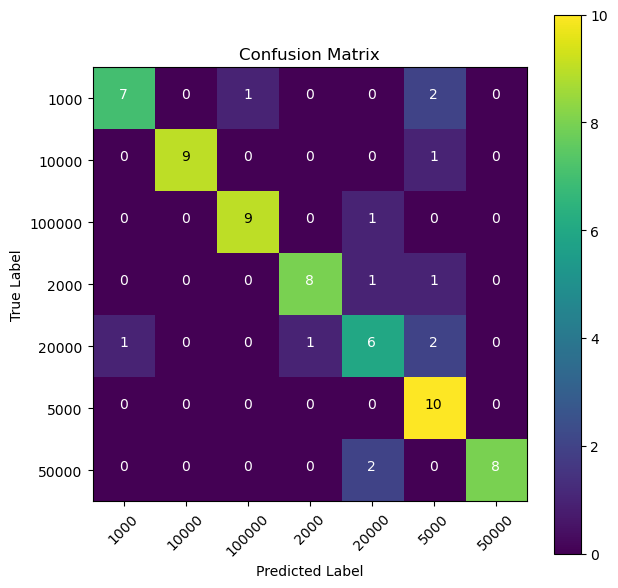

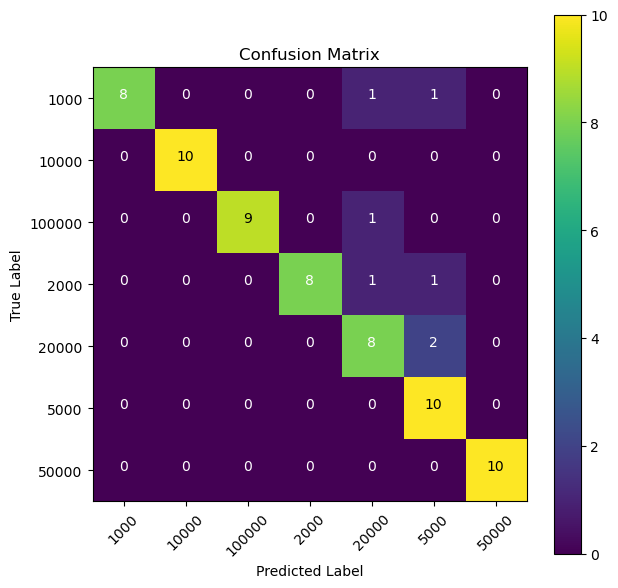

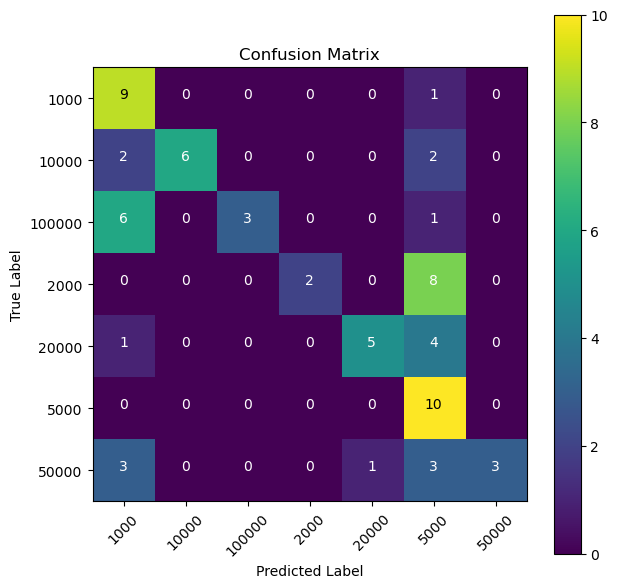

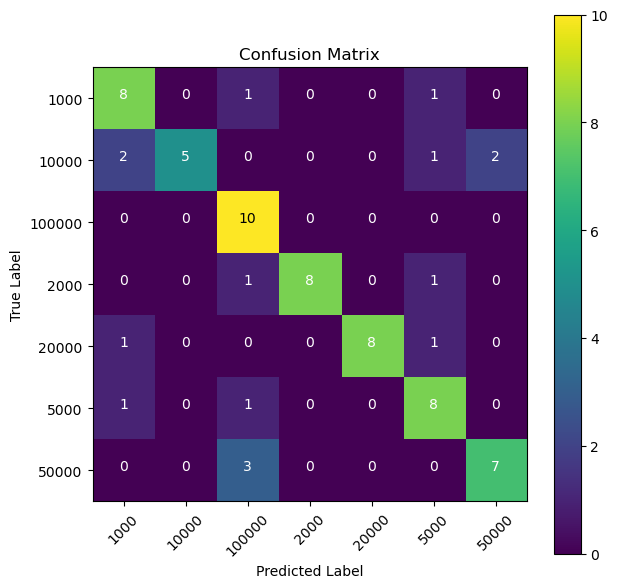

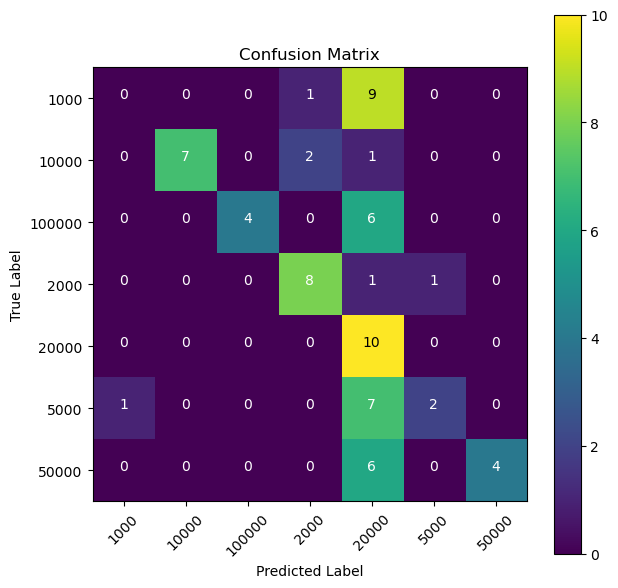

...

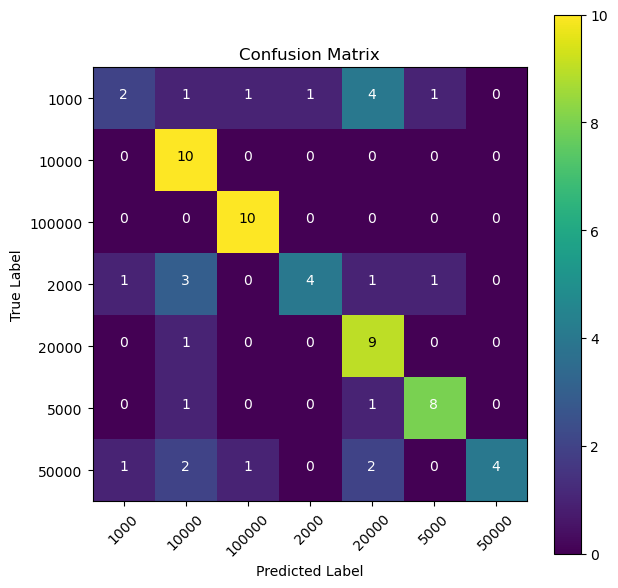

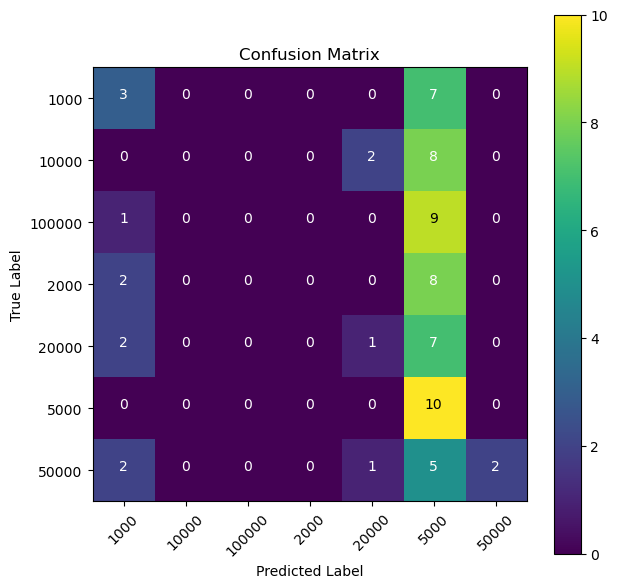

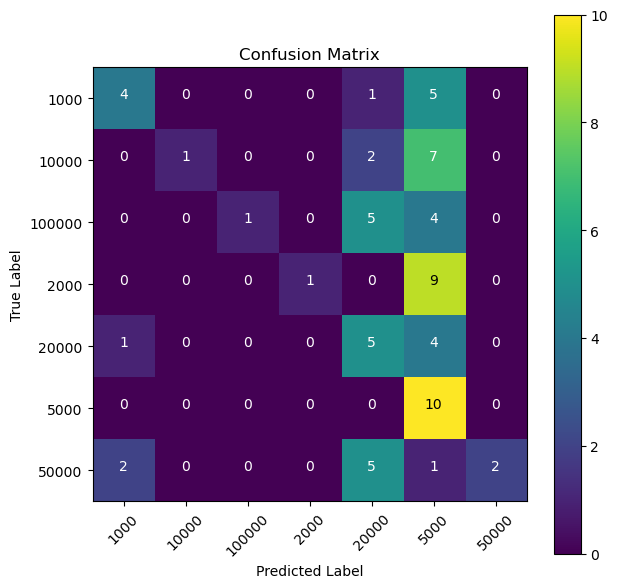

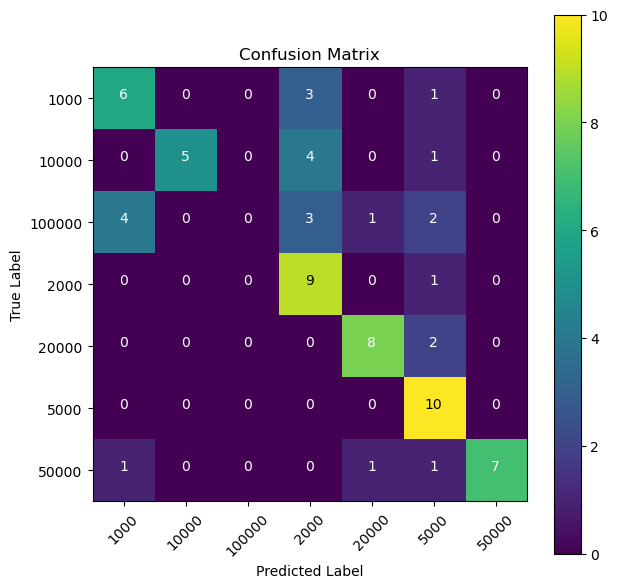

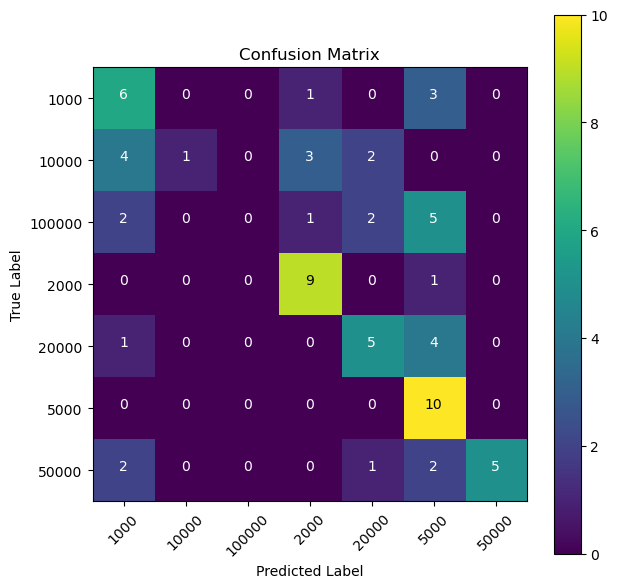

In [28]:
j = 153
for i in range (j,len(parameter)):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = (parameter[i][0])
  learning_rate = (parameter[i][1])
  batch_size = (parameter[i][2])
  dropout_rate = (parameter[i][3])
  i=i+1
  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (j+1)
  hasilTabel.to_excel("hasilTabel.xlsx")
  print("".center(100,"─"))

In [29]:
print(parameter[-1])

[65, 0.07785621304298336, 128, 0.762213939250978]


In [ ]:
print(arr_accuracy16)

In [ ]:
print(parameter)

[[32, 0.007219832940644841, 32, 0.5082452734224067], [31, 0.004075029788679724, 32, 0.6016725500404784], [33, 0.00315947301771729, 32, 0.7184751261047725], [31, 0.003894889598987779, 32, 0.7989889491335428], [37, 0.003330119062043423, 64, 0.5386103542998264], [33, 0.001035575624017891, 64, 0.6274768182080823], [31, 0.008476757003058194, 64, 0.6638456845574445], [36, 0.010331433279406875, 64, 0.7638696117252645], [35, 0.024958614023946755, 128, 0.5169157363443028], [32, 0.01865697901703164, 128, 0.6392273477064419], [34, 0.008800728540260748, 128, 0.6894310285748557], [34, 0.018401196584940504, 128, 0.7743307685620252], [34, 0.04567969225132304, 32, 0.5585427185336642], [35, 0.025944559674879956, 32, 0.6039696818879788], [33, 0.03181435071503331, 32, 0.718027935296233], [31, 0.04812912997674717, 32, 0.7374925918890184], [37, 0.04787628979030879, 64, 0.5504032350389431], [36, 0.04705047633351364, 64, 0.6118765319258614], [36, 0.028306224343345572, 64, 0.7112615752375017], [33, 0.03471771

In [37]:
print(arr_accuracy16)

[0.14285714285714285, 0.14285714285714285, 0.14285714285714285, 0.18571428571428572, 0.14285714285714285, 0.7285714285714285, 0.37142857142857144, 0.7857142857142857, 0.6, 0.24285714285714285]


In [53]:
# KALAU MAU INPUT MANUAL PAKAI INI AJA, PARAMETERNYA DISAMAKAN SAMA NGERUN BERAPA SAMPAI BERAPA
df = pd.DataFrame(parameter[20:30], columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate'])
df = df.rename_axis('Percobaan').rename(lambda x: x+21)
print(df)

           Epoch  Learning Rate  Batch Size  Dropout Rate
Percobaan                                                
21            38       0.047001         128      0.536721
22            33       0.025487         128      0.641397
23            30       0.025715         128      0.676696
24            35       0.042781         128      0.795595
25            37       0.068997          32      0.508742
26            30       0.053899          32      0.621849
27            37       0.066381          32      0.651471
28            38       0.060987          32      0.733100
29            37       0.073304          64      0.562163
30            36       0.070758          64      0.646642


In [38]:
import pandas as pd
def hasilTabel(parameter,arr_accuracy):
  df = pd.DataFrame(parameter, columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate'])
  df = df.rename_axis('Percobaan').rename(lambda x: x+15)
  df["Accuracy"] = arr_accuracy
  return(df)

In [39]:
#print tabel hyperparameter
hasilTabel(parameter[15:20],arr_accuracy16).to_excel("hasilTabel.xlsx")

ValueError: Length of values (10) does not match length of index (5)

In [25]:
result = pd.read_excel("hasilTabel.xlsx")
print(result)

    Unnamed: 0  Epoch  Learning Rate  Batch Size  Dropout Rate  Accuracy
0          142     50       0.099686         128      0.658473  0.328571
1          143     51       0.088771         128      0.731987  0.328571
2          144     58       0.002879          32      0.521367  0.328571
3          145     63       0.002792          32      0.578760  0.328571
4          146     58       0.010246          32      0.655486  0.328571
5          147     57       0.019108          32      0.796571  0.328571
6          148     63       0.016507          64      0.570675  0.328571
7          149     61       0.012543          64      0.620561  0.328571
8          150     59       0.008534          64      0.671026  0.328571
9          151     57       0.000319          64      0.733527  0.328571
10         152     57       0.020875         128      0.561965  0.328571
11         153     64       0.004832         128      0.638459  0.328571


In [ ]:
""
for i in range (j):
    result.insert_rows(j)
    sheet.cell(row=2, column=1).value = 'Data1'
    sheet.cell(row=2, column=2).value = 'Data2'
    ""

#### **<font color='Pink'>Testing</font>**

1/1 [==============================] - 0s 237ms/step


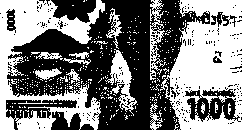

Prediksi: 100000 | Probabilitas: 0.29568768


In [ ]:
from tensorflow.keras.models import load_model

path = "datasetPreprocessing/1000/1k_b_2016_1.png"
img = cv2.resize(cv2.imread(path),(242,130))
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
x = imageEnhancement(img)
x = imageSegmentation(x)
z = PIL.Image.fromarray(x)
z.save("citraUji.png")

img = cv2.imread("citraUji.png")
img_normalized = img/255

model = load_model("percobaan1/vgg16-model1.h5")

PIL.Image.fromarray(x)
vgg16_image_prediction = np.argmax(model.predict(np.array([img_normalized])))
prob = np.amax(model.predict(np.array([img_normalized])))
cv2_imshow(img)
print("Prediksi:",inv_map_classes[vgg16_image_prediction],"| Probabilitas:",prob)

#### **<font color='Pink'>Revisi</font>**

In [54]:
import splitfolders
for i in range(0,5):
    seed = random.randint(0,1500)
    print(seed)
    i=i+1
    splitfolders.ratio("datasetPreprocessing", output="datasetSplit"+str(i), seed=seed, ratio=(0.7, 0.2, 0.1)) #70% : 10% : 20%

946


Copying files: 700 files [00:01, 401.04 files/s]


521


Copying files: 700 files [00:01, 505.39 files/s]


811


Copying files: 700 files [00:01, 506.91 files/s]


358


Copying files: 700 files [00:01, 506.68 files/s]


333


Copying files: 700 files [00:01, 577.50 files/s]


In [53]:
dataset="datasetPreprocessing"

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 1 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.4325 - acc: 0.3122
Epoch 1: val_acc improved from -inf to 0.20714, saving model to percobaan1/model\vgg_16_1-saved-model-01-acc-0.21.hdf5
16/16 [==============================] - 95s 6s/step - loss: 2.4325 - acc: 0.3122 - val_loss: 2.0857 - val_acc: 0.2071
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.2369 - acc: 0.5776
Epoch 2: val_acc improved from 0.20714 to 0.25000, saving model to percobaan1/model\vgg_16_1-saved-model-02-acc-0.25.hdf5
16/16 [=

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1344868466.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 2 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.6121 - acc: 0.2735
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan2/model\vgg_16_2-saved-model-01-acc-0.25.hdf5
16/16 [==============================] - 85s 5s/step - loss: 2.6121 - acc: 0.2735 - val_loss: 2.1640 - val_acc: 0.2500
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3371 - acc: 0.5286
Epoch 2: val_acc improved fro

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1344868466.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 3 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.4345 - acc: 0.2837
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan3/model\vgg_16_3-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 95s 5s/step - loss: 2.4345 - acc: 0.2837 - val_loss: 3.3258 - val_acc: 0.1429
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3978 - acc: 0.5327
Epoch 2: val_acc improved from 0.14286 to 0.25714, saving model to percobaan3/model\vgg_16_3-saved-model-02-acc-0.26.hdf5
16/16 [=

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1344868466.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 4 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.3337 - acc: 0.3224
Epoch 1: val_acc improved from -inf to 0.25000, saving model to percobaan4/model\vgg_16_4-saved-model-01-acc-0.25.hdf5
16/16 [==============================] - 82s 5s/step - loss: 2.3337 - acc: 0.3224 - val_loss: 1.7720 - val_acc: 0.2500
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.2453 - acc: 0.5857
Epoch 2: val_acc improved from 0.25000 to 0.40714, saving model to percobaan4/model\vgg_16_4-saved-model-02-acc-0.41.hdf5
16/16 [=

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1344868466.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 5 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5233 - acc: 0.2776
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan5/model\vgg_16_5-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 104s 6s/step - loss: 2.5233 - acc: 0.2776 - val_loss: 2.3911 - val_acc: 0.2357
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.2447 - acc: 0.5837
Epoch 2: val_acc improved from 0.23571 to 0.43571, saving model to percobaan5/model\vgg_16_5-saved-model-02-acc-0.44.hdf5
16/16 [

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1344868466.py:45: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


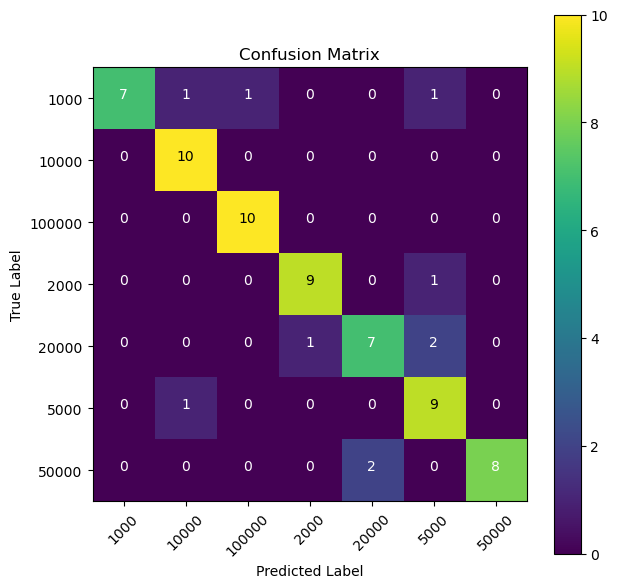

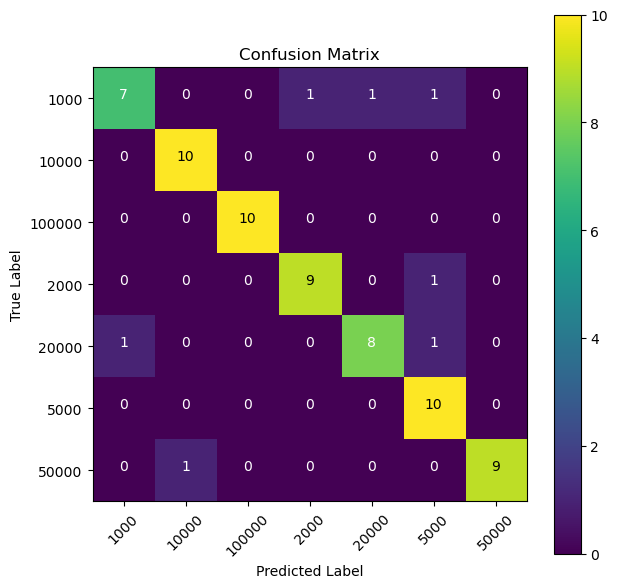

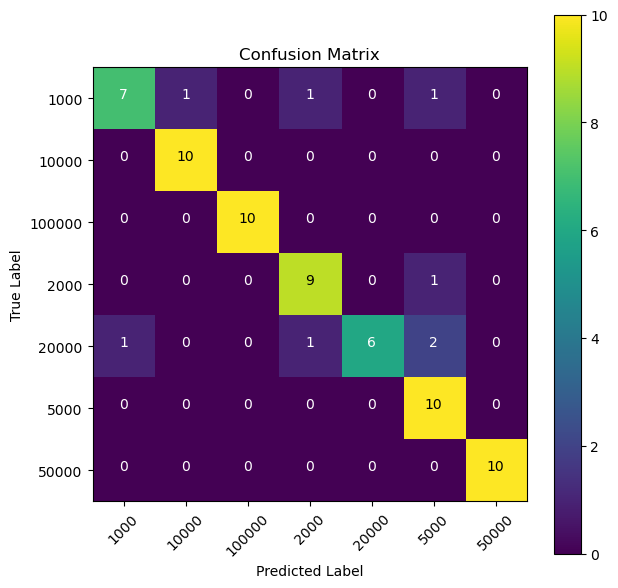

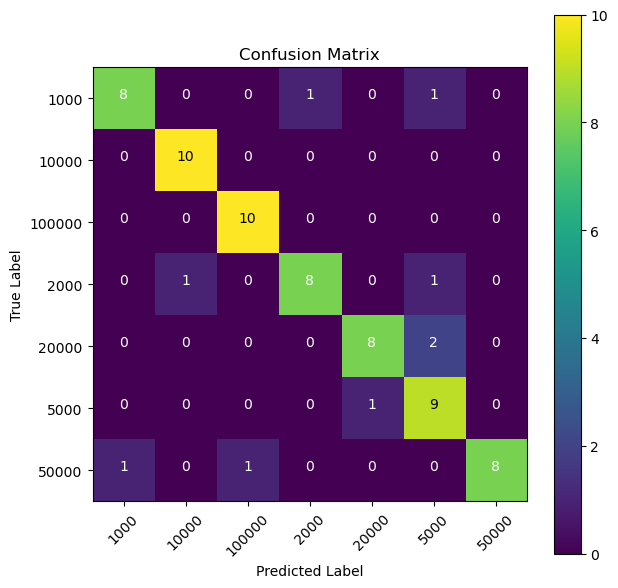

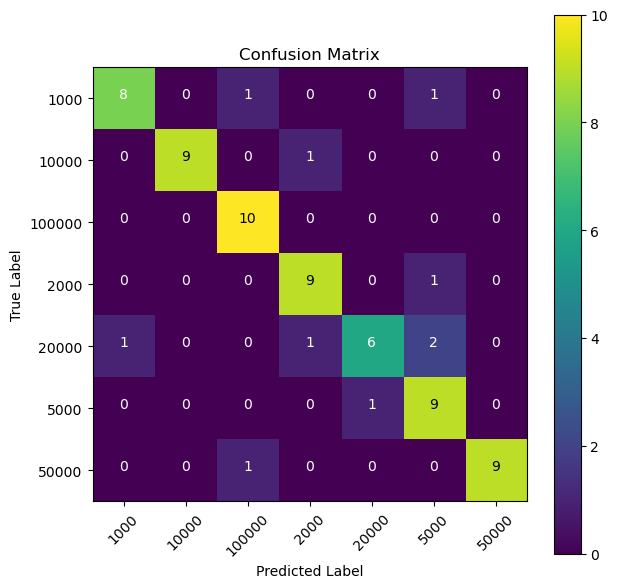

In [56]:
for i in range (0,5):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = 30
  learning_rate = 0.00537830282104717
  batch_size = 32
  dropout_rate = 0.59137035157577
  i=i+1
  dataset = "datasetSplit"+str(i)
  IMAGE_SIZE = (130, 242, 3)
  dataset="datasetSplit"
  train_pred_test_folders = os.listdir(dataset)
  train_path = dataset+'/train'
  test_path = dataset+'/test'
  val_path = dataset+'/val'

  #normalisasi
  train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  train_generator16 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

  validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

  test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  test_generator16 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
      batch_size=1,
      shuffle=True,
      class_mode='categorical')

  validation_generator16 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER VGG-16".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("random seed:",seed)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (i+1)
  hasilTabel.to_excel("hasilTabelRevisi.xlsx")
  print("".center(100,"─"))

Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 1 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5468 - acc: 0.2980
Epoch 1: val_acc improved from -inf to 0.16429, saving model to percobaan1/model\vgg_16_1-saved-model-01-acc-0.16.hdf5
16/16 [==============================] - 167s 10s/step - loss: 2.5468 - acc: 0.2980 - val_loss: 2.3608 - val_acc: 0.1643
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3768 - acc: 0.5286
Epoch 2: val_acc improved from 0.16429 to 0.30000, saving model to percobaan1/model\vgg_16_1-saved-model-02-acc-0.30.hdf5
16/16 

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1631425508.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 2 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5218 - acc: 0.2755
Epoch 1: val_acc improved from -inf to 0.24286, saving model to percobaan2/model\vgg_16_2-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 169s 9s/step - loss: 2.5218 - acc: 0.2755 - val_loss: 1.9242 - val_acc: 0.2429
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.2533 - acc: 0.5898
Epoch 2: val_acc improved fr

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1631425508.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 3 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.2889 - acc: 0.3490
Epoch 1: val_acc improved from -inf to 0.14286, saving model to percobaan3/model\vgg_16_3-saved-model-01-acc-0.14.hdf5
16/16 [==============================] - 199s 11s/step - loss: 2.2889 - acc: 0.3490 - val_loss: 2.4765 - val_acc: 0.1429
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3636 - acc: 0.5204
Epoch 2: val_acc improved f

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1631425508.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 4 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5033 - acc: 0.2735
Epoch 1: val_acc improved from -inf to 0.25714, saving model to percobaan4/model\vgg_16_4-saved-model-01-acc-0.26.hdf5
16/16 [==============================] - 203s 12s/step - loss: 2.5033 - acc: 0.2735 - val_loss: 2.0541 - val_acc: 0.2571
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3373 - acc: 0.5490
Epoch 2: val_acc improved f

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1631425508.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 5 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
random seed: 333
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.4395 - acc: 0.2837
Epoch 1: val_acc improved from -inf to 0.18571, saving model to percobaan5/model\vgg_16_5-saved-model-01-acc-0.19.hdf5
16/16 [==============================] - 206s 12s/step - loss: 2.4395 - acc: 0.2837 - val_loss: 2.7217 - val_acc: 0.1857
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.4052 - acc: 0.5265
Epoch 2: val_acc improved f

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\1631425508.py:44: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


────────────────────────────────────────────────────────────────────────────────────────────────────


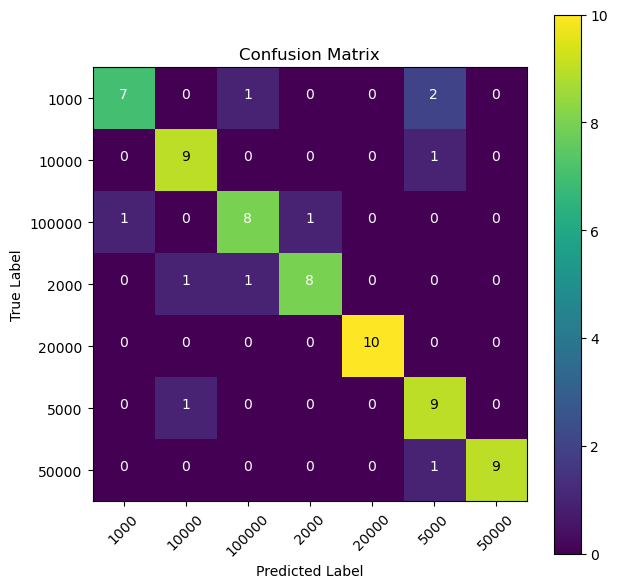

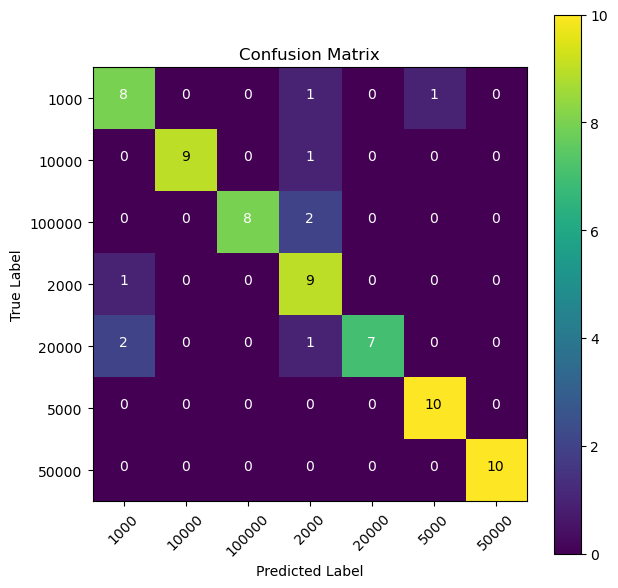

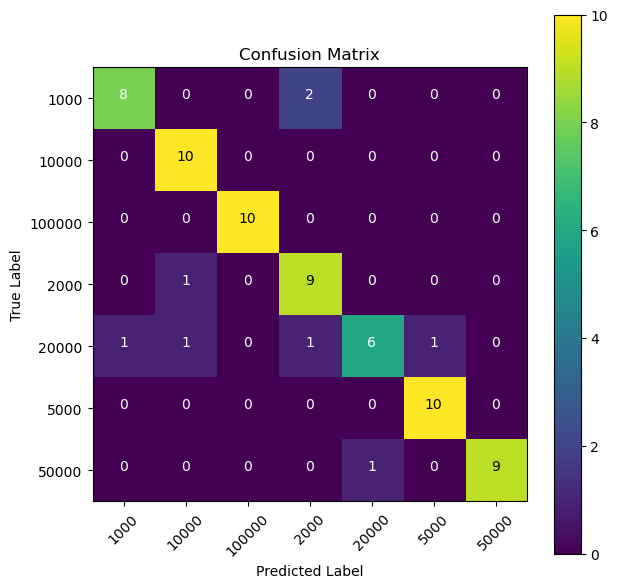

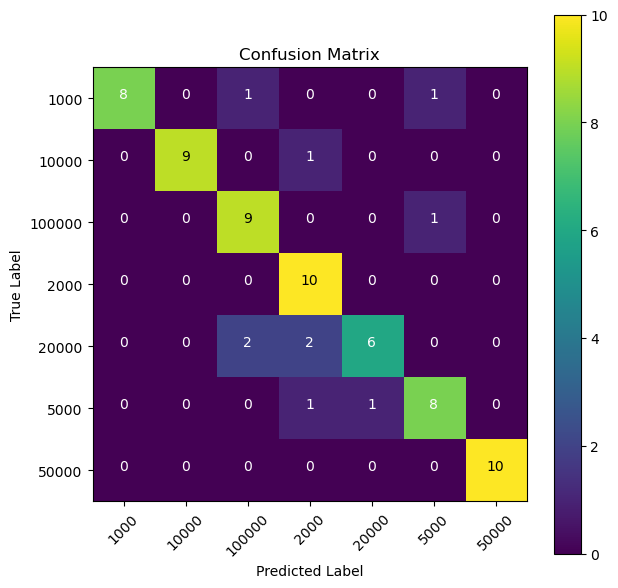

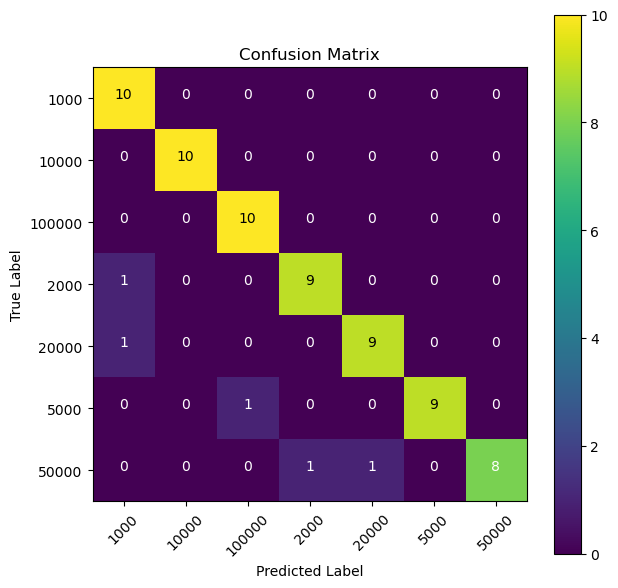

In [57]:
for i in range (0,5):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = 30
  learning_rate = 0.00537830282104717
  batch_size = 32
  dropout_rate = 0.59137035157577
  i=i+1
  dataset = "datasetSplit"+str(i)
  IMAGE_SIZE = (130, 242, 3)
  train_pred_test_folders = os.listdir(dataset)
  train_path = dataset+'/train'
  test_path = dataset+'/test'
  val_path = dataset+'/val'

  #normalisasi
  train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  train_generator16 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

  validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

  test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  test_generator16 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
      batch_size=1,
      shuffle=True,
      class_mode='categorical')

  validation_generator16 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER VGG-16".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("random seed:",seed)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (i+1)
  hasilTabel.to_excel("hasilTabelRevisi.xlsx")
  print("".center(100,"─"))

In [58]:
import splitfolders
for i in range(5,10):
    seed = random.randint(0,1500)
    print(seed)
    i=i+1
    splitfolders.ratio("datasetPreprocessing", output="datasetSplit"+str(i), seed=seed, ratio=(0.7, 0.2, 0.1)) #70% : 10% : 20%

1471


Copying files: 700 files [00:07, 93.15 files/s] 


25


Copying files: 700 files [00:01, 504.44 files/s]


955


Copying files: 700 files [00:01, 481.79 files/s]


1492


Copying files: 700 files [00:01, 467.73 files/s]


467


Copying files: 700 files [00:01, 482.13 files/s]


Empty DataFrame
Columns: [Epoch, Learning Rate, Batch Size, Dropout Rate, Accuracy]
Index: []
Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 6 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5410 - acc: 0.3143
Epoch 1: val_acc improved from -inf to 0.27857, saving model to percobaan6/model\vgg_16_6-saved-model-01-acc-0.28.hdf5
16/16 [==============================] - 43s 2s/step - loss: 2.5410 - acc: 0.3143 - val_loss: 1.8489 - val_acc: 0.2786
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.2990 - acc: 0.5531
Epoch 2: val_acc improved from 0.27857 to 0.33571, sa

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\3990041531.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Percobaan ke- 7 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5555 - acc: 0.2857
Epoch 1: val_acc improved from -inf to 0.28571, saving model to percobaan7/model\vgg_16_7-saved-model-01-acc-0.29.hdf5
16/16 [==============================] - 55s 3s/step - loss: 2.5555 - acc: 0.2857 - val_loss: 1.8236 - val_acc: 0.2857
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.4767 - acc: 0.5082
Epoch 2: val_acc improved from 0.28571 to 0.56429, saving model to percobaan7/model\vgg_16_7-saved-model-02-acc-0.56.hdf5
16/16 [==============================] - 51s 3s/step - loss: 1.4767 - acc: 0.5082 - val_loss: 1.2681 - val_acc: 0.5643
Epoch 3/30
16/16 [==========

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\3990041531.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 140 images belonging to 7 classes.
Percobaan ke- 8 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.3146 - acc: 0.3408
Epoch 1: val_acc improved from -inf to 0.31429, saving model to percobaan8/model\vgg_16_8-saved-model-01-acc-0.31.hdf5
16/16 [==============================] - 59s 4s/step - loss: 2.3146 - acc: 0.3408 - val_loss: 2.0487 - val_acc: 0.3143
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3373 - acc: 0.5429
Epoch 2: val_acc improved from 0.31429 to 0.38571, saving model to percobaan8/model\vgg_16_8-saved-model-02-acc-0.39.hdf5
16/16 [==============================] - 61s 4s/step - loss: 1.3373 - acc: 0.5429 - val_loss: 1.6014 - val

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\3990041531.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Found 490 images belonging to 7 classes.
Found 70 images belonging to 7 classes.
Found 140 images belonging to 7 classes.
Percobaan ke- 9 ↓
───────────────────────────────────────HYPERPARAMETER VGG-16────────────────────────────────────────
vgg epoch: 30
learning rate: 0.00537830282104717
batch size: 32
dropout rate: 0.59137035157577
────────────────────────────────────────────────────────────────────────────────────────────────────
Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.5730 - acc: 0.2837
Epoch 1: val_acc improved from -inf to 0.23571, saving model to percobaan9/model\vgg_16_9-saved-model-01-acc-0.24.hdf5
16/16 [==============================] - 53s 3s/step - loss: 2.5730 - acc: 0.2837 - val_loss: 2.7922 - val_acc: 0.2357
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.4561 - acc: 0.5163
Epoch 2: val_acc improved from 0.23571 to 0.25000, saving model to percobaan9/model\vgg_16_9-saved-model-02-acc-0.25.hdf5
16/16 [==================

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\3990041531.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


Epoch 1/30
16/16 [==============================] - ETA: 0s - loss: 2.4168 - acc: 0.2898
Epoch 1: val_acc improved from -inf to 0.36429, saving model to percobaan10/model\vgg_16_10-saved-model-01-acc-0.36.hdf5
16/16 [==============================] - 50s 3s/step - loss: 2.4168 - acc: 0.2898 - val_loss: 1.7418 - val_acc: 0.3643
Epoch 2/30
16/16 [==============================] - ETA: 0s - loss: 1.3897 - acc: 0.5102
Epoch 2: val_acc improved from 0.36429 to 0.58571, saving model to percobaan10/model\vgg_16_10-saved-model-02-acc-0.59.hdf5
16/16 [==============================] - 53s 3s/step - loss: 1.3897 - acc: 0.5102 - val_loss: 1.4420 - val_acc: 0.5857
Epoch 3/30
16/16 [==============================] - ETA: 0s - loss: 0.9956 - acc: 0.6571
Epoch 3: val_acc did not improve from 0.58571
16/16 [==============================] - 47s 3s/step - loss: 0.9956 - acc: 0.6571 - val_loss: 1.3819 - val_acc: 0.5143
Epoch 4/30
16/16 [==============================] - ETA: 0s - loss: 0.8628 - acc: 0.7

C:\Users\ardin\AppData\Local\Temp\ipykernel_18824\3990041531.py:46: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)


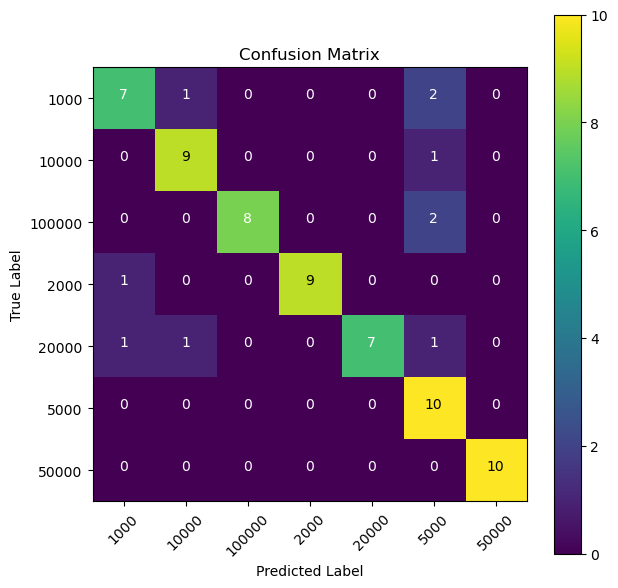

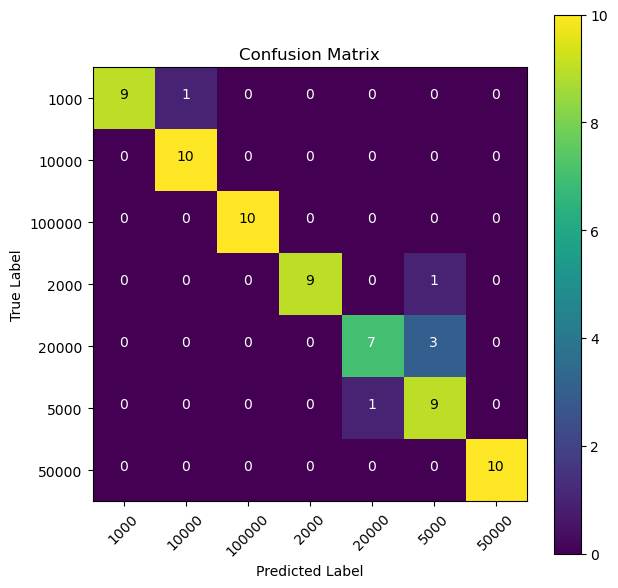

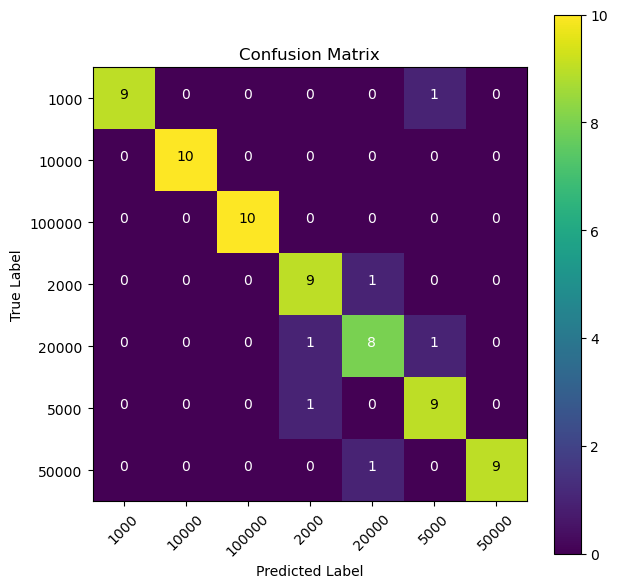

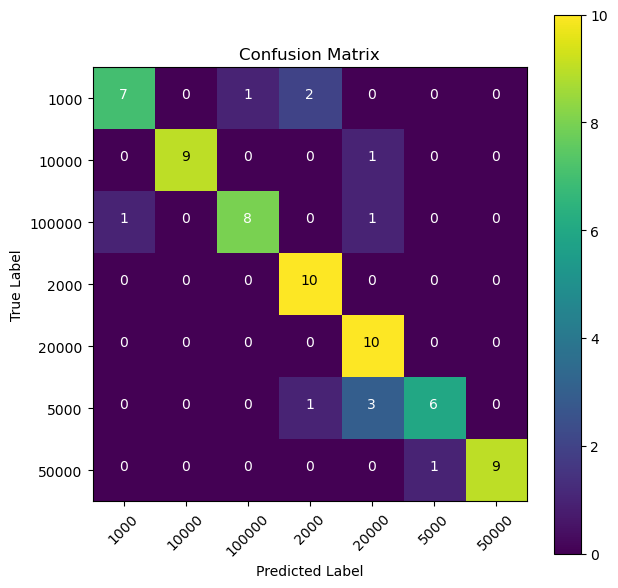

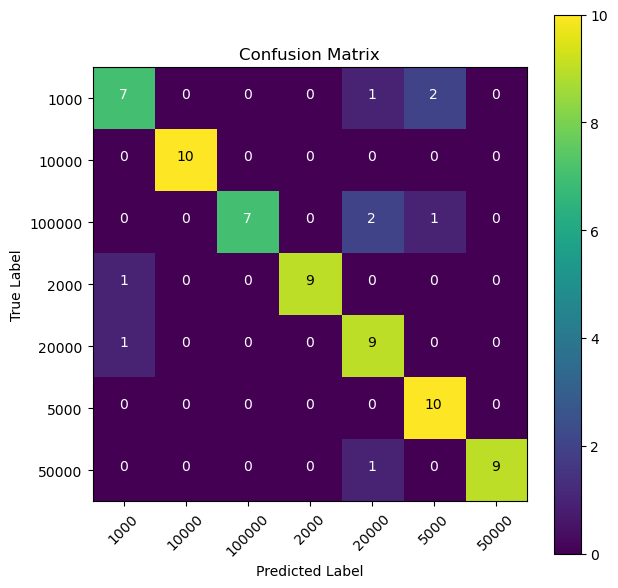

In [60]:
hasilTabel = pd.DataFrame(columns=['Epoch', 'Learning Rate', 'Batch Size', 'Dropout Rate','Accuracy'])
print(hasilTabel)

for i in range (5,10):
#for i in range (0,10): #aslinya in range len(parameter) tapi kalau mau coba per sedikit2 ya gini deh
  vgg_epoch = 30
  learning_rate = 0.00537830282104717
  batch_size = 32
  dropout_rate = 0.59137035157577
  i=i+1
  dataset = "datasetSplit"+str(i)
  IMAGE_SIZE = (130, 242, 3)
  train_pred_test_folders = os.listdir(dataset)
  train_path = dataset+'/train'
  test_path = dataset+'/test'
  val_path = dataset+'/val'

  #normalisasi
  train_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  train_generator16 = train_datagen.flow_from_directory(train_path,
                                                    batch_size=32,
                                                    shuffle=True,
                                                    class_mode='categorical',
                                                    target_size=(130, 242))

  validation_datagen = ImageDataGenerator(rescale = 1.0/255.)

  test_datagen = ImageDataGenerator(rescale = 1.0/255.,shear_range=0.2,zoom_range=0.2)
  test_generator16 = test_datagen.flow_from_directory(test_path, target_size=(130, 242),
      batch_size=1,
      shuffle=True,
      class_mode='categorical')

  validation_generator16 = validation_datagen.flow_from_directory(val_path, shuffle=True, batch_size=1, class_mode='categorical', target_size=(130, 242))

  savePercobaan(i)
  print("Percobaan ke-",i,"↓")
  print("HYPERPARAMETER VGG-16".center(100,"─"))
  print("vgg epoch:",vgg_epoch)
  print("learning rate:",learning_rate)
  print("batch size:",batch_size)
  print("dropout rate:",dropout_rate)
  print("".center(100,"─"))
  vgg16_training(i, vgg_epoch, learning_rate, batch_size, dropout_rate)
  new_row = {'Epoch': vgg_epoch, 'Learning Rate': learning_rate, 'Batch Size': batch_size, 'Dropout Rate': dropout_rate, 'Accuracy': arr_accuracy16[-1]}
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
  hasilTabel.index = hasilTabel.index + (i+1)
  hasilTabel.to_excel("hasilTabelRevisi6-10.xlsx")
  print("".center(100,"─"))

#### **<font color='Pink'>Revisi Pt 2</font>**

In [24]:
import splitfolders
listSeed = [946, 521, 811, 358, 333, 1471, 25, 955, 1492, 467]
for i in range(10,50):
    seed = random.randint(0,1500)
    print(seed)
    if seed not in listSeed:
        listSeed.append(seed)
        i=i+1
        splitfolders.ratio("datasetPreprocessing", output="datasetSplit"+str(i), seed=seed, ratio=(0.7, 0.2, 0.1)) #70% : 10% : 20%

300


Copying files: 700 files [00:05, 133.39 files/s]


1221


Copying files: 700 files [00:01, 694.65 files/s]


495


Copying files: 700 files [00:01, 593.79 files/s]


782


Copying files: 700 files [00:00, 721.51 files/s]


305


Copying files: 700 files [00:01, 620.40 files/s]


302


Copying files: 700 files [00:00, 756.64 files/s]


639


Copying files: 700 files [00:01, 640.01 files/s]


740


Copying files: 700 files [00:01, 654.64 files/s]


110


Copying files: 700 files [00:01, 683.71 files/s]


125


Copying files: 700 files [00:01, 620.19 files/s]


488


Copying files: 700 files [00:01, 662.78 files/s]


728


Copying files: 700 files [00:01, 572.26 files/s]


1444


Copying files: 700 files [00:01, 616.23 files/s]


872


Copying files: 700 files [00:01, 650.25 files/s]


819


Copying files: 700 files [00:01, 616.01 files/s]


346


Copying files: 700 files [00:01, 662.72 files/s]


1315


Copying files: 700 files [00:01, 608.22 files/s]


855


Copying files: 700 files [00:01, 607.43 files/s]


382


Copying files: 700 files [00:01, 696.40 files/s]


1159


Copying files: 700 files [00:01, 639.86 files/s]


1281


Copying files: 700 files [00:01, 688.69 files/s]


537


Copying files: 700 files [00:01, 689.59 files/s]


1354


Copying files: 700 files [00:01, 647.37 files/s]


108


Copying files: 700 files [00:01, 672.03 files/s]


377


Copying files: 700 files [00:01, 545.29 files/s]


226


Copying files: 700 files [00:01, 593.70 files/s]


170


Copying files: 700 files [00:01, 589.10 files/s]


196


Copying files: 700 files [00:01, 641.72 files/s]


1254


Copying files: 700 files [00:01, 553.28 files/s]


951


Copying files: 700 files [00:01, 579.46 files/s]


932


Copying files: 700 files [00:01, 587.87 files/s]


737


Copying files: 700 files [00:01, 567.51 files/s]


373


Copying files: 700 files [00:01, 534.67 files/s]


1330


Copying files: 700 files [00:01, 541.99 files/s]


562


Copying files: 700 files [00:01, 574.62 files/s]


8


Copying files: 700 files [00:01, 570.66 files/s]


546


Copying files: 700 files [00:01, 592.41 files/s]


1111


Copying files: 700 files [00:01, 582.69 files/s]


1037


Copying files: 700 files [00:01, 617.24 files/s]


10


Copying files: 700 files [00:01, 691.13 files/s]


In [25]:
print(listSeed)

[946, 521, 811, 358, 333, 1471, 25, 955, 1492, 467, 300, 1221, 495, 782, 305, 302, 639, 740, 110, 125, 488, 728, 1444, 872, 819, 346, 1315, 855, 382, 1159, 1281, 537, 1354, 108, 377, 226, 170, 196, 1254, 951, 932, 737, 373, 1330, 562, 8, 546, 1111, 1037, 10]


In [64]:
import splitfolders
listSeed = [946, 521, 811, 358, 333, 1471, 25, 955, 1492, 467, 300, 1221, 495, 782, 305, 302, 639, 740, 110, 125, 488, 728, 1444, 872, 819, 346, 1315, 855, 382, 1159, 1281, 537, 1354, 108, 377, 226, 170, 196, 1254, 951, 932, 737, 373, 1330, 562, 8, 546, 1111, 1037, 10]
for i in range(50,100):
    seed = random.randint(0,1500)
    print(seed)
    if seed not in listSeed:
        listSeed.append(seed)
        i=i+1
        splitfolders.ratio("datasetPreprocessing", output="datasetSplit"+str(i), seed=seed, ratio=(0.7, 0.1, 0.2)) #70% : 20% : 10%
    elif seed in listSeed:
        seed = random.randint(0,1500)
        if seed not in listSeed:
            listSeed.append(seed)
            i=i+1
            splitfolders.ratio("datasetPreprocessing", output="datasetSplit"+str(i), seed=seed, ratio=(0.7, 0.1, 0.2)) #70% : 20% : 10%

1439


Copying files: 700 files [00:01, 546.66 files/s]


276


Copying files: 700 files [00:01, 624.39 files/s]


644


Copying files: 700 files [00:01, 548.27 files/s]


320


Copying files: 700 files [00:01, 559.02 files/s]


786


Copying files: 700 files [00:01, 606.97 files/s]


705


Copying files: 700 files [00:01, 576.28 files/s]


758


Copying files: 700 files [00:01, 628.74 files/s]


461


Copying files: 700 files [00:01, 627.54 files/s]


948


Copying files: 700 files [00:01, 617.54 files/s]


211


Copying files: 700 files [00:01, 659.82 files/s]


253


Copying files: 700 files [00:01, 605.97 files/s]


1446


Copying files: 700 files [00:00, 734.30 files/s]


520


Copying files: 700 files [00:01, 658.70 files/s]


337


Copying files: 700 files [00:01, 553.04 files/s]


383


Copying files: 700 files [00:01, 611.63 files/s]


457


Copying files: 700 files [00:01, 569.43 files/s]


231


Copying files: 700 files [00:01, 517.10 files/s]


1201


Copying files: 700 files [00:03, 198.75 files/s]


986


Copying files: 700 files [00:04, 160.82 files/s]


122


Copying files: 700 files [00:01, 585.97 files/s]


221


Copying files: 700 files [00:01, 581.19 files/s]


242


Copying files: 700 files [00:01, 637.16 files/s]


1395


Copying files: 700 files [00:01, 584.45 files/s]


452


Copying files: 700 files [00:01, 576.09 files/s]


304


Copying files: 700 files [00:01, 596.30 files/s]


1176


Copying files: 700 files [00:01, 592.21 files/s]


910


Copying files: 700 files [00:06, 102.62 files/s]


1239


Copying files: 700 files [00:00, 741.26 files/s]


647


Copying files: 700 files [00:00, 725.47 files/s]


304


Copying files: 700 files [00:01, 682.55 files/s]


389


Copying files: 700 files [00:00, 718.67 files/s]


1011


Copying files: 700 files [00:00, 737.82 files/s]


1477


Copying files: 700 files [00:01, 694.32 files/s]


693


Copying files: 700 files [00:00, 757.27 files/s]


432


Copying files: 700 files [00:01, 696.04 files/s]


1007


Copying files: 700 files [00:00, 721.71 files/s]


1196


Copying files: 700 files [00:05, 117.35 files/s]


799


Copying files: 700 files [00:01, 614.98 files/s]


366


Copying files: 700 files [00:00, 734.41 files/s]


229


Copying files: 700 files [00:01, 645.35 files/s]


109


Copying files: 700 files [00:00, 780.83 files/s]


707


Copying files: 700 files [00:00, 760.73 files/s]


733


Copying files: 700 files [00:00, 745.00 files/s]


977


Copying files: 700 files [00:00, 757.54 files/s]


593


Copying files: 700 files [00:00, 758.73 files/s]


241


Copying files: 700 files [00:00, 753.13 files/s]


114


Copying files: 700 files [00:01, 468.56 files/s]


540


Copying files: 700 files [00:05, 125.24 files/s]


515


Copying files: 700 files [00:00, 758.31 files/s]


172


Copying files: 700 files [00:00, 779.00 files/s]


In [66]:
print(listSeed)
print(len(listSeed))

[946, 521, 811, 358, 333, 1471, 25, 955, 1492, 467, 300, 1221, 495, 782, 305, 302, 639, 740, 110, 125, 488, 728, 1444, 872, 819, 346, 1315, 855, 382, 1159, 1281, 537, 1354, 108, 377, 226, 170, 196, 1254, 951, 932, 737, 373, 1330, 562, 8, 546, 1111, 1037, 10, 1439, 276, 644, 320, 786, 705, 758, 461, 948, 211, 253, 1446, 520, 337, 383, 457, 231, 1201, 986, 122, 221, 242, 1395, 452, 304, 1176, 910, 1239, 647, 421, 389, 1011, 1477, 693, 432, 1007, 1196, 799, 366, 229, 109, 707, 733, 977, 593, 241, 114, 540, 515, 172]
100


In [68]:
import numpy as np

In [29]:
skorAkhir16 = [97.14285714285714, 100.0, 98.57142857142858, 97.14285714285714, 100.0, 94.28571428571428, 95.71428571428572, 97.14285714285714, 98.57142857142858, 97.14285714285714, 98.57142857142858, 98.57142857142858, 97.14285714285714, 95.71428571428572, 94.28571428571428, 97.14285714285714, 95.71428571428572, 97.14285714285714, 98.57142857142858, 95.71428571428572, 95.71428571428572, 98.57142857142858, 95.71428571428572, 94.28571428571428, 98.57142857142858, 97.14285714285714, 97.14285714285714, 98.57142857142858, 95.71428571428572, 98.57142857142858, 91.42857142857143, 95.71428571428572, 97.14285714285714, 98.57142857142858, 100.0, 97.14285714285714, 97.14285714285714, 97.14285714285714, 94.28571428571428, 98.57142857142858, 98.57142857142858, 98.57142857142858, 97.14285714285714, 98.57142857142858, 95.71428571428572, 95.71428571428572, 95.71428571428572, 97.14285714285714, 100.0, 94.28571428571428]
skorAkhir19 = [90.0, 95.71428571428572, 90.0, 95.71428571428572, 94.28571428571428, 91.42857142857143, 88.57142857142857, 97.14285714285714, 88.57142857142857, 95.71428571428572, 91.42857142857143, 91.42857142857143, 90.0, 95.71428571428572, 80.0, 94.28571428571428, 95.71428571428572, 87.14285714285714, 97.14285714285714, 92.85714285714286, 95.71428571428572, 95.71428571428572, 82.85714285714286, 91.42857142857143, 94.28571428571428, 95.71428571428572, 91.42857142857143, 97.14285714285714, 94.28571428571428, 94.28571428571428, 87.14285714285714, 94.28571428571428, 95.71428571428572, 95.71428571428572, 97.14285714285714, 88.57142857142857, 95.71428571428572, 98.57142857142858, 92.85714285714286, 88.57142857142857, 98.57142857142858, 91.42857142857143, 91.42857142857143, 95.71428571428572, 92.85714285714286, 97.14285714285714, 91.42857142857143, 94.28571428571428, 97.14285714285714, 81.42857142857143]
skorAkhir16_no = [97.14285714285714, 95.71428571428572, 90.0, 100.0, 98.57142857142858, 91.42857142857143, 95.71428571428572, 100.0, 92.85714285714286, 97.14285714285714, 91.42857142857143, 97.14285714285714, 98.57142857142858, 100.0, 90.0, 97.14285714285714, 98.57142857142858, 98.57142857142858, 100.0, 92.85714285714286, 100.0, 97.14285714285714, 95.71428571428572, 92.85714285714286, 94.28571428571428, 97.14285714285714, 90.0, 100.0, 91.42857142857143, 98.57142857142858, 91.42857142857143, 90.0, 98.57142857142858, 100.0, 100.0, 87.14285714285714, 95.71428571428572, 97.14285714285714, 97.14285714285714, 95.71428571428572, 100.0, 98.57142857142858, 94.28571428571428, 92.85714285714286, 100.0, 100.0, 100.0, 97.14285714285714, 97.14285714285714, 92.85714285714286]
skorAkhir19_no = [95.71428571428572, 94.28571428571428, 90.0, 98.57142857142858, 95.71428571428572, 94.28571428571428, 90.0, 100.0, 91.42857142857143, 91.42857142857143, 91.42857142857143, 97.14285714285714, 97.14285714285714, 98.57142857142858, 87.14285714285714, 92.85714285714286, 100.0, 95.71428571428572, 94.28571428571428, 92.85714285714286, 97.14285714285714, 95.71428571428572, 90.0, 90.0, 98.57142857142858, 95.71428571428572, 90.0, 95.71428571428572, 97.14285714285714, 95.71428571428572, 94.28571428571428, 92.85714285714286, 95.71428571428572, 97.14285714285714, 97.14285714285714, 85.71428571428571, 98.57142857142858, 98.57142857142858, 97.14285714285714, 94.28571428571428, 100.0, 95.71428571428572, 94.28571428571428, 95.71428571428572, 98.57142857142858, 98.57142857142858, 95.71428571428572, 97.14285714285714, 97.14285714285714, 87.14285714285714]

In [83]:
skorAkhir16_2 = [97.14285714285714, 95.0, 94.28571428571428, 97.85714285714285, 97.85714285714285, 95.71428571428572, 94.28571428571428, 95.71428571428572, 97.85714285714285, 96.42857142857143, 95.71428571428572, 97.85714285714285, 96.42857142857143, 96.42857142857143, 96.42857142857143, 95.71428571428572, 95.0, 95.0, 93.57142857142857, 94.28571428571428, 96.42857142857143, 95.0, 97.85714285714285, 97.14285714285714, 97.85714285714285, 95.71428571428572, 99.28571428571429, 95.0, 91.42857142857143, 97.85714285714285, 97.85714285714285, 97.85714285714285, 96.42857142857143, 96.42857142857143, 97.14285714285714, 98.57142857142858, 96.42857142857143, 95.0, 95.71428571428572, 93.57142857142857, 98.57142857142858, 94.28571428571428, 97.85714285714285, 93.57142857142857, 96.42857142857143, 95.0, 97.14285714285714, 94.28571428571428, 96.42857142857143, 98.57142857142858]
skorAkhir19_2 = [93.57142857142857, 96.42857142857143, 90.0, 92.14285714285714, 90.71428571428571, 93.57142857142857, 95.0, 92.14285714285714, 97.85714285714285, 94.28571428571428, 97.14285714285714, 93.57142857142857, 88.57142857142857, 92.85714285714286, 95.0, 94.28571428571428, 94.28571428571428, 92.14285714285714, 87.14285714285714, 90.71428571428571, 91.42857142857143, 95.0, 89.28571428571429, 95.71428571428572, 95.71428571428572, 90.71428571428571, 94.28571428571428, 95.0, 94.28571428571428, 97.14285714285714, 92.14285714285714, 93.57142857142857, 95.71428571428572, 92.14285714285714, 94.28571428571428, 91.42857142857143, 94.28571428571428, 87.85714285714286, 96.42857142857143, 87.14285714285714, 94.28571428571428, 93.57142857142857, 94.28571428571428, 90.71428571428571, 92.14285714285714, 92.14285714285714, 94.28571428571428, 93.57142857142857, 91.42857142857143, 90.71428571428571]
skorAkhir16_no_2 = [95.71428571428572, 99.28571428571429, 92.14285714285714, 96.42857142857143, 93.57142857142857, 96.42857142857143, 95.71428571428572, 90.71428571428571, 94.28571428571428, 92.85714285714286, 100.0, 93.57142857142857, 92.14285714285714, 97.85714285714285, 98.57142857142858, 96.42857142857143, 99.28571428571429, 97.14285714285714, 95.0, 94.28571428571428, 92.85714285714286, 98.57142857142858, 93.57142857142857, 97.85714285714285, 93.57142857142857, 96.42857142857143, 98.57142857142858, 97.14285714285714, 92.85714285714286, 100.0, 92.85714285714286, 95.71428571428572, 95.0, 95.0, 97.14285714285714, 89.28571428571429, 95.0, 93.57142857142857, 97.85714285714285, 92.14285714285714, 98.57142857142858, 96.42857142857143, 95.71428571428572, 90.71428571428571, 95.0, 97.85714285714285, 92.85714285714286, 96.42857142857143, 97.85714285714285, 92.85714285714286]
skorAkhir19_no_2 = [95.0, 97.85714285714285, 92.85714285714286, 95.0, 93.57142857142857, 95.0, 94.28571428571428, 90.71428571428571, 97.14285714285714, 93.57142857142857, 97.85714285714285, 93.57142857142857, 91.42857142857143, 97.14285714285714, 94.28571428571428, 97.14285714285714, 96.42857142857143, 96.42857142857143, 92.14285714285714, 95.0, 92.85714285714286, 96.42857142857143, 91.42857142857143, 98.57142857142858, 97.14285714285714, 94.28571428571428, 97.14285714285714, 95.0, 92.14285714285714, 97.85714285714285, 92.85714285714286, 95.0, 95.0, 95.0, 96.42857142857143, 93.57142857142857, 92.85714285714286, 92.14285714285714, 95.71428571428572, 92.14285714285714, 96.42857142857143, 95.71428571428572, 95.0, 93.57142857142857, 92.85714285714286, 97.14285714285714, 94.28571428571428, 95.0, 96.42857142857143, 92.85714285714286]

In [92]:
print(len(skorAkhir16), len(skorAkhir16_2))
print(len(skorAkhir19), len(skorAkhir19_2))
print(len(skorAkhir16_no), len(skorAkhir16_no_2))
print(len(skorAkhir19_no), len(skorAkhir19_no_2))

50 50
50 50
50 50
50 50


In [103]:
akurasiAkhir16 = skorAkhir16+skorAkhir16_2
akurasiAkhir19 = skorAkhir19+skorAkhir19_2
akurasiAkhir16_no = skorAkhir16_no+skorAkhir16_no_2
akurasiAkhir19_no = skorAkhir16_no+skorAkhir19_no_2

In [30]:
print(skorAkhir16)

[97.14285714285714, 100.0, 98.57142857142858, 97.14285714285714, 100.0, 94.28571428571428, 95.71428571428572, 97.14285714285714, 98.57142857142858, 97.14285714285714, 98.57142857142858, 98.57142857142858, 97.14285714285714, 95.71428571428572, 94.28571428571428, 97.14285714285714, 95.71428571428572, 97.14285714285714, 98.57142857142858, 95.71428571428572, 95.71428571428572, 98.57142857142858, 95.71428571428572, 94.28571428571428, 98.57142857142858, 97.14285714285714, 97.14285714285714, 98.57142857142858, 95.71428571428572, 98.57142857142858, 91.42857142857143, 95.71428571428572, 97.14285714285714, 98.57142857142858, 100.0, 97.14285714285714, 97.14285714285714, 97.14285714285714, 94.28571428571428, 98.57142857142858, 98.57142857142858, 98.57142857142858, 97.14285714285714, 98.57142857142858, 95.71428571428572, 95.71428571428572, 95.71428571428572, 97.14285714285714, 100.0, 94.28571428571428]


In [122]:
index = [i for i, x in enumerate(akurasiAkhir16) if x == 100.000000]
print(index)
print(listSeed[1])
print(listSeed[4])
print(listSeed[34])
print(listSeed[48])

[1, 4, 34, 48]
521
333
377
1037


In [34]:
import numpy
print(numpy.mean(skorAkhir16))

97.05714285714286


In [31]:
# Count the occurrences of each value
value_counts = Counter(skorAkhir16)

# Print the value counts
#for value, count in value_counts.items():
#    print(f"{value}: {count}")
df = pd.DataFrame.from_dict(value_counts, orient='index', columns=['Jumlah']).reset_index()
df = df.rename(columns={'index': 'Akurasi'})
print(df)
print("-------------------------------------------------")

# Count the occurrences of each value
value_counts = Counter(akurasiAkhir19)

# Print the value counts
for value, count in value_counts.items():
    print(f"{value}: {count}")

print("-------------------------------------------------")

# Count the occurrences of each value
value_counts = Counter(akurasiAkhir16_no)

# Print the value counts
for value, count in value_counts.items():
    print(f"{value}: {count}")

print("-------------------------------------------------")

# Count the occurrences of each value
value_counts = Counter(akurasiAkhir19_no)

# Print the value counts
for value, count in value_counts.items():
    print(f"{value}: {count}")

print("-------------------------------------------------")


      Akurasi  Jumlah
0   97.142857      15
1  100.000000       4
2   98.571429      14
3   94.285714       5
4   95.714286      11
5   91.428571       1
-------------------------------------------------


NameError: name 'akurasiAkhir19' is not defined

In [90]:
print("VGG-16 img:",np.mean(skorAkhir16))
print("VGG-19 img:", np.mean(skorAkhir19))
print("VGG-16 no img pro:", np.mean(skorAkhir16_no))
print("VGG-19 no img processing:",np.mean(skorAkhir19_no))

VGG-16 img: 97.05714285714286
VGG-19 img: 92.82857142857144
VGG-16 no img pro: 96.11428571428573
VGG-19 no img processing: 94.91428571428573


In [86]:
print("VGG-16 img pro+split baru",np.mean(skorAkhir16_2))
print("VGG-19 img pro+split baru", np.mean(skorAkhir19_2))
print("VGG-16 no img pro+split baru", np.mean(skorAkhir16_no_2))
print("VGG-19 no img processing split baru",np.mean(skorAkhir19_no_2))

VGG-16 img pro+split baru 96.18571428571427
VGG-19 img pro+split baru 93.04285714285714
VGG-16 no img pro+split baru 95.41428571428573
VGG-19 no img processing split baru 94.78571428571429


In [87]:
#mean rill
print("VGG-16:",(np.mean(skorAkhir16)+np.mean(skorAkhir16_2))/2)
print("VGG-19:",(np.mean(skorAkhir19)+np.mean(skorAkhir19_2))/2)
print("VGG-16_No:",(np.mean(skorAkhir16_no)+np.mean(skorAkhir16_no_2))/2)
print("VGG-19_No:",(np.mean(skorAkhir19_no)+np.mean(skorAkhir19_no_2))/2)

VGG-16: 96.62142857142857
VGG-19: 92.93571428571428
VGG-16_No: 95.76428571428573
VGG-19_No: 94.85000000000001


In [125]:
hasilTabel = pd.DataFrame(columns=['Seed','Akurasi'])
print(hasilTabel)
for i in range (0,100):
    new_row = {'Seed': listSeed[i], 'Akurasi': akurasiAkhir16[i]}
    hasilTabel = hasilTabel.append(new_row, ignore_index=True)
    hasilTabel.index = hasilTabel.index + (i+1)
    i = i+1
    hasilTabel.to_excel("runUlangSplitting.xlsx")

Empty DataFrame
Columns: [Seed, Akurasi]
Index: []


C:\Users\ardin\AppData\Local\Temp\ipykernel_18796\2391547629.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
C:\Users\ardin\AppData\Local\Temp\ipykernel_18796\2391547629.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
C:\Users\ardin\AppData\Local\Temp\ipykernel_18796\2391547629.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = hasilTabel.append(new_row, ignore_index=True)
C:\Users\ardin\AppData\Local\Temp\ipykernel_18796\2391547629.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  hasilTabel = ha